**Deriving Cortical Similarity Features for Multilinear Functional Connectivity Prediction**

*Ana Sophia Rashid-Cocker, Mar 2025, Tardif Lab*

This notebook looks at deriving 3 node-level similarity feature matrices (T1 similarity, Morphometric Similarity, Matching Index), applying communication models to them and integrating them into larger multlinear models to predict functional connectivity.

Communication models available from the [Brain Connectivity Toolbox (BCT)](https://pypi.org/project/bctpy/).


In [1]:
#IMPORTS
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr
from scipy.stats import zscore
from scipy.spatial.distance import pdist, squareform
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
import statsmodels.api as sm
import scipy.stats as stats

#Install the brain connectivity toolbox
!pip install bctpy
import bct

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 110.4/110.4 kB 2.1 MB/s eta 0:00:00


**Load Data**

Here we load structural and functional connecivity matrices, as well as group-averaged cortical features (1 value per parcellation): Total Curvature, Total Area, Total Volume, Mean Thickness, Median Thickness, Mean MTSat, Mean R1.

*For external use paths must be changed.*


In [3]:
#Mount drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
#Load in cortical feature data
cortical_data = pd.read_csv('/content/drive/MyDrive/averaged_schaefer-200.csv')

#Load in functional connectivity data: 200x200 matrix
#This has been fischer r to z transformed to stabilize the data and make it closer to normal
functional_data = pd.read_csv('/content/drive/MyDrive/group_FC.csv', header=None)

#Load in SC data - binarized structural connectome (200x200)
SC_data = pd.read_csv('/content/drive/MyDrive/bin_NoS.csv', header=None)

#Load in Euclidean distance
EuclDist_data = pd.read_csv('/content/drive/MyDrive/EuclDist.csv', header=None)

#Load in weighted NoS / this can be replaced with Caliber
weighted_NoS = pd.read_csv('/content/drive/MyDrive/NoS.csv', header=None)


**Functions for statistical modelling**

Here we also include mapping of indices in Schaefer-200 parcellation to Functional Networks for looking at correlations within networks.


In [11]:
def upper_triangular_corr(matrix1, matrix2, label1= "Matrix 1", label2 = "Matrix 2"):
  #Takes two FLATTENED matrices as input and computes the pearson correlation between upper triangles
  #Also takes names of flattened matrices for plotting purposes

  corr, _ = pearsonr(matrix1, matrix2)

  #Create a scatter plot
  plt.scatter(matrix1, matrix2, alpha=0.15, label=f"r = {corr:.2f}", s=5, color='#a8d5ba')

  #Add a line of best fit and pearson correlation value
  z = np.polyfit(matrix1, matrix2, 1)
  p = np.poly1d(z)
  plt.plot(matrix1, p(matrix1), "b--")

  #print pearson correlation value on graph
  plt.text(0.05, 0.95, f'r: {corr:.2f}', transform=plt.gca().transAxes, fontsize=12)

  #fill in x-label to be name of matrix being passed in
  plt.xlabel(label1,fontsize=15)
  plt.ylabel(label2,fontsize=15)
  plt.title(f'Correlation between {label1} and {label2}',fontsize=15)
  plt.show()
  return corr


In [28]:
'''
Mapping between indices in schaefer-200 and functional networks
'''

# 'Limbic': [55,56,57,58,59,60],
LH_FC_map = {
    'Vis': [1,2,3,4,5,6,7,8,9,10,11,12,13,14],
    'SomMot': [15,12,17,18,19,20,21,22,23,24,25,26,27,28,29,30],
    'DorsAttn': [31,32,33,34,35,36,37,38,39,40,41,42,43],
    'SalVentAttn': [44,45,46,47,48,49,50,51,52,53,54],
    'Cont': [61,62,63,64,65,66,67,68,69,70,71,72,73],
    'Default': [74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100]
}

#'Limbic': [159,160,161,162,163,164],
RH_FC_map = {
    'Vis': [101,102,103,104,105,106,107,108,109,110,111,112,113,114, 115],
    'SomMot': [116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134],
    'DorsAttn': [135,136,137,138,139,140, 141,142,143,144,145,146,147],
    'SalVentAttn': [148,149,150,151,152,153,154,155,156,157,158],
    'Cont': [165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181],
    'Default': [182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200]
}


#might want to clean up this funciton so that it doesn't make a million graphs

def subplots_per_net(map, matrix1, matrix1_name, matrix2, matrix2_name): #This doesn't work as expected !
  '''
  Displays pearson correelations between 2 input matrices for each functional network/
  region mapping.
  Parameters:
  - Map: Dict of region to list of indices
  - matrix1, matrix2: 2 matrices to be correlated for the given indices
  - matrix1_name, matrix2_name: Names of the matrices being passed in for plotting purposes

  Returns:
  -None
  '''

  plt.ioff() #turn off interactive mode

  # Create a figure with 6 subplots - Limbic should be excludded
  fig, axes = plt.subplots(2, 3, figsize=(18, 12))
  fig.suptitle('Correlations for Each Functional Network', fontsize=16)

  # Flatten the axes array for easy iteration
  axes = axes.flatten()

  # Iterate over the first 6 regions in LH_FC_map and create subplots
  for i, (region, indices) in enumerate(list(map.items())):
    print(region)
    print(indices)

    # Extract submatrices using the indices
    zero_indexed = [i - 1 for i in indices]
    submatrix1 = matrix1[np.ix_(zero_indexed, zero_indexed)].flatten()
    submatrix2 = matrix2[np.ix_(zero_indexed, zero_indexed)].flatten()

    plt.sca(axes[i])

    # Plot on the corresponding subplot axes
    corr = upper_triangular_corr(submatrix1, submatrix2, label1=matrix1_name, label2=f"{region}")

  # Adjust layout and show the plot
  plt.ion()
  plt.tight_layout()
  plt.show()


In [12]:
def correlations_per_network(map, matrix1, matrix1_name, matrix2, matrix2_name, plot_title='Correlations by Functional Network'):
    '''
    Computes and plots Pearson correlations between two matrices within each functional network.

    Parameters:
    - map: Dict of network name to list of indices
    - matrix1, matrix2: Matrices to correlate
    - matrix1_name, matrix2_name: Labels for correlation context
    - plot_title: Title for the bar plot
    '''

    correlations = []

    for region, indices in map.items():
        submatrix1 = matrix1[np.ix_(indices, indices)].flatten()
        submatrix2 = matrix2[np.ix_(indices, indices)].flatten()

        corr = upper_triangular_corr(submatrix1, submatrix2, label1=matrix1_name, label2=matrix2_name)
        correlations.append({'Region': region, 'Correlation': corr})

    df = pd.DataFrame(correlations)

    #plot
    plt.figure(figsize=(10, 6))
    bars = plt.bar(df['Region'], df['Correlation'], color='#91c4a0')  # pastel green
    plt.title(plot_title, fontsize=20)
    plt.ylabel('Pearson Correlation', fontsize=16)
    plt.xticks(rotation=45, fontsize=15)
    plt.yticks(fontsize=15)
    plt.ylim(0, 1)

    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width() / 2, height + 0.02, f'{height:.2f}', ha='center', va='bottom', fontsize=15)

    plt.tight_layout()
    plt.show()

    return df

In [18]:
def multilinear_regression(FC, SC, *args):
  '''
  Parameters: Flattened matrices of the same dimension
  - Empirical FC matrix
  - SC matrix (eg. weighted NoS)
  - Any additional predictor vars

  Prints:
  - Coefficients
  - R-squared value
  - P value for each coefficient

  Returns:
  - Correlation between FC and predicted FC
  '''
  X = np.column_stack((SC, *args))

  #Min max normalize FC
  min_val = np.min(FC)
  max_val = np.max(FC)
  FC = (FC - min_val) / (max_val - min_val)
  Y = FC

  model = LinearRegression()
  model.fit(X, Y)
  Y_pred = model.predict(X)

  # Compute R-squared
  r_squared = r2_score(Y, Y_pred)

  # Compute standard errors for p-values
  n, p = X.shape  # Number of observations, number of predictors
  residuals = Y - Y_pred
  residual_variance = np.sum(residuals**2) / (n - p)

  X_with_intercept = np.column_stack((np.ones(n), X))  # Add intercept term
  cov_matrix = np.linalg.inv(X_with_intercept.T @ X_with_intercept) * residual_variance
  standard_errors = np.sqrt(np.diag(cov_matrix)[1:])  # Exclude intercept

  # Compute t-statistics and p-values
  t_stats = model.coef_ / standard_errors
  p_values = 2 * (1 - stats.t.cdf(np.abs(t_stats), df=n - p))
  p_values_formatted = [f"{p:.3e}" for p in p_values]

  print("Coefficients:", model.coef_)
  print("R-squared:", r_squared)
  print("P-values:", p_values_formatted)
  adjusted_r = adjusted_r2(Y, Y_pred, n, p)
  print("Adjusted R-squared:", adjusted_r)

  r = upper_triangular_corr(FC, Y_pred, "Empirical FC", "Predicted FC")
  return adjusted_r, r



def adjusted_r2(y_true, y_pred, n, p):
  '''
  Computes the adjusted R^2 score where n is the number of observations and p is the number of predictors
  '''
  r2 = r2_score(y_true, y_pred)
  adjusted_r2 = 1 - (1 - r2) * ((n - 1) / (n - p - 1))
  return adjusted_r2

**Implementing Communication models on structural data**

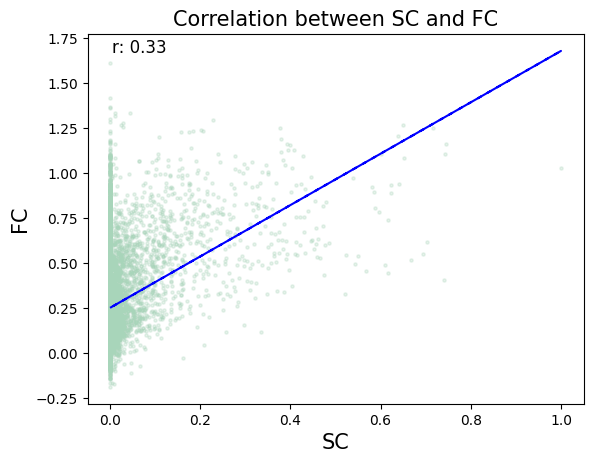

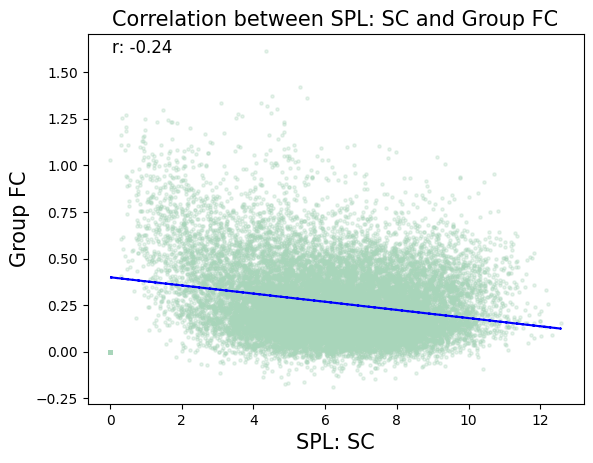

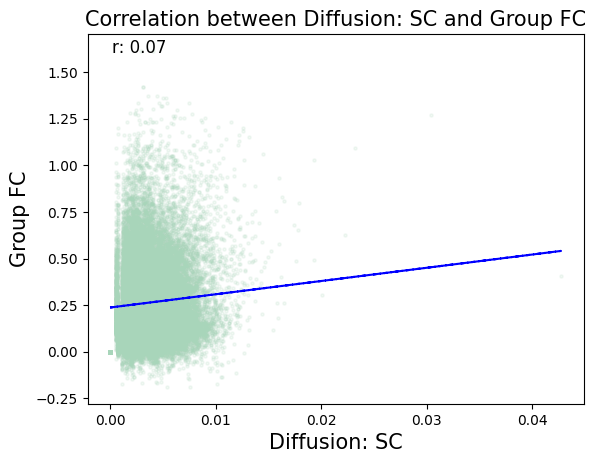

np.float64(0.07317733328488027)

In [36]:
#COMMUNICATION MODELS - TEST ON STRUCTURAL DATA

SC_matrix = weighted_NoS.to_numpy() #Weighted by number of streamlines
FC_arr = functional_data.to_numpy()

#Normalize SC matrix
min_val = np.min(SC_matrix)
max_val = np.max(SC_matrix)
SC_matrix = (SC_matrix - min_val) / (max_val - min_val)

upper_triangular_corr(SC_matrix.flatten(), FC_arr.flatten(), 'SC', 'FC')

#Shortest paths ----------------------------------------------------------------
distance_matrix = bct.distance_wei_floyd(SC_matrix, 'log')
distance_matrix = distance_matrix[0]
upper_triangular_corr(distance_matrix.flatten(), FC_arr.flatten(), 'SPL: SC', 'Group FC')


#Diffusion ---------------------------------------------------------------------
distance_matrix = bct.diffusion_efficiency(SC_matrix)
distance_matrix = distance_matrix[1] #diffusion efficiency matrix is the second return
upper_triangular_corr(distance_matrix.flatten(), FC_arr.flatten(), 'Diffusion: SC', 'Group FC')


**Summary measures:**

1.   How does FC relate to connected vs. unconnected nodes
2.   How does FC relate to Euclidean distance


Mean FC between connected nodes: 0.3893211971249689
Mean FC between unconnected nodes: 0.2467107936530068


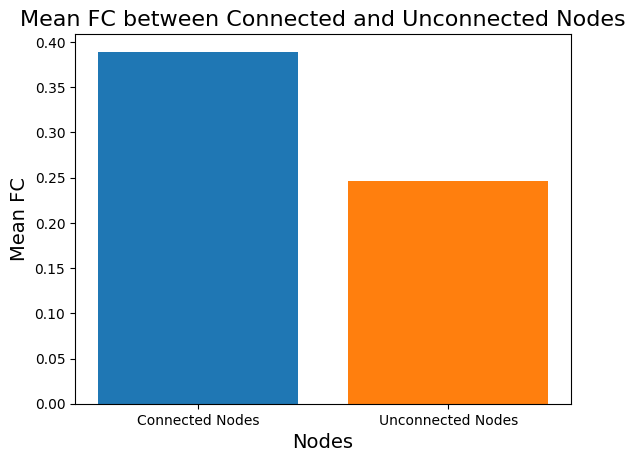

In [ ]:
#Looking at mean FC between conected and unconected nodes
connected_nodes = []
unconnected_nodes = []

SC_matrix = weighted_NoS.to_numpy()
FC_arr = functional_data.to_numpy()

for i in range(len(SC_matrix)):
  for j in range(len(SC_matrix)):
    if SC_matrix[i][j] > 0:
      connected_nodes.append(FC_arr[i][j])
    else:
      unconnected_nodes.append(FC_arr[i][j])

print("Mean FC between connected nodes:", np.mean(connected_nodes))
print("Mean FC between unconnected nodes:", np.mean(unconnected_nodes))

#Put the Mean FC values on a bar plot
labels = ['Connected Nodes', 'Unconnected Nodes']
values = [np.mean(connected_nodes), np.mean(unconnected_nodes)]

plt.bar(labels, values, color=['#1f77b4', '#ff7f0e'])
plt.xlabel('Nodes', fontsize=14)
plt.ylabel('Mean FC', fontsize=14)
plt.title('Mean FC between Connected and Unconnected Nodes', fontsize=16)
plt.show()

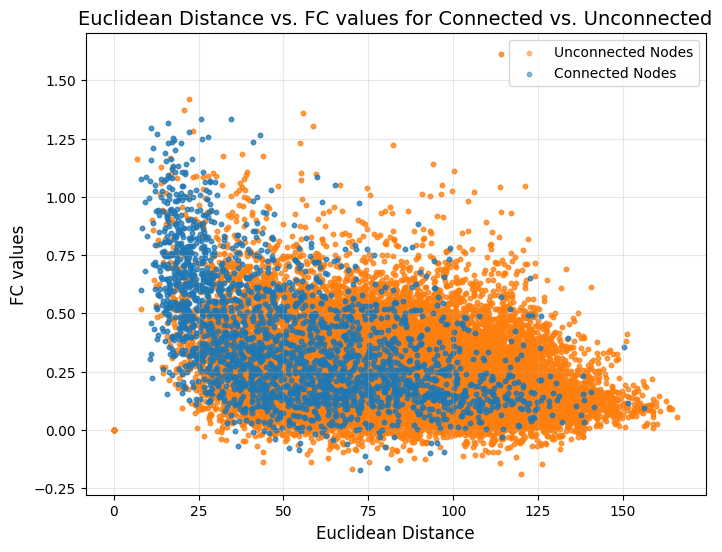

In [ ]:
#Looking at differences in Euclidean distance between connected and unconnected

# Lists to store x (Euclidean Distance) and y (FC values)
connected_nodes_x = []
connected_nodes_y = []
unconnected_nodes_x = []
unconnected_nodes_y = []

# Convert data to numpy arrays
FC_arr = functional_data.to_numpy()
EuclDist_arr = EuclDist_data.to_numpy()
SC_arr = SC_matrix # Ensure SC_matrix is a NumPy array

# Loop through the matrices
for i in range(len(EuclDist_arr)):
    for j in range(len(EuclDist_arr)):
        if SC_arr[i, j] > 0:  # Connected nodes
            connected_nodes_x.append(EuclDist_arr[i, j])  # Euclidean distance
            connected_nodes_y.append(FC_arr[i, j])  # FC values
        else:  # Unconnected nodes
            unconnected_nodes_x.append(EuclDist_arr[i, j])
            unconnected_nodes_y.append(FC_arr[i, j])

# Create a scatter plot
plt.figure(figsize=(8, 6))
plt.scatter(unconnected_nodes_x, unconnected_nodes_y, alpha=0.5, label="Unconnected Nodes", color='#ff7f0e', s=10)
plt.scatter(connected_nodes_x, connected_nodes_y, alpha=0.5, label="Connected Nodes", color='#1f77b4', s=10)


# Labels and title
plt.xlabel('Euclidean Distance', fontsize=12)
plt.ylabel('FC values', fontsize=12)
plt.title('Euclidean Distance vs. FC values for Connected vs. Unconnected', fontsize=14)
plt.legend()
plt.grid(alpha=0.3)

# Show plot
plt.show()


**Deriving T1 similarity**

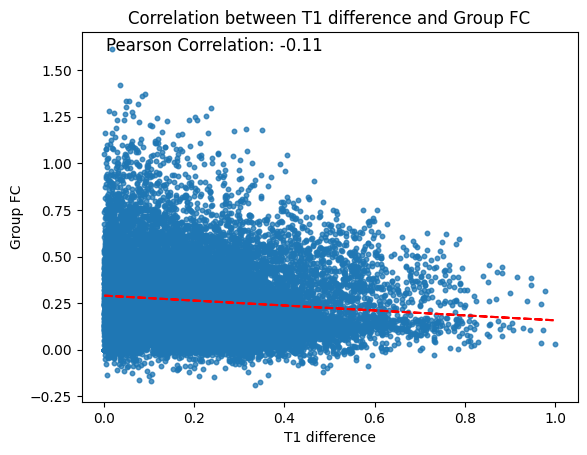

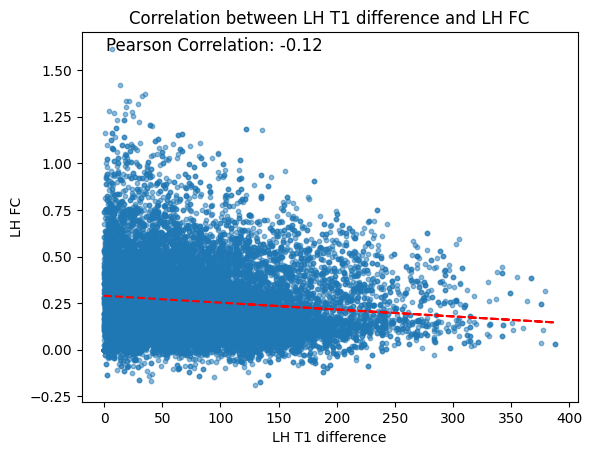

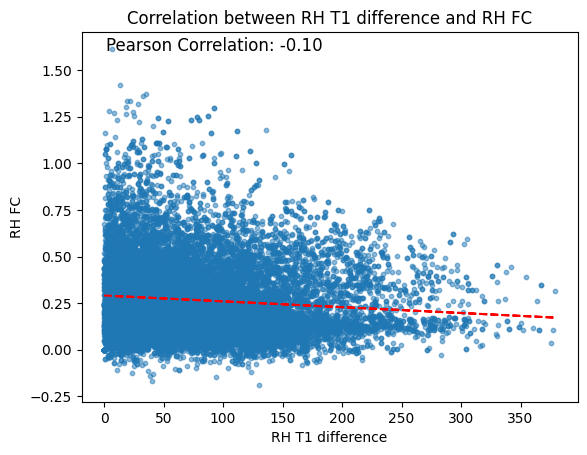

np.float64(-0.09726462193737123)

In [ ]:
#T1 SIMILARITY

#Extract R1 data
R1 = cortical_data['Mean R1']
R1 = R1[1:] #remove blank row

#Convert R1 to T1 data
T1 = 1/R1
T1 = T1.to_frame(name='Mean T1')

#Build a 200x200 T1 difference matrix
values = T1['Mean T1'].values
diff_matrix = np.abs(values[:, np.newaxis] - values[np.newaxis, :])


#Min max normalize the T1 difference matrix
diff_matrix_std = (diff_matrix - diff_matrix.min()) / (diff_matrix.max() - diff_matrix.min())


#Compute upper triangular correlations between T1 similarity and FC data

#flatten arrays
t1_diff = diff_matrix_std.flatten()
FC_arr = functional_data.to_numpy()
FC = FC_arr.flatten() #why is flattnning leading to a loss of values

#WHOLE-BRAIN CORRELATION (upper triangle)
upper_triangular_corr(t1_diff, FC, 'T1 difference', 'Group FC')

#HEMISPHERIC CORRELATIONS
LH_t1_diff = diff_matrix[0:100]
LH_FC = FC_arr[0:100]
upper_triangular_corr(LH_t1_diff.flatten(), LH_FC.flatten(), 'LH T1 difference', 'LH FC')

RH_t1_diff = diff_matrix[100:200]
RH_FC = FC_arr[100:200]
upper_triangular_corr(RH_t1_diff.flatten(), RH_FC.flatten(), 'RH T1 difference', 'RH FC')


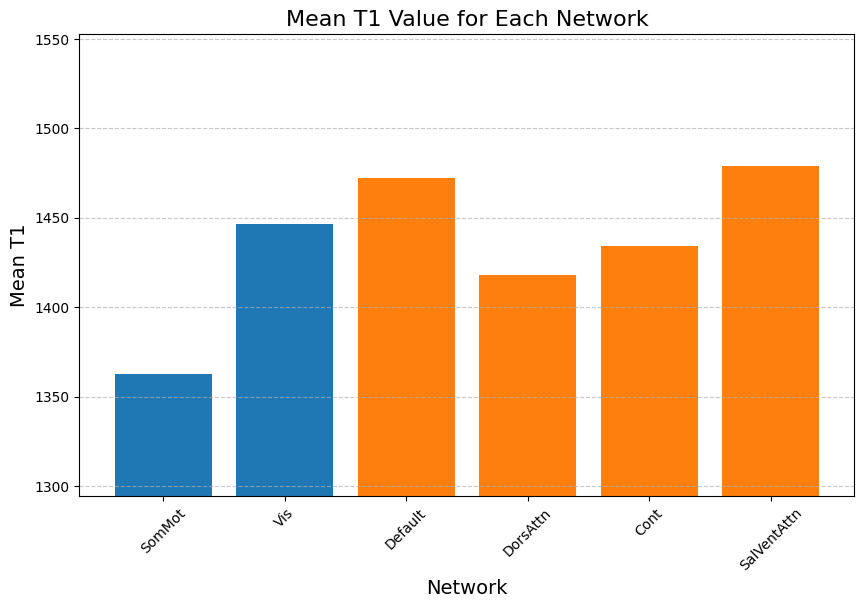

In [ ]:
#Looking at T1 network seperation
# Combine LH and RH maps
FC_map = {}

# Merge LH and RH maps
for network in set(LH_FC_map.keys()).union(RH_FC_map.keys()):
    FC_map[network] = LH_FC_map.get(network, []) + RH_FC_map.get(network, [])

mean_T1 = {}

for network, indices in FC_map.items():
    zero_based_indices = [i - 1 for i in indices]  # Convert to 0-based indices
    mean_T1[network] = T1.iloc[zero_based_indices].mean().values[0]

# Convert to DataFrame for plotting
mean_T1_df = pd.DataFrame(mean_T1.items(), columns=['Network', 'Mean T1'])

# Reorder DataFrame: Put 'SomMot' and 'Vis' first
custom_order = ['SomMot', 'Vis'] + [net for net in mean_T1_df['Network'] if net not in ['SomMot', 'Vis']]
mean_T1_df = mean_T1_df.set_index('Network').loc[custom_order].reset_index()

# Assign colors: Blue for 'SomMot' & 'Vis', Orange for others
colors = ['#1f77b4' if net in ['SomMot', 'Vis'] else '#ff7f0e' for net in mean_T1_df['Network']]

# Plot
plt.figure(figsize=(10, 6))
plt.bar(mean_T1_df['Network'], mean_T1_df['Mean T1'], color= colors)
plt.xlabel('Network', fontsize=14)
plt.ylabel('Mean T1', fontsize=14)
plt.title('Mean T1 Value for Each Network', fontsize=16)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
# Adjust y-axis limits for better contrast
mt_min = mean_T1_df['Mean T1'].min()
mt_max = mean_T1_df['Mean T1'].max()
plt.ylim(mt_min * 0.95, mt_max * 1.05)  # Shrinks range by 5%

plt.show()


Vis
[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]


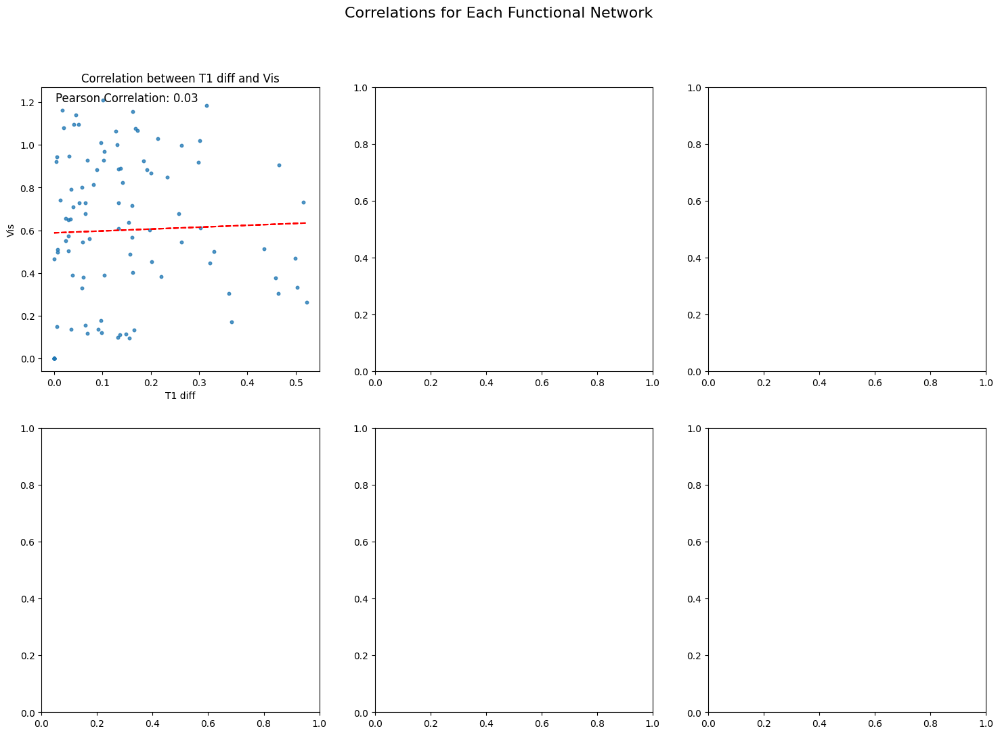

SomMot
[15, 12, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30]


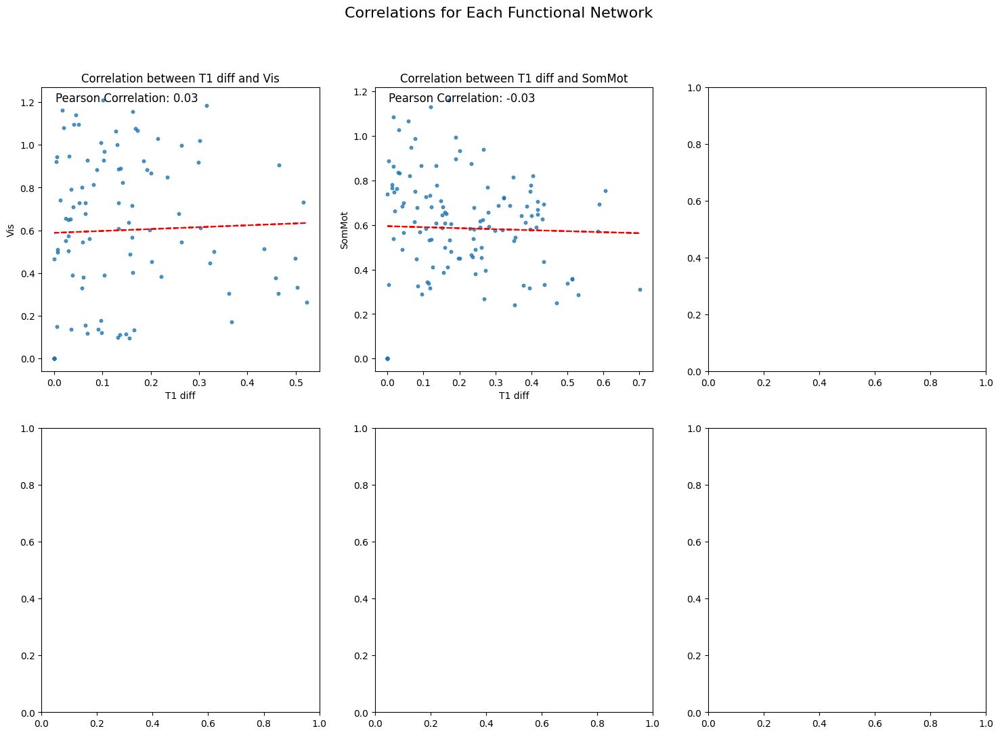

DorsAttn
[31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43]


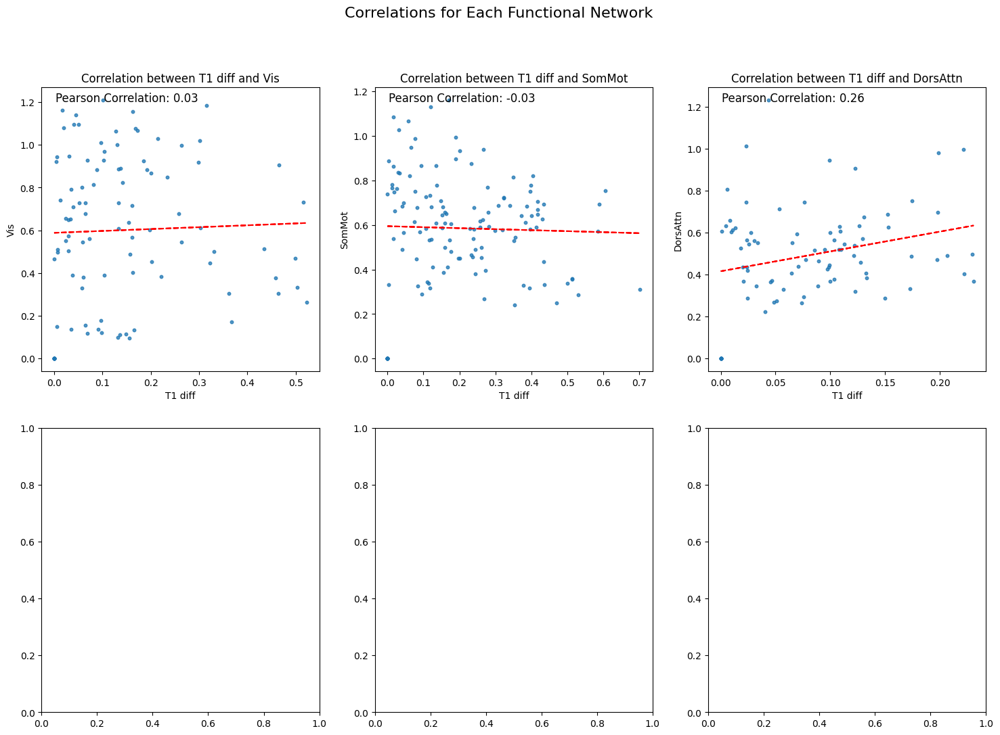

SalVentAttn
[44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]


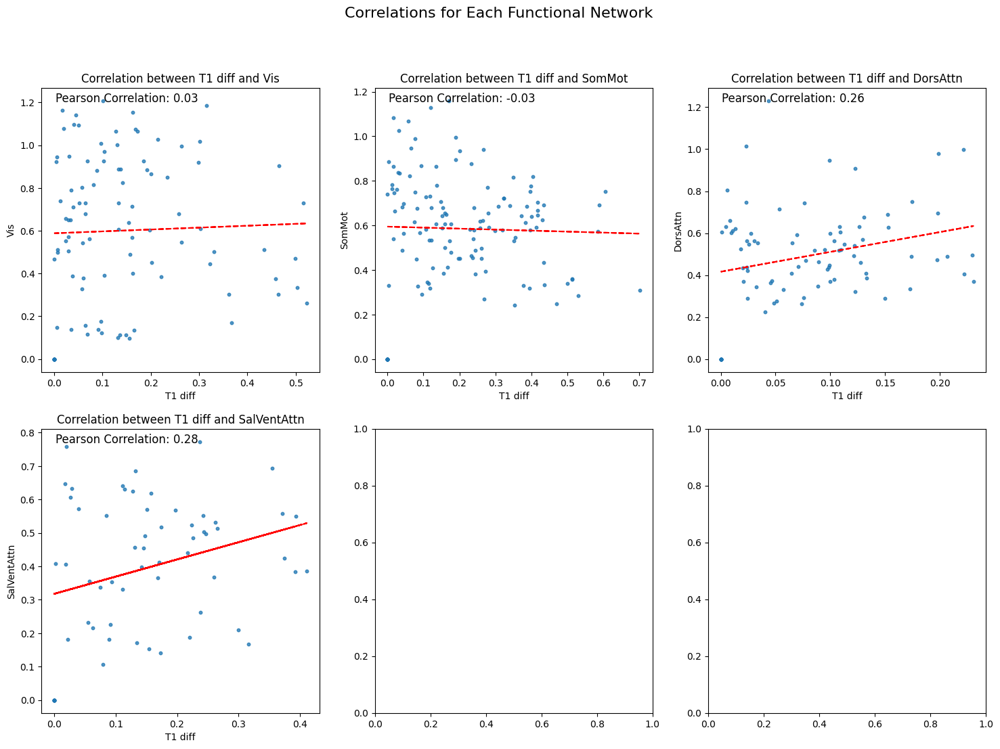

Cont
[61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73]


KeyboardInterrupt: 

In [ ]:
#T1 similarity network level correlations
subplots_per_net(LH_FC_map, diff_matrix_std, "T1 diff", FC_arr, "FC")
subplots_per_net(RH_FC_map, diff_matrix_std, "T1 diff", FC_arr, "FC") #this is raising an indexing error

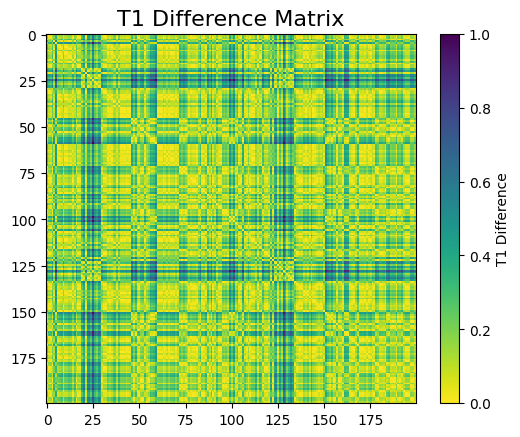

In [ ]:
#Plotting T1 similarity Network plt.figure(figsize=(10, 8))
plt.imshow(diff_matrix_std, cmap='viridis_r', interpolation='nearest')
plt.colorbar(label='T1 Difference')
plt.title('T1 Difference Matrix', fontsize=16)
plt.show()

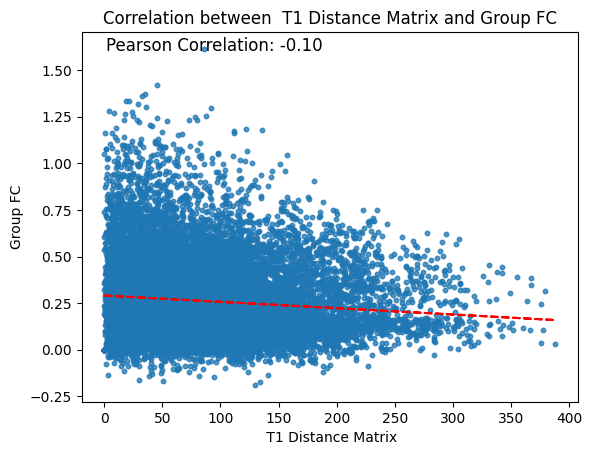

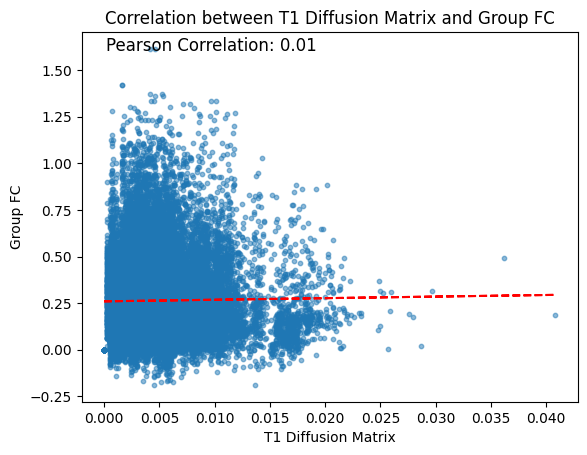

np.float64(0.013771617068028423)

In [ ]:
#COMMUNICATION MODELS WITH EDGES WEIGHTED BY T1

#Created weighted structural matrix
binary_connections = SC_data.to_numpy() #binary connections
diff_matrix_safe = np.where(diff_matrix == 0, 0.00001, diff_matrix) #Need to catch 0 values for diff matrix and make them small
T1_weighted = binary_connections * diff_matrix_safe

#Shortest paths ----------------------------------------------------------------

#log transform not needed because larger differencs = longer pathes
distance_matrix = bct.distance_wei_floyd(T1_weighted)
distance_matrix = distance_matrix[0]
upper_triangular_corr(distance_matrix.flatten(), FC_arr.flatten(), ' T1 Distance Matrix', 'Group FC')

#Diffusion ---------------------------------------------------------------------

distance_matrix = bct.diffusion_efficiency(T1_weighted)
distance_matrix = distance_matrix[1] #diffusion efficiency matrix is the second return
upper_triangular_corr(distance_matrix.flatten(), FC_arr.flatten(), 'T1 Diffusion Matrix', 'Group FC')


**Deriving MTsat similarity**

1      0.009419
2      0.009256
3      0.009110
4      0.009035
5      0.009358
         ...   
196    0.008105
197    0.008110
198    0.010081
199    0.009561
200    0.009286
Name: Mean MTsat, Length: 200, dtype: float64


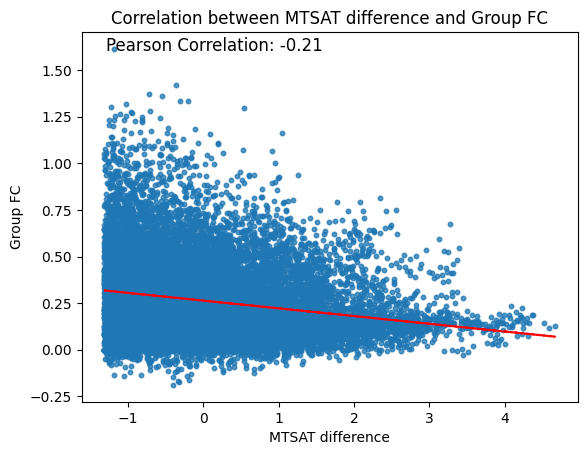

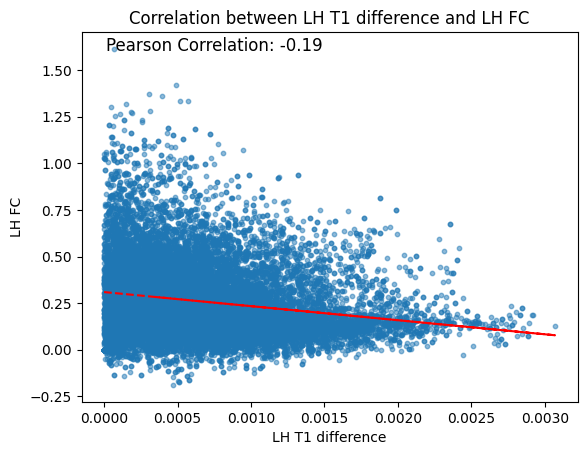

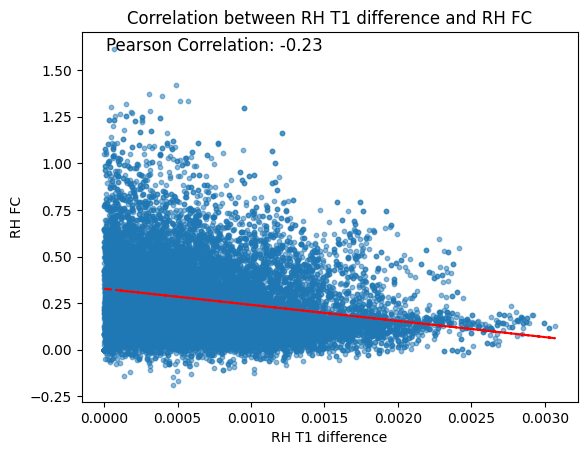

np.float64(-0.23104007944850055)

In [ ]:
#Deriving MTSat similarity matrix
#print(cortical_data.head())

#Extract MTSat data
MTSat = cortical_data['Mean MTsat']

#remove top row
MTSat = MTSat[1:] #remove blank row
print(MTSat)


#Build a 200x200 T1 difference matrix
values = MTSat.values
diff_matrix = np.abs(values[:, np.newaxis] - values[np.newaxis, :])

#Standardize (Z-score normalize difference matrix) -> Is this really what I want to do here?
diff_matrix_std = (diff_matrix - diff_matrix.mean()) / diff_matrix.std()

#min max normalize instead
#diff_matrix_std = (diff_matrix - diff_matrix.min()) / (diff_matrix.max() - diff_matrix.min())

#Compute upper triangular correlations between T1 similarity and FC data

#flatten arrays
mtsat_diff = diff_matrix_std.flatten()
FC_arr = functional_data.to_numpy()
FC = FC_arr.flatten() #why is flattnning leading to a loss of values

#WHOLE-BRAIN CORRELATION (upper triangle)
upper_triangular_corr(mtsat_diff, FC, 'MTSAT difference', 'Group FC')

#HEMISPHERIC CORRELATIONS
LH_t1_diff = diff_matrix[0:100]
LH_FC = FC_arr[0:100]
upper_triangular_corr(LH_t1_diff.flatten(), LH_FC.flatten(), 'LH T1 difference', 'LH FC')

RH_t1_diff = diff_matrix[100:200]
RH_FC = FC_arr[100:200]
upper_triangular_corr(RH_t1_diff.flatten(), RH_FC.flatten(), 'RH T1 difference', 'RH FC')


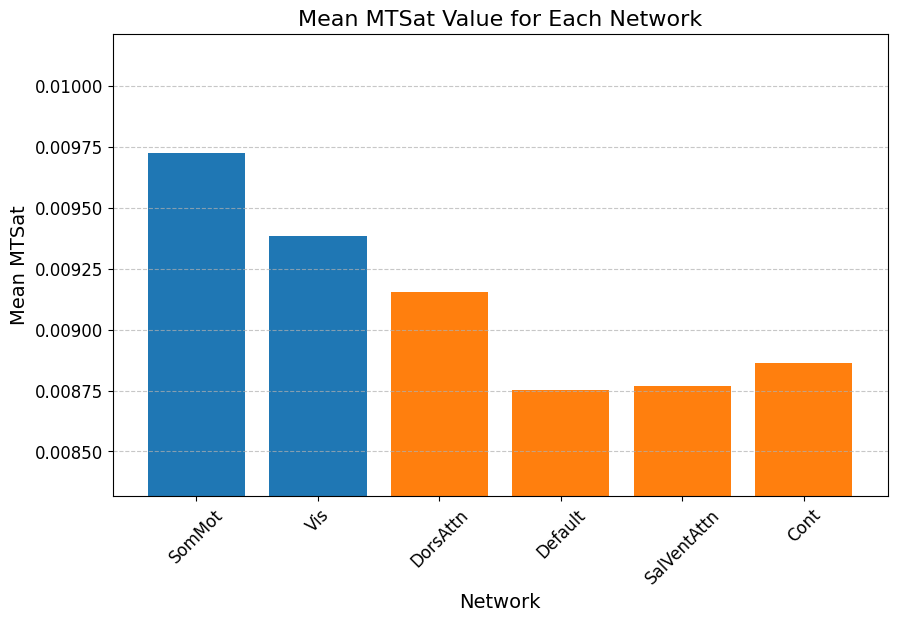

In [ ]:
#Looking at MTSat network seperation
# Combine LH and RH maps

MTSat = cortical_data['Mean MTsat']
MTSat = MTSat[1:] #remove blank row

FC_map = {}

# Merge LH and RH maps
for network in set(LH_FC_map.keys()).union(RH_FC_map.keys()):
    FC_map[network] = LH_FC_map.get(network, []) + RH_FC_map.get(network, [])

MT = {}

for network, indices in FC_map.items():
    zero_based_indices = [i - 1 for i in indices]  # Convert to 0-based indices
    MT[network] = MTSat.iloc[zero_based_indices].mean()

# Convert to DataFrame for plotting
MT_df = pd.DataFrame(MT.items(), columns=['Network', 'Mean MTSat'])
# Reorder DataFrame: Put 'SomMot' and 'Vis' first
custom_order = ['SomMot', 'Vis'] + [net for net in MT_df['Network'] if net not in ['SomMot', 'Vis']]
MT_df = MT_df.set_index('Network').loc[custom_order].reset_index()

# Assign colors: Blue for 'SomMot' & 'Vis', Orange for others
colors = ['#1f77b4' if net in ['SomMot', 'Vis'] else '#ff7f0e' for net in MT_df['Network']]

# Plot
plt.figure(figsize=(10, 6))
plt.bar(MT_df['Network'], MT_df['Mean MTSat'], color=colors)
plt.xlabel('Network', fontsize=14)   # Larger x-axis label
plt.ylabel('Mean MTSat', fontsize=14) # Larger y-axis label
plt.title('Mean MTSat Value for Each Network', fontsize=16)  # Larger title
plt.xticks(rotation=45, fontsize=12)  # Larger x-ticks
plt.yticks(fontsize=12)  # Larger y-ticks
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Adjust y-axis limits for better contrast
mt_min = MT_df['Mean MTSat'].min()
mt_max = MT_df['Mean MTSat'].max()
plt.ylim(mt_min * 0.95, mt_max * 1.05)  # Shrinks range by 5%

plt.show()

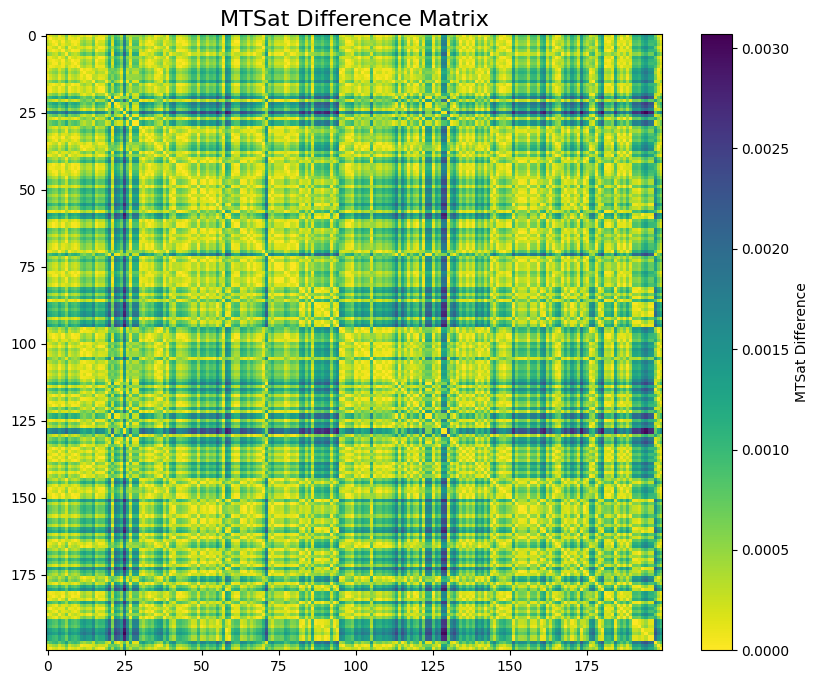

In [ ]:
#Plot the MTSat difference matrix
plt.figure(figsize=(10, 8))
plt.imshow(diff_matrix, cmap='viridis_r', interpolation='nearest')
plt.colorbar(label='MTSat Difference')
plt.title('MTSat Difference Matrix', fontsize=16)
plt.show()

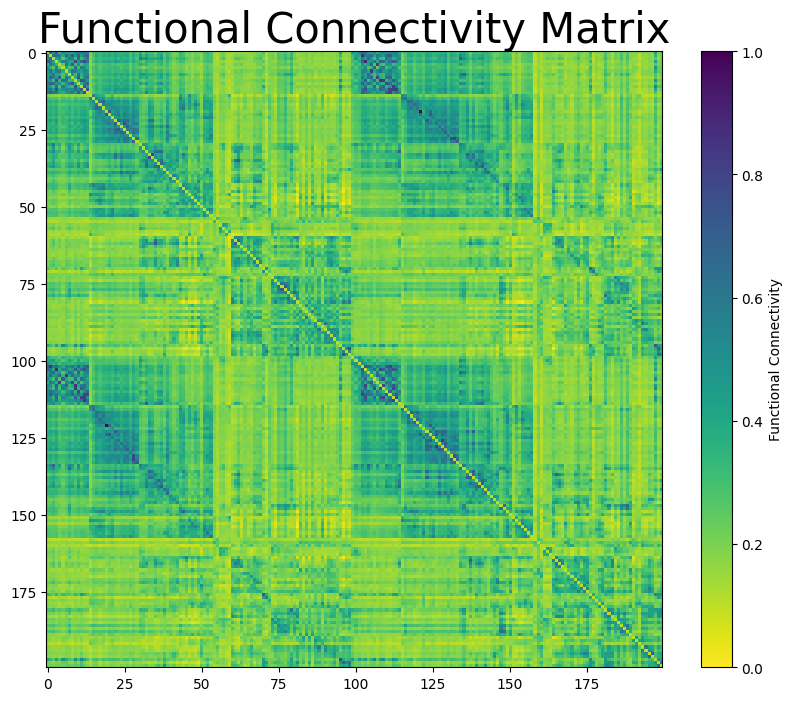

In [ ]:
#Min max normalize FC
min_val = np.min(FC_arr)
max_val = np.max(FC_arr)
FC_arr = (FC_arr - min_val) / (max_val - min_val)
functional_data = pd.DataFrame(FC_arr)

#Plot the functional connectivity matrix
plt.figure(figsize=(10, 8))
plt.imshow(functional_data, cmap='viridis_r', interpolation='nearest')
plt.colorbar(label='Functional Connectivity')
plt.title('Functional Connectivity Matrix', fontsize=30)
plt.show()

Vis
[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]


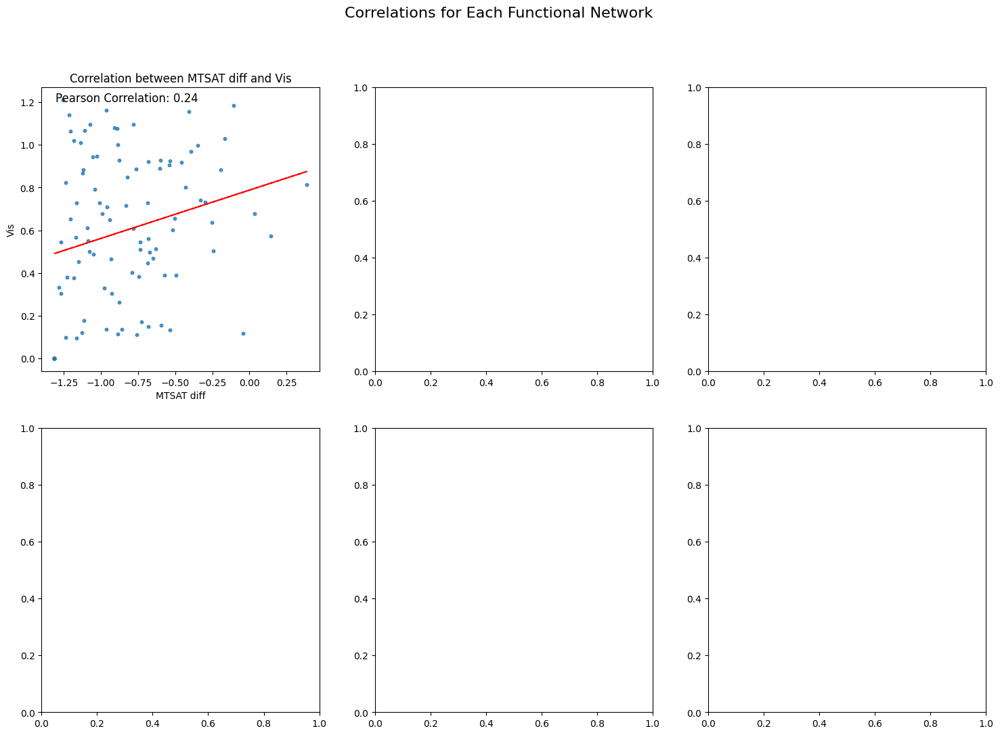

SomMot
[15, 12, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30]


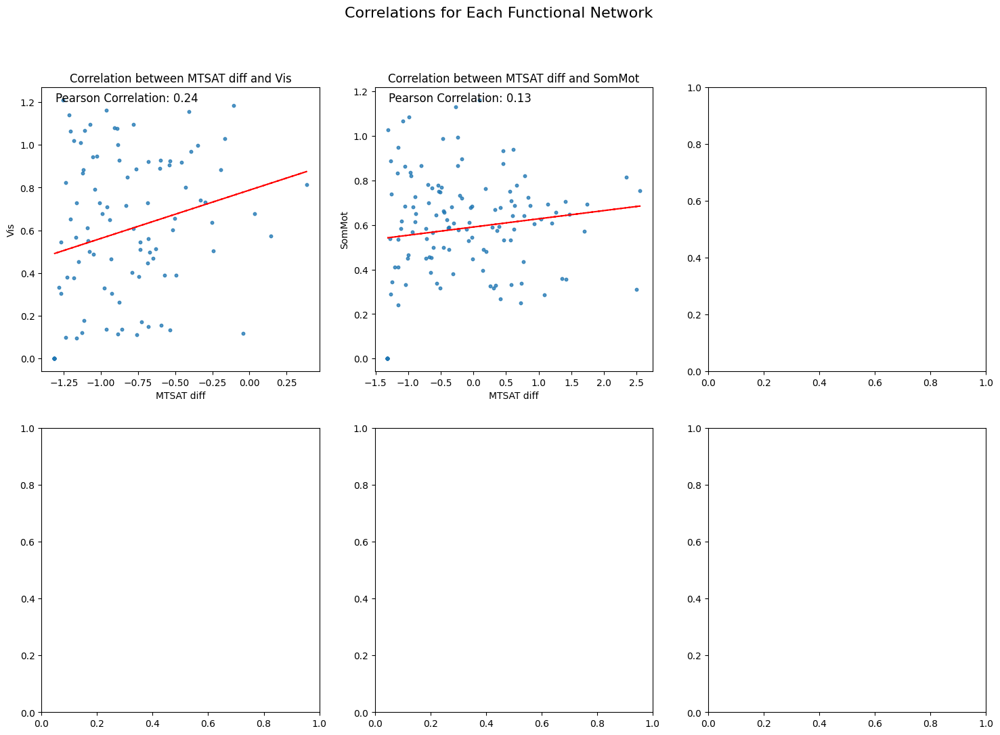

DorsAttn
[31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43]


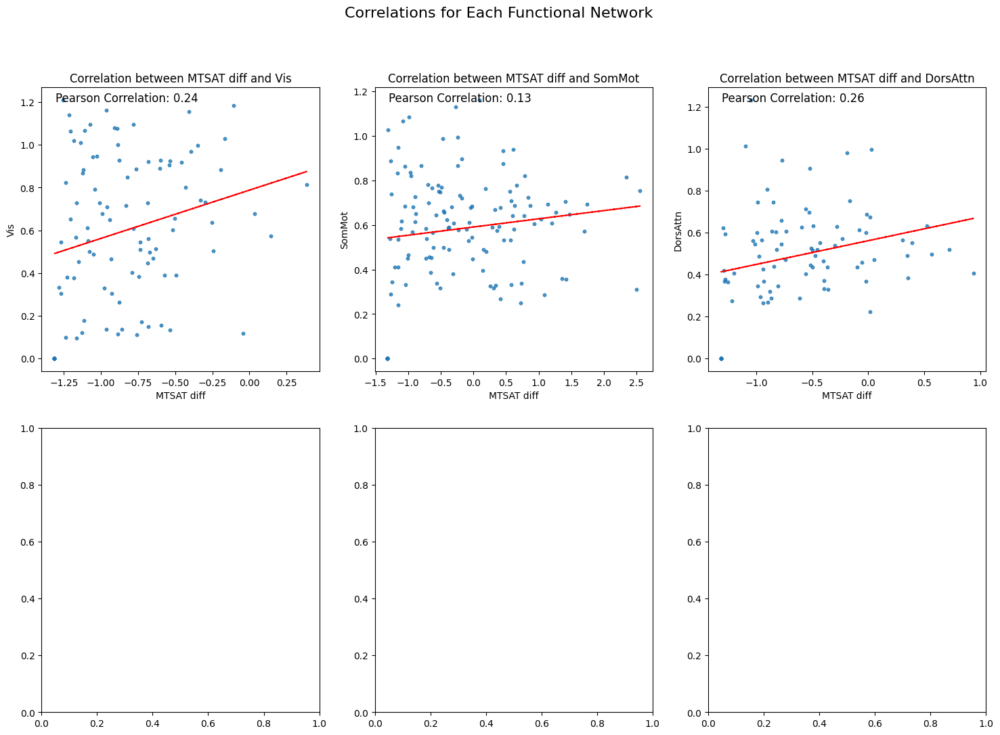

SalVentAttn
[44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]


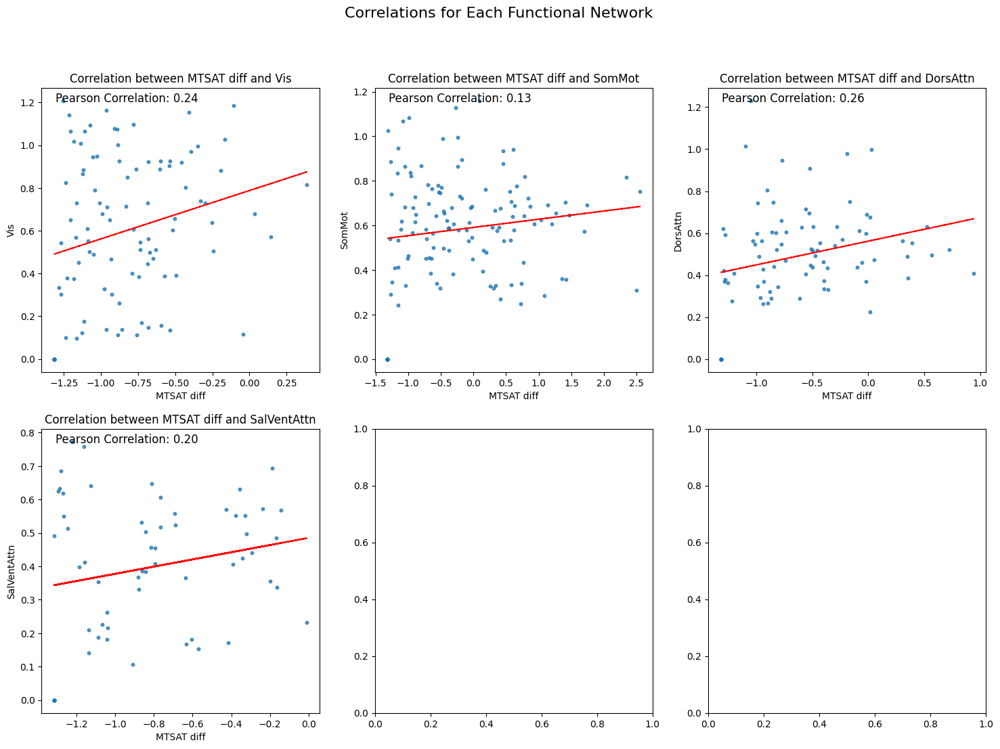

Cont
[61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73]


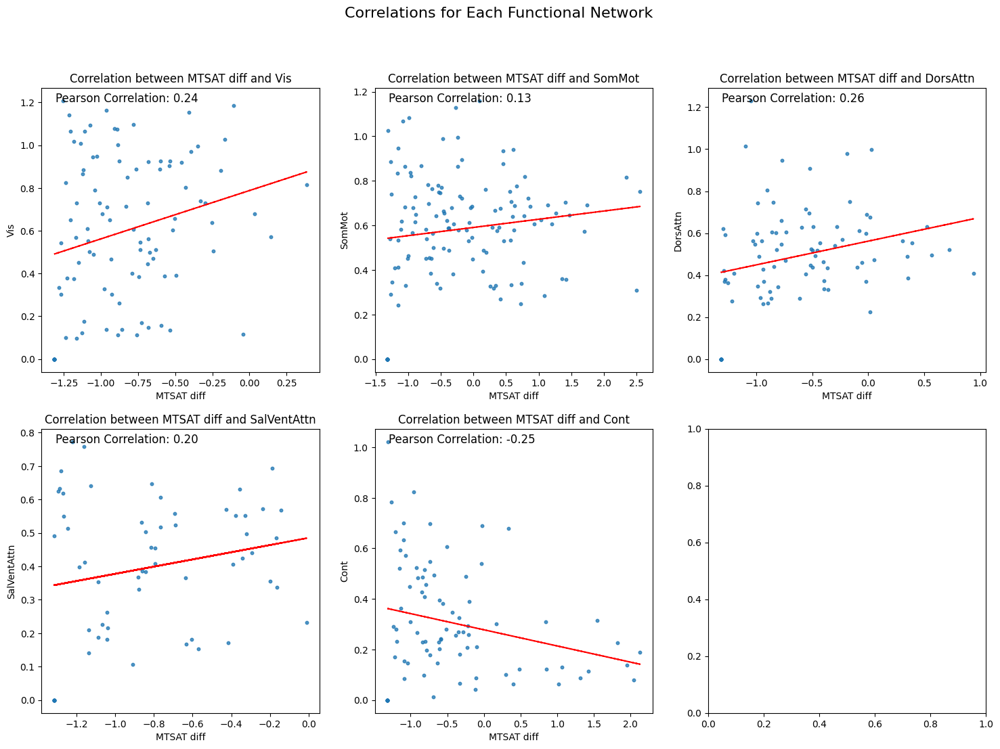

Default
[74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100]


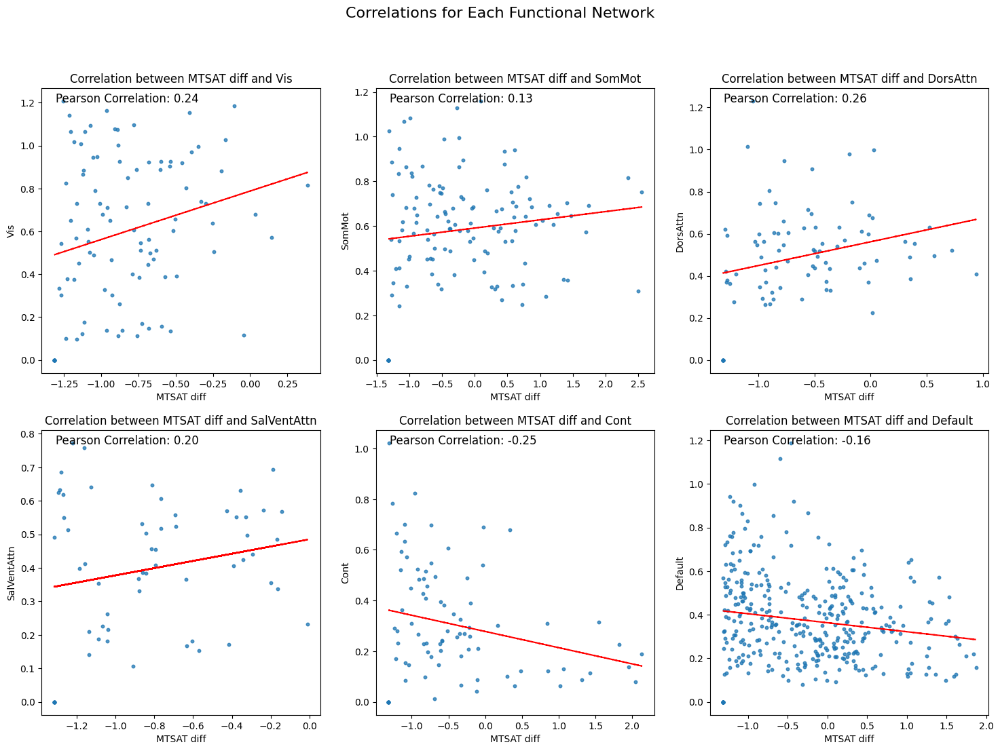

<Figure size 640x480 with 0 Axes>

Vis
[101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115]


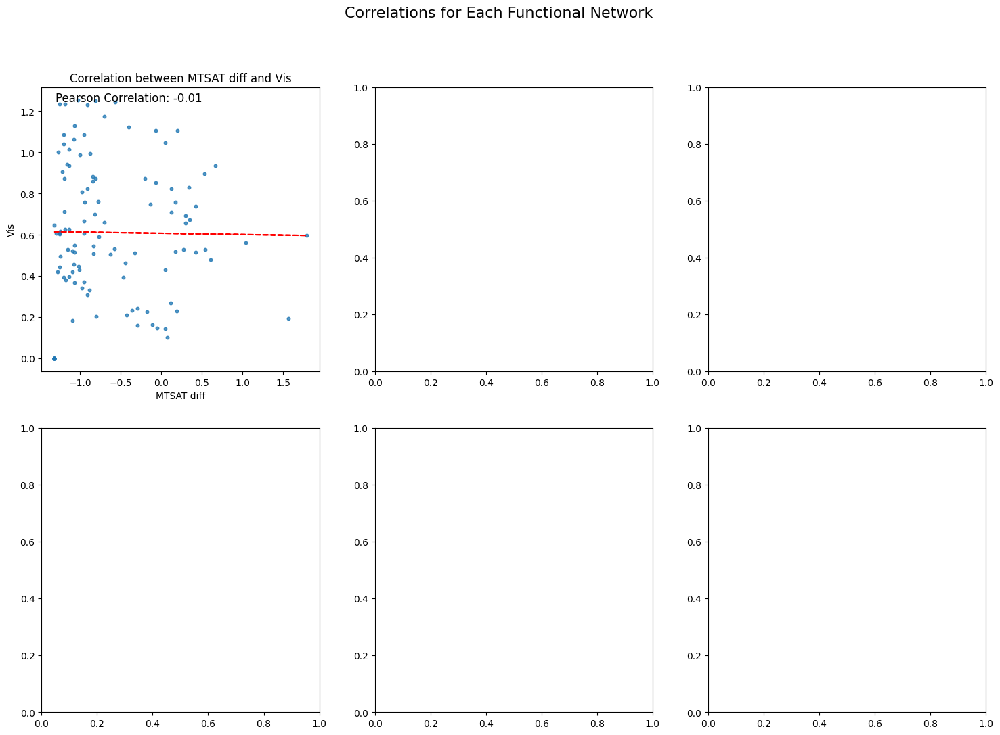

SomMot
[116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134]


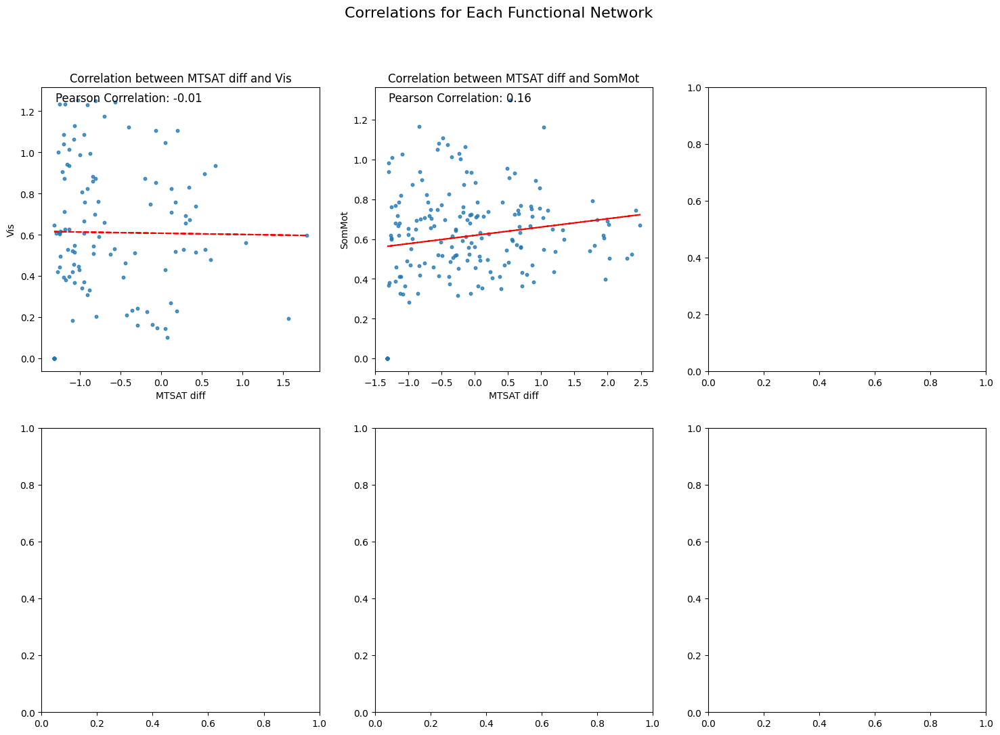

DorsAttn
[135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147]


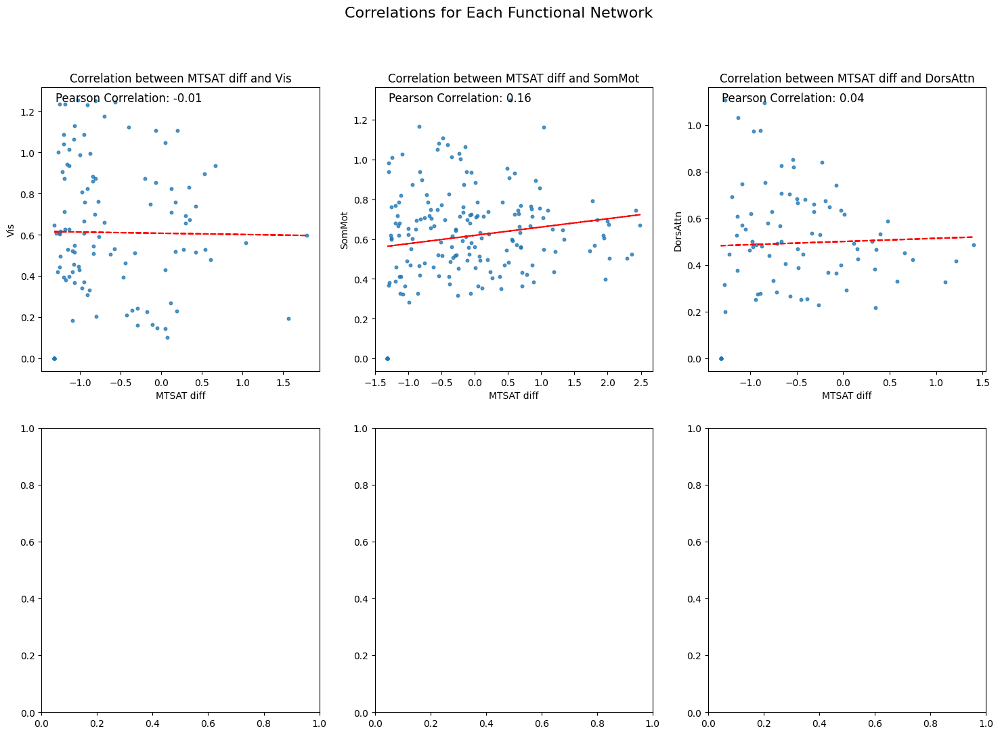

SalVentAttn
[148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158]


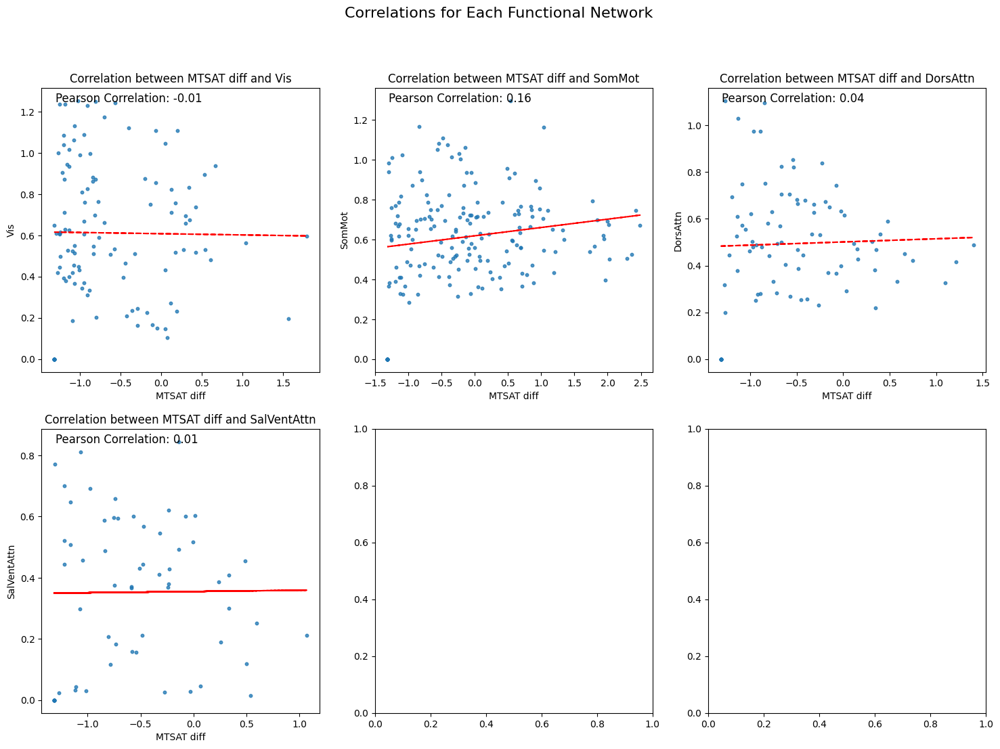

Cont
[165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181]


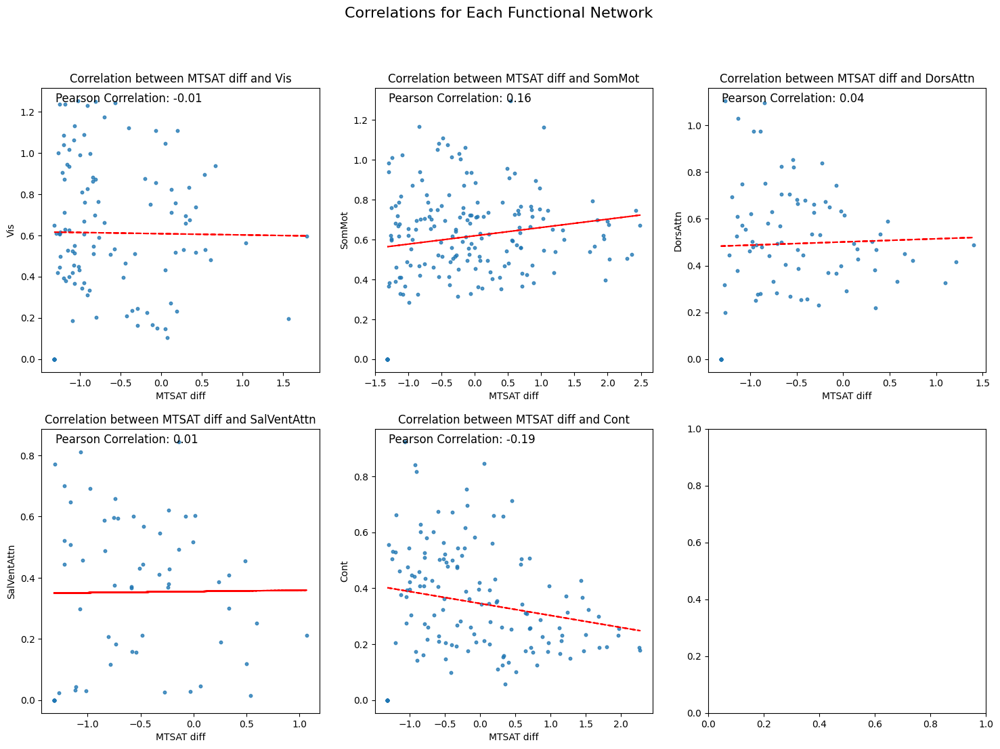

Default
[182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200]


IndexError: index 200 is out of bounds for axis 0 with size 200

In [ ]:
#Network level MTsat FC
subplots_per_net(LH_FC_map, diff_matrix_std, "MTSAT diff", FC_arr, "FC")
subplots_per_net(RH_FC_map, diff_matrix_std, "MTSAT diff", FC_arr, "FC") #index out of bounds error here

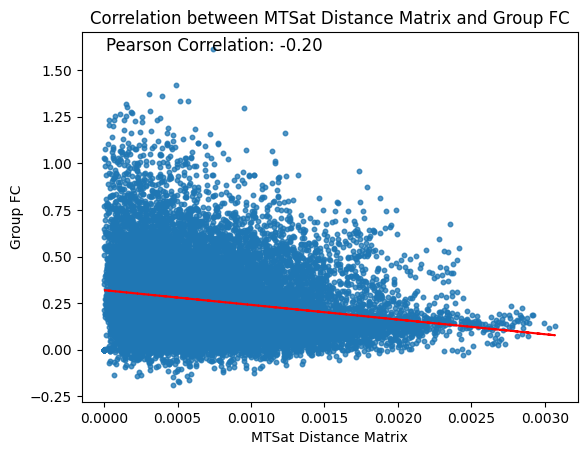

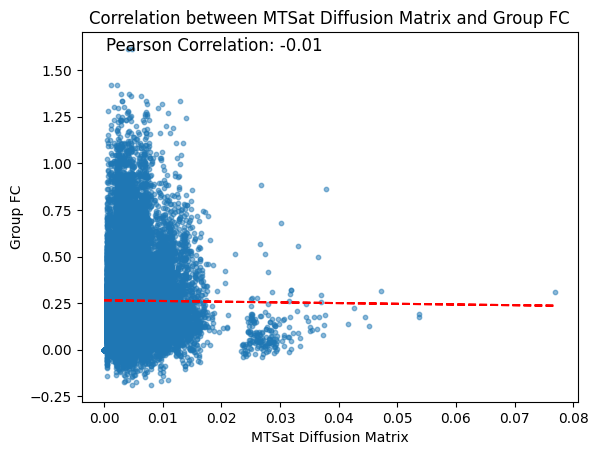

np.float64(-0.00658548088751258)

In [ ]:
#COMMUNICATION MODELS WITH EDGES WEIGHTED BY MTSat

#Created weighted structural matrix
binary_connections = SC_data.to_numpy() #binary connections
diff_matrix_safe = np.where(diff_matrix == 0, 0.00001, diff_matrix) #Need to catch 0 values for diff matrix and make them small
MTSat_weighted = binary_connections * diff_matrix_safe

#Shortest paths ----------------------------------------------------------------

#log transform not needed because larger differencs = longer pathes
distance_matrix = bct.distance_wei_floyd(MTSat_weighted)
distance_matrix = distance_matrix[0]
upper_triangular_corr(distance_matrix.flatten(), FC_arr.flatten(), 'MTSat Distance Matrix', 'Group FC')

#Diffusion ---------------------------------------------------------------------

distance_matrix = bct.diffusion_efficiency(MTSat_weighted)
distance_matrix = distance_matrix[1] #diffusion efficiency matrix is the second return
upper_triangular_corr(distance_matrix.flatten(), FC_arr.flatten(), 'MTSat Diffusion Matrix', 'Group FC')

Pearson correlation coefficient: -0.5838806801177714
p-value: 1.1421591584438517e-19
200
200


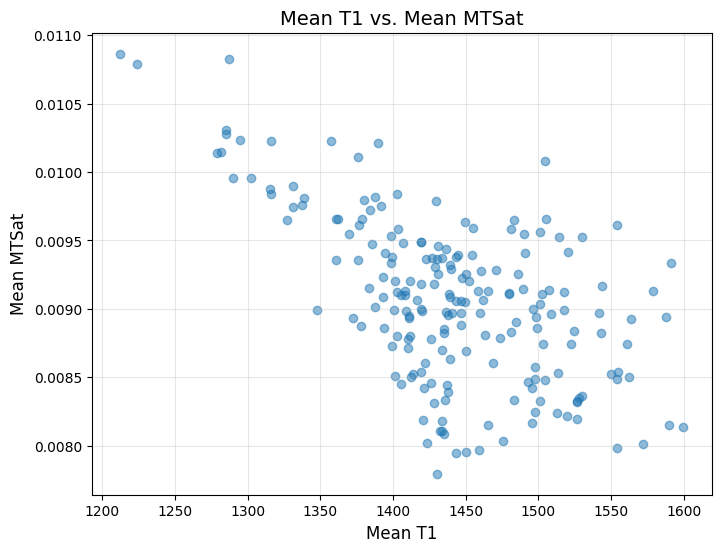

In [ ]:
#Colinearity between MTsat and T1 matrix
T1_values = T1['Mean T1'].values
MTSat_values = MTSat.values
pearsonr_result = pearsonr(T1_values, MTSat_values)
print("Pearson correlation coefficient:", pearsonr_result[0])
print("p-value:", pearsonr_result[1])

print(len(T1_values))
print(len(MTSat_values))
#Plot this relationship
plt.figure(figsize=(8, 6))
plt.scatter(T1_values, MTSat_values, alpha=0.5)
plt.xlabel('T1', fontsize=12)
plt.ylabel('MTSat', fontsize=12)
plt.title('Mean T1 vs. Mean MTSat', fontsize=14)
plt.grid(alpha=0.3)
plt.show()

**Deriving Morphometric Similarity**

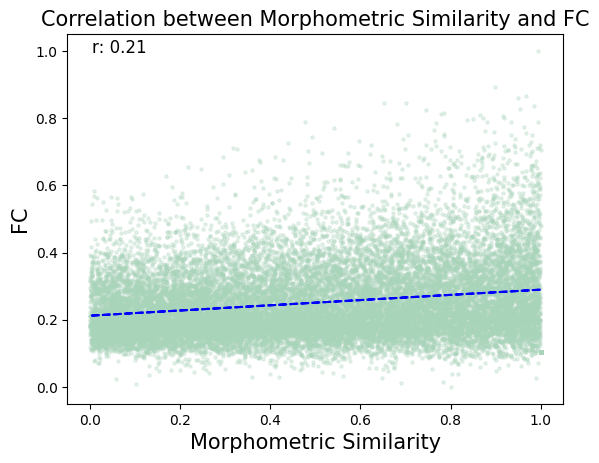

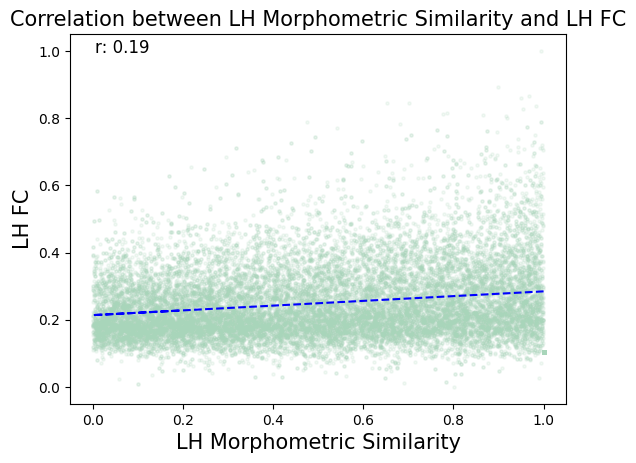

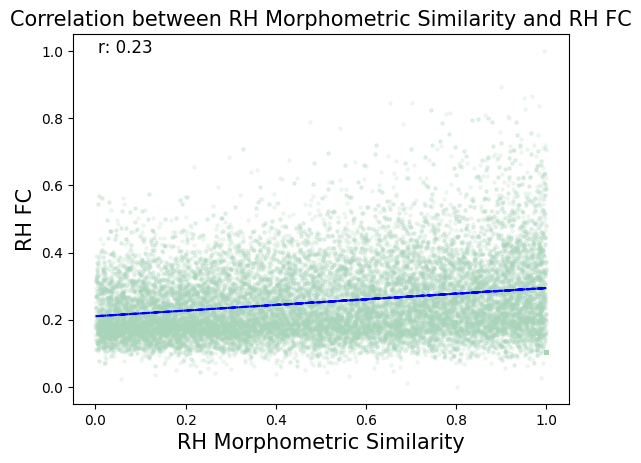

np.float64(0.23058129343685027)

In [15]:
#MORPHOMETRIC SIMILARITY -> Took T1 out (only includes MTsat)
'''
To do: comment code so that you can clearly see the process
Look at correlations on a network level
'''

#Create feature df containing: total curvature, total area, total volume, mean thickness, Mean MTSat and MeanR1
feature_df = pd.DataFrame()

#Build morphometric features dataframe

feature_df['Total Curvature'] = cortical_data[' Total_Curvature']
feature_df['Total Area'] = cortical_data[' Total_Area']
feature_df['Total Volume'] = cortical_data[' Total_Volume']
feature_df['Mean Thickness'] = cortical_data[' Mean_Thickness']
feature_df['Mean MTSat'] = cortical_data['Mean MTsat']
#feature_df['Mean R1'] = cortical_data['Mean R1']

#feature_df['Mean R1'] = 1 / feature_df['Mean R1'] #invert to make T1 values

#drop first row from feature_df - it's empty
feature_df = feature_df.iloc[1:]

#Compute morphometric simialrity of objects in the dataframe
features_normalized = zscore(feature_df, axis=0)
MSN_matrix = 1 - squareform(pdist(features_normalized, metric='correlation'))

#Min max normalize the MSN array
min_val = np.min(MSN_matrix)
max_val = np.max(MSN_matrix)
MSN_matrix = (MSN_matrix - min_val) / (max_val - min_val)

#Look at whole brain correlation between MSN matrix and FC matrix
FC_arr = functional_data.to_numpy()
min_val = np.min(FC_arr)
max_val = np.max(FC_arr)
FC_arr = (FC_arr - min_val) / (max_val - min_val)

upper_triangular_corr(MSN_matrix.flatten(), FC_arr.flatten(), 'Morphometric Similarity', 'FC')

#Look at left and right hemisphere
LH_MSN = MSN_matrix[0:100]
LH_FC = FC_arr[0:100]
upper_triangular_corr(LH_MSN.flatten(), LH_FC.flatten(), 'LH Morphometric Similarity', 'LH FC')

RH_MSN = MSN_matrix[100:200]
RH_FC = FC_arr[100:200]
upper_triangular_corr(RH_MSN.flatten(), RH_FC.flatten(), 'RH Morphometric Similarity', 'RH FC')

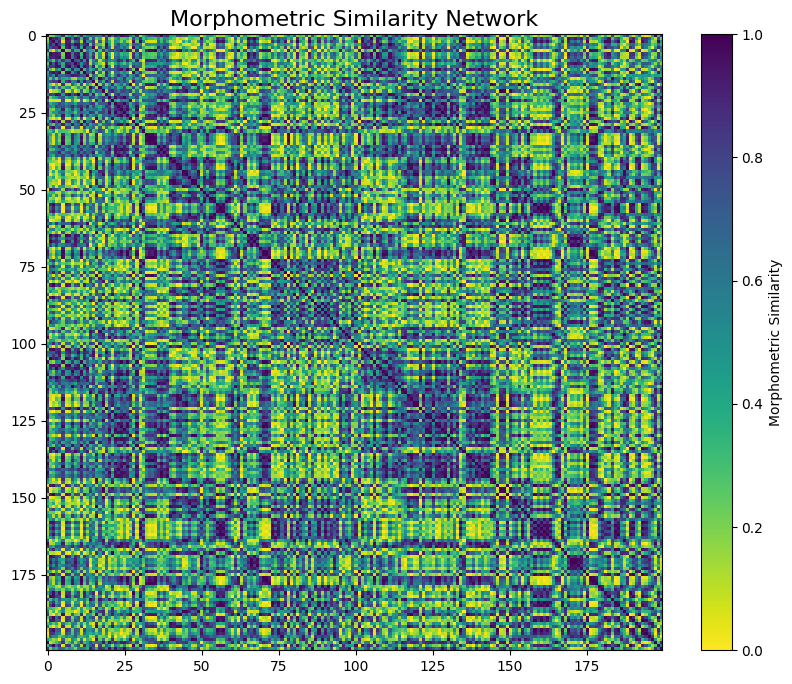

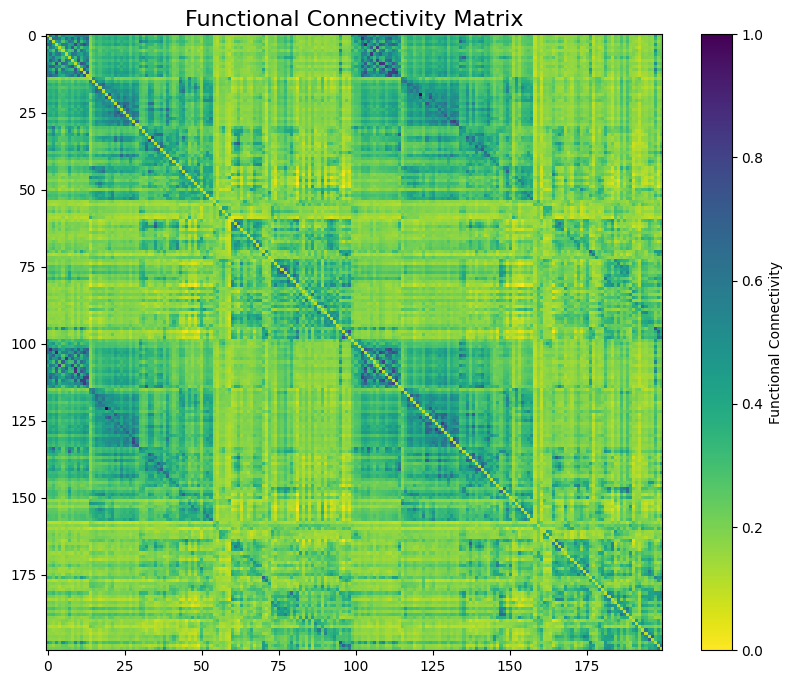

In [ ]:
#Plot the Morphometric Similarity Difference Matrix
plt.figure(figsize=(10, 8))
plt.imshow(MSN_matrix, cmap='viridis_r', interpolation='nearest')
plt.colorbar(label='Morphometric Similarity')
plt.title('Morphometric Similarity Network', fontsize=16)
plt.show()

#Plot the functional connectivity difference matrix
#min max normalize FC_arr
min_val = np.min(FC_arr)
max_val = np.max(FC_arr)
FC_arr = (FC_arr - min_val) / (max_val - min_val)

plt.figure(figsize=(10, 8))
plt.imshow(FC_arr, cmap='viridis_r', interpolation='nearest')
plt.colorbar(label='Functional Connectivity')
plt.title('Functional Connectivity Matrix', fontsize=16)
plt.show()

Vis
[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]


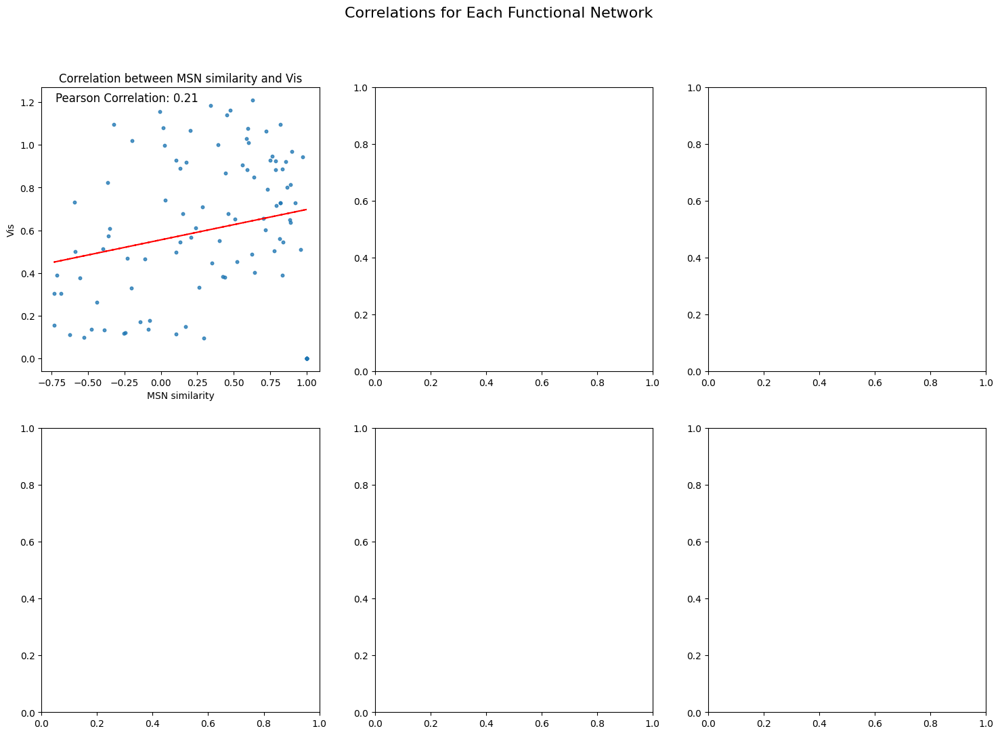

SomMot
[15, 12, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30]


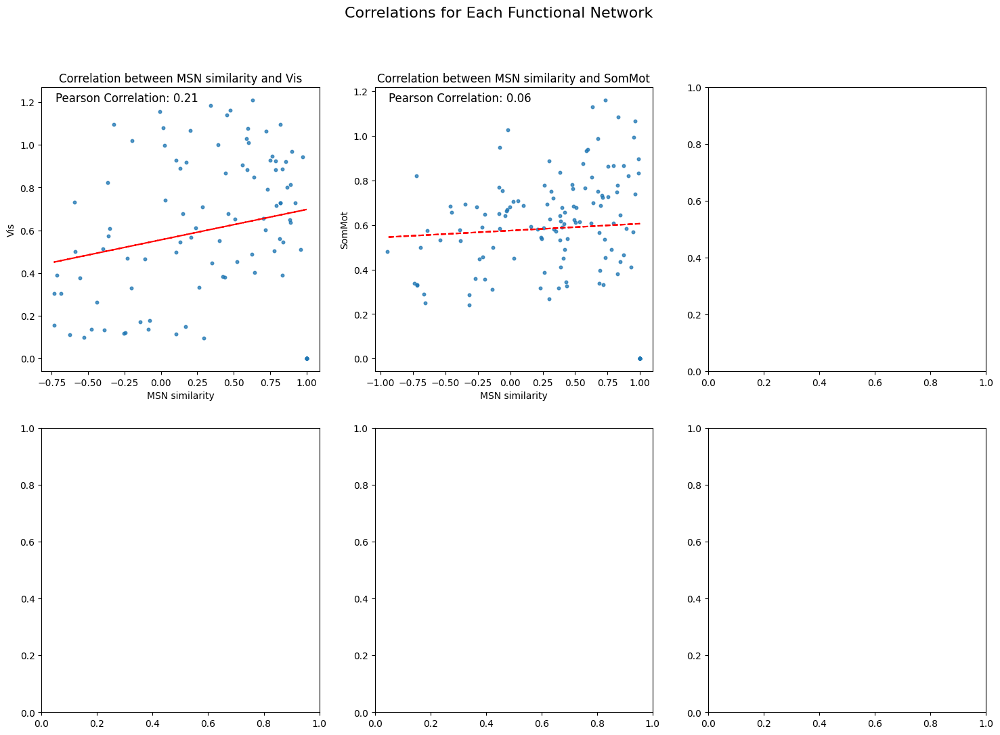

DorsAttn
[31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43]


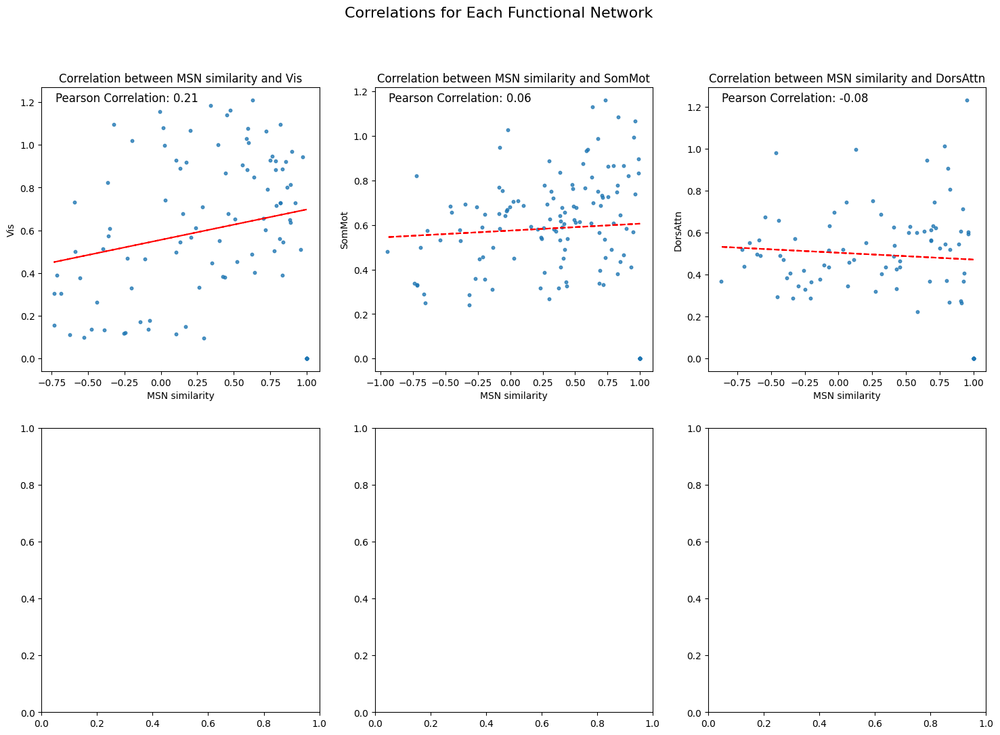

SalVentAttn
[44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]


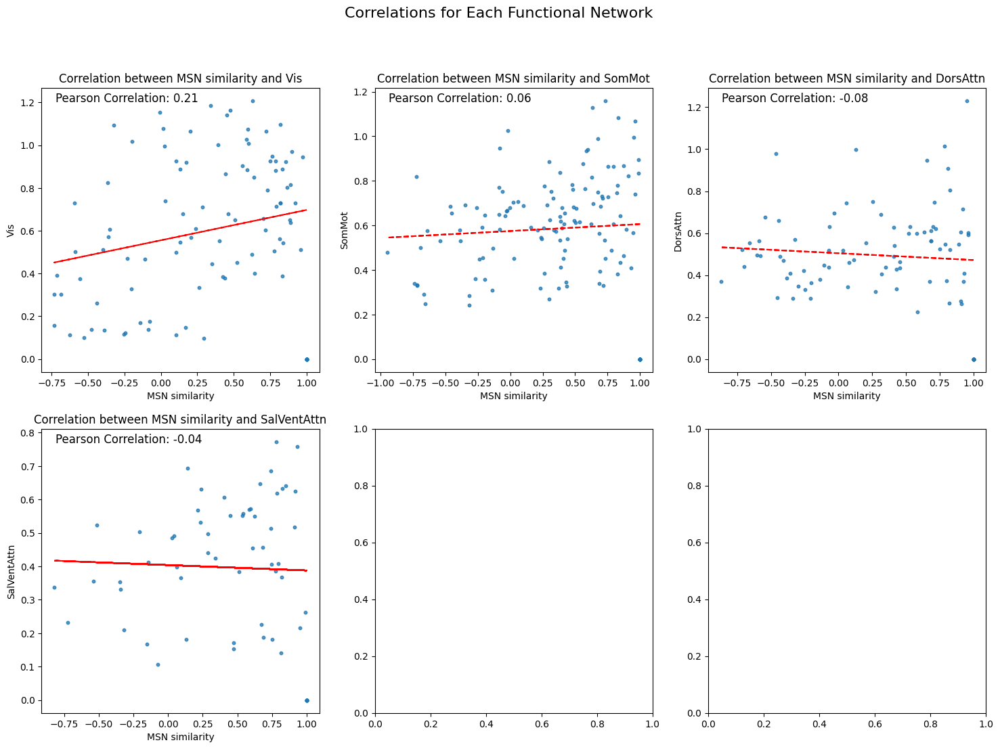

Cont
[61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73]


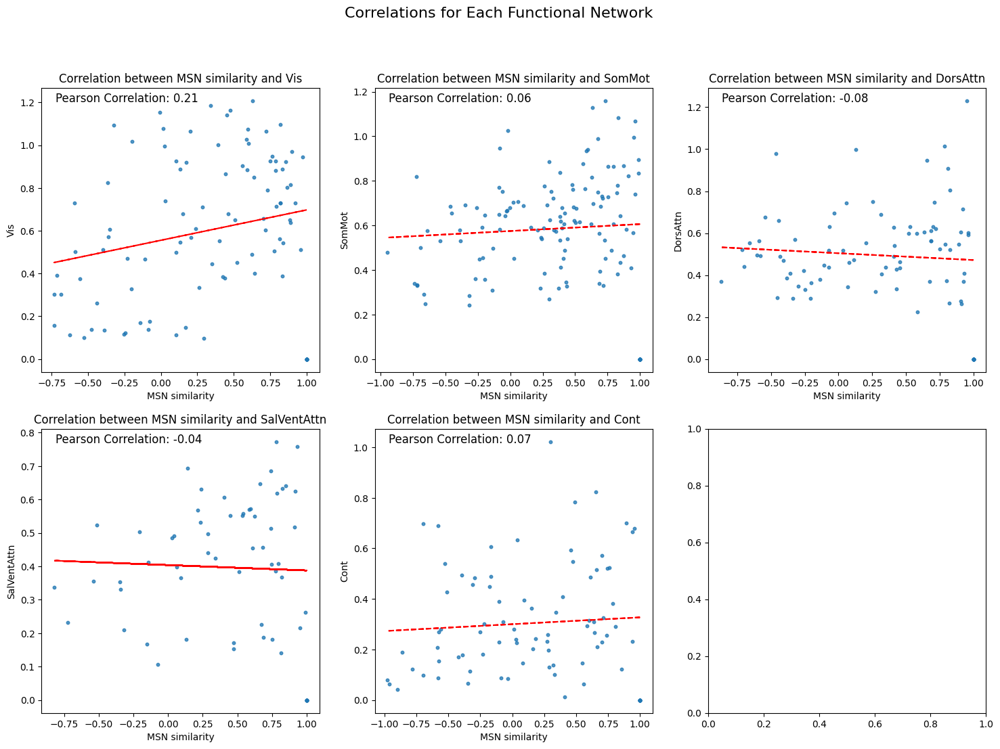

Default
[74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100]


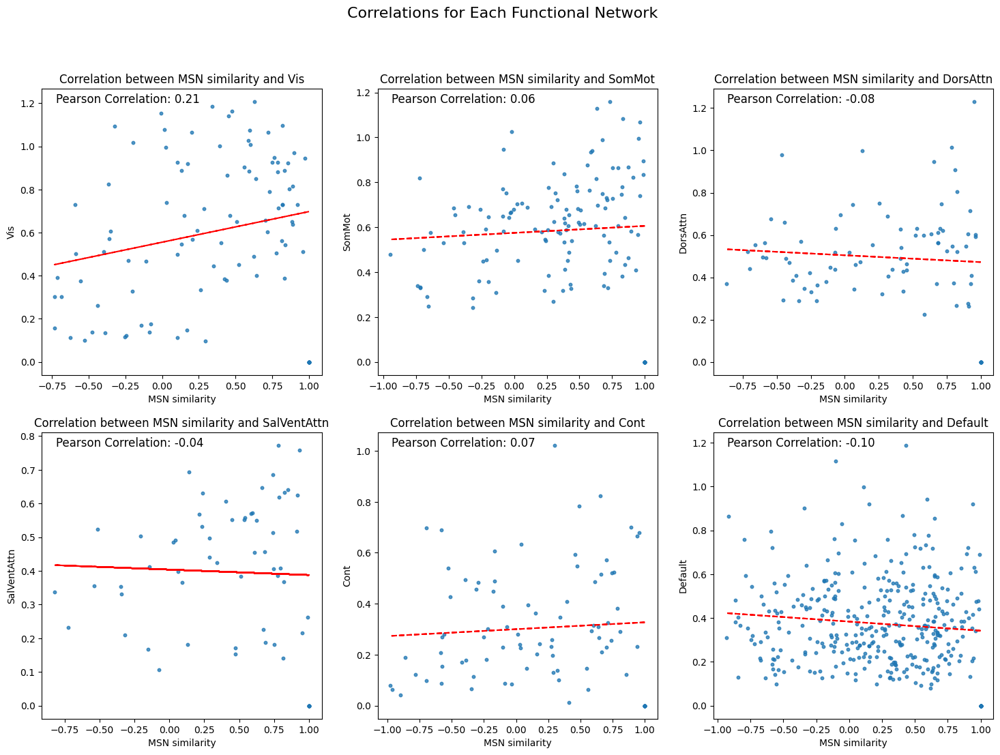

<Figure size 640x480 with 0 Axes>

Vis
[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]


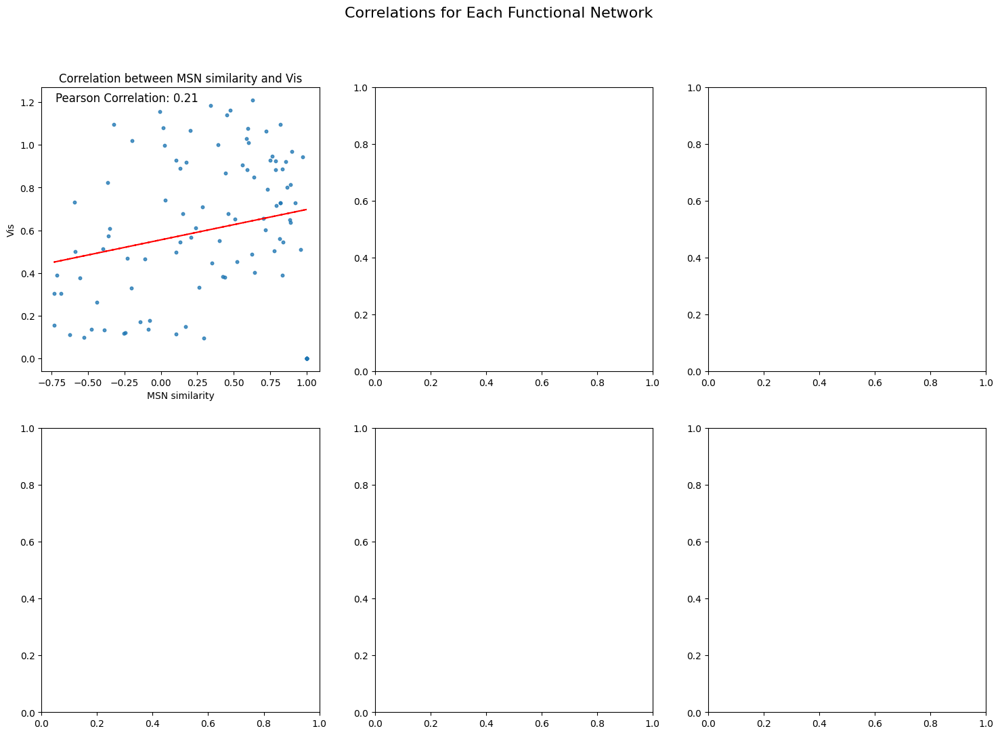

SomMot
[15, 12, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30]


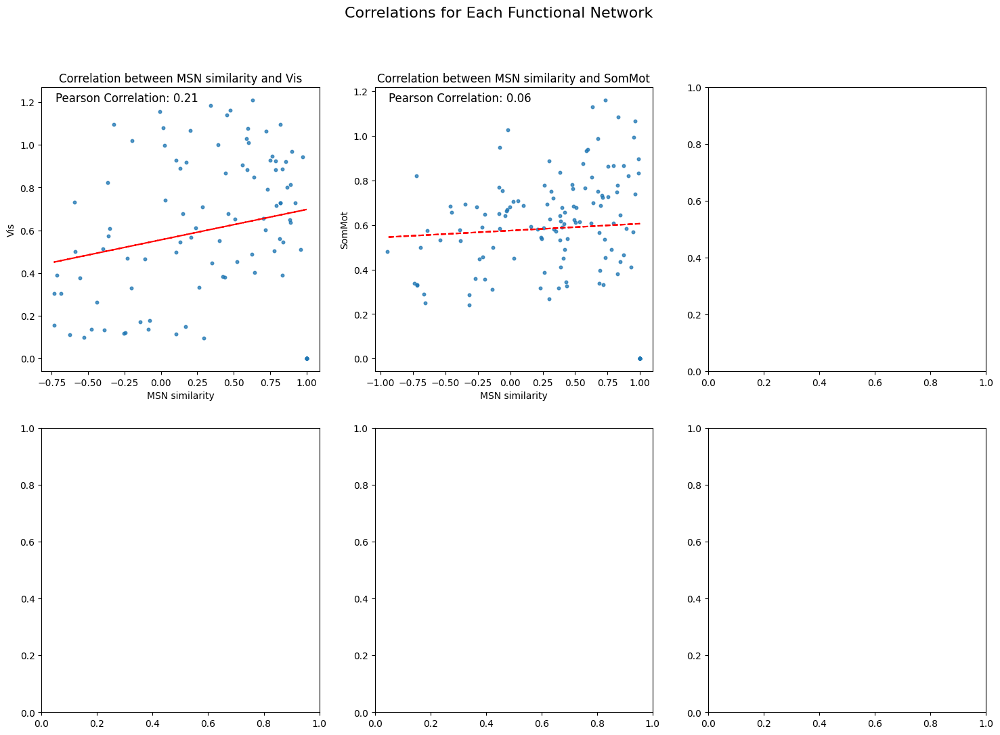

DorsAttn
[31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43]


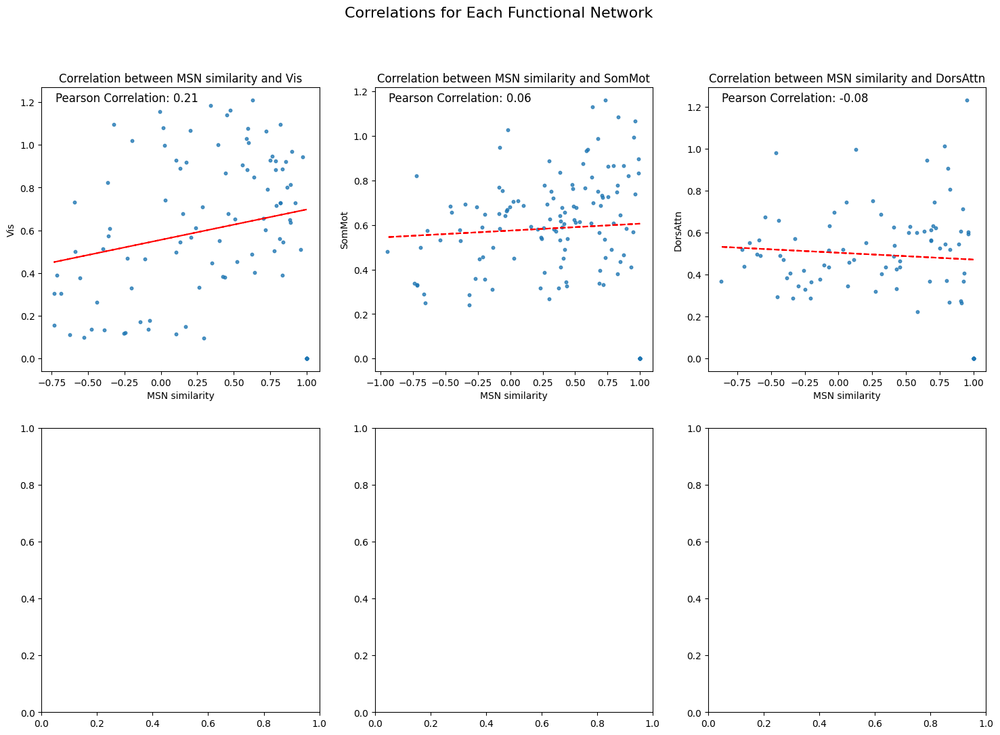

SalVentAttn
[44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]


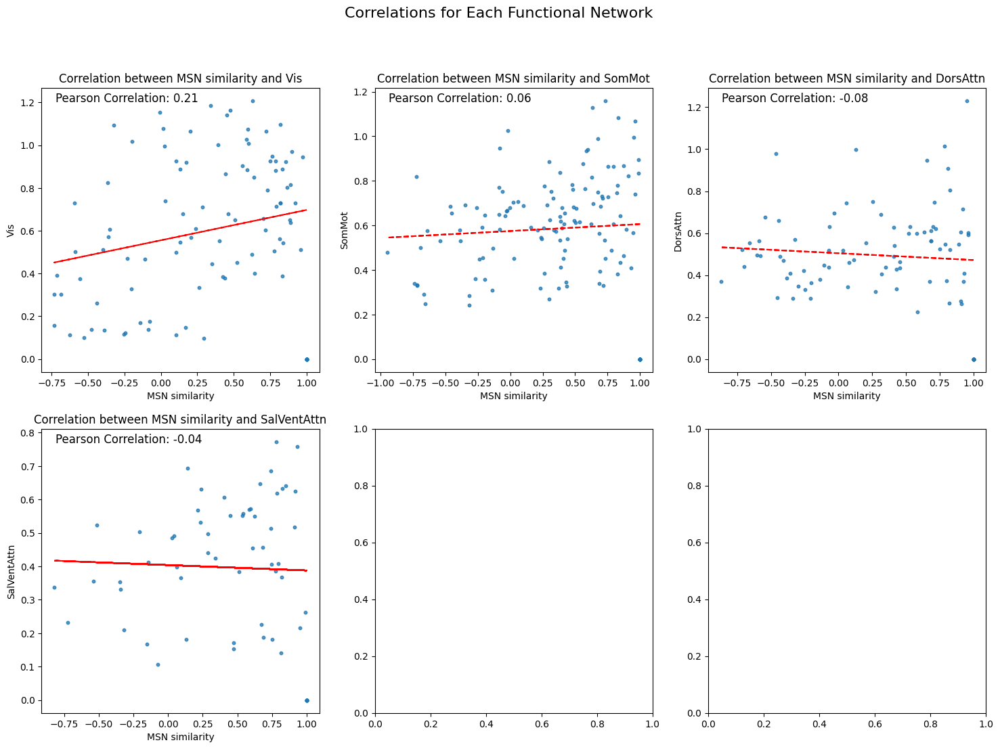

Cont
[61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73]


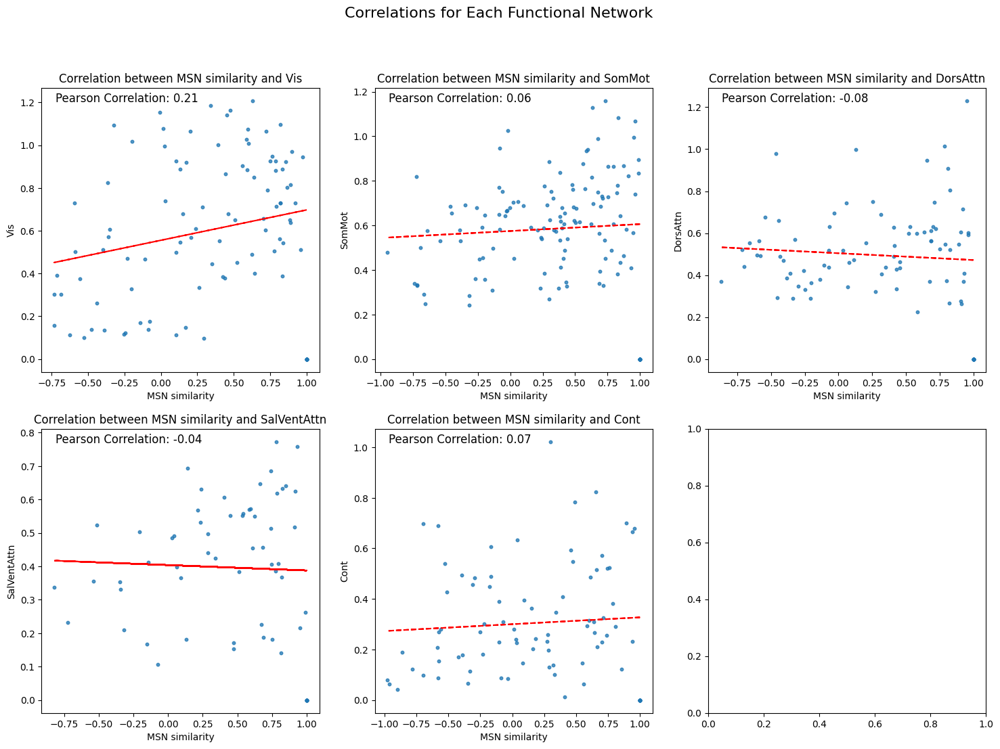

Default
[74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100]


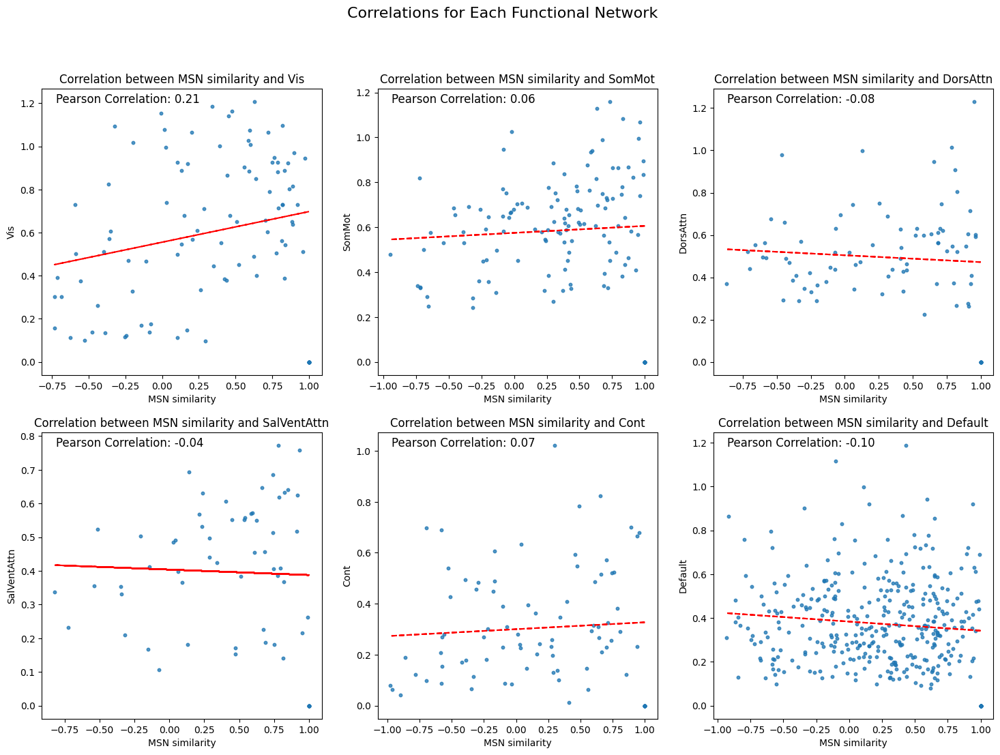

<Figure size 640x480 with 0 Axes>

In [ ]:
#MSN similarity Network level correlations
subplots_per_net(LH_FC_map, MSN_matrix, "MSN similarity", FC_arr)
subplots_per_net(RH_FC_map, MSN_matrix, "MSN similarity", FC_arr)

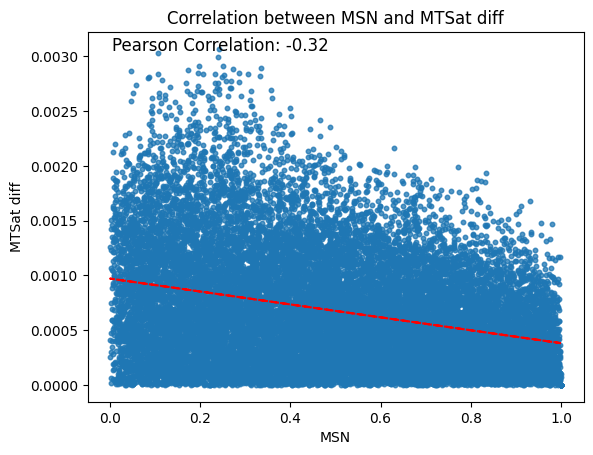

np.float64(-0.3162908231799081)

In [ ]:
#Correlate MSN and MTsat values
MSN_values = MSN_matrix.flatten()
MTSat_values = diff_matrix.flatten()
upper_triangular_corr(MSN_values, MTSat_values, 'MSN', 'MTSat diff')


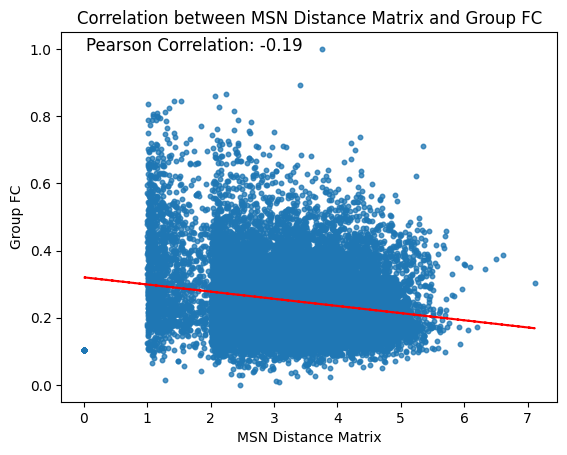

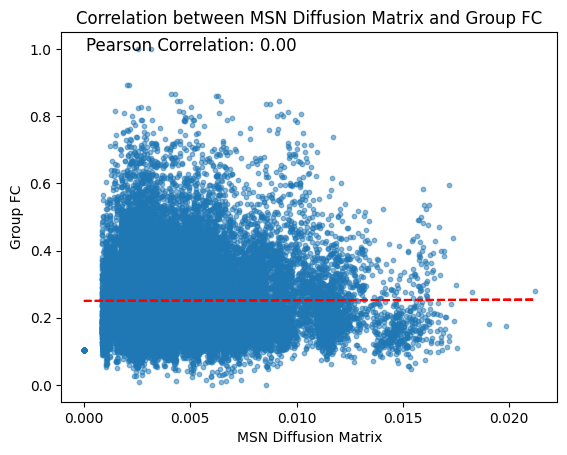

np.float64(0.0043664863780409485)

In [ ]:
#BASIC COMMUNICATION MODELS ON MSNs
'''
To do: This is not replicating the trends we are trying to replicate -> I don't think log transform is working
the same way as in matlab
'''

#Build MSN weighted matrix
SC = SC_data.to_numpy()
MSN_weighted = MSN_matrix * SC #higher MSN value => more similar

#Shortest paths ----------------------------------------------------------------
distance_matrix = bct.distance_wei_floyd(MSN_weighted, 'inv')
distance_matrix = distance_matrix[0]
upper_triangular_corr(distance_matrix.flatten(), FC_arr.flatten(), 'MSN Distance Matrix', 'Group FC')

#Dffusion ----------------------------------------------------------------------
distance_matrix = bct.diffusion_efficiency(MSN_weighted)
distance_matrix = distance_matrix[1] #diffusion efficiency matrix is the second return
upper_triangular_corr(distance_matrix.flatten(), FC_arr.flatten(), 'MSN Diffusion Matrix', 'Group FC')


**Deriving Matching Index**

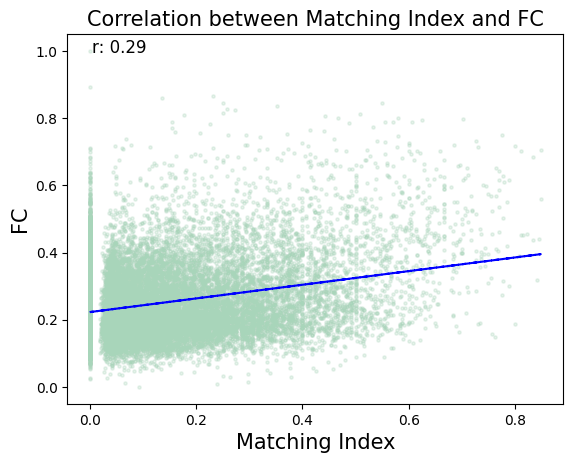

100
100


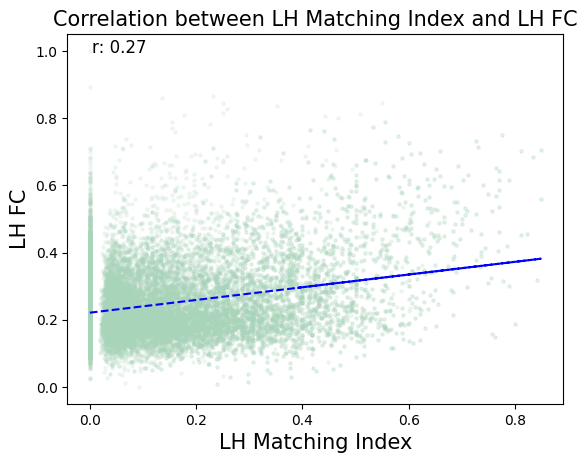

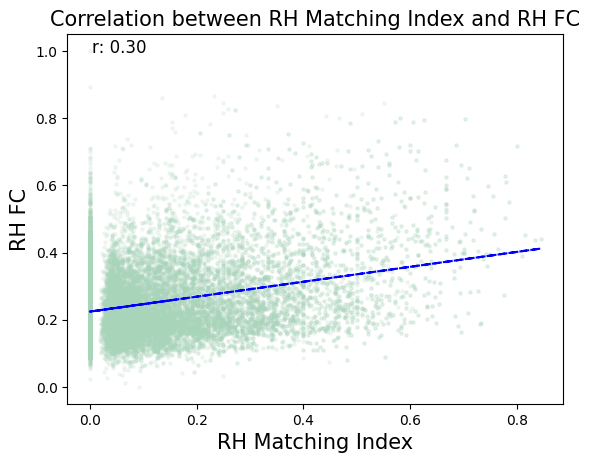

np.float64(0.30317464787108495)

In [13]:
#MATCHING INDEX

#Build a connectivity matrix out of the binarized SC data
connectivity_matrix = SC_data.to_numpy()

#Compute MI on SC using BCT
matching_index = bct.matching_ind(connectivity_matrix)
matching_index = matching_index[0] #extract the first

#Look at correlation between MI and FC at whole brain level
upper_triangular_corr(matching_index.flatten(), FC_arr.flatten(), 'Matching Index', 'FC')

#Look at correlation between MI and FC at a hemispheric level
LH_MI = matching_index[0:100]
LH_FC = FC_arr[0:100]
print(len(LH_MI))
print(len(LH_FC))
upper_triangular_corr(LH_MI.flatten(), LH_FC.flatten(), 'LH Matching Index', 'LH FC')

RH_MI = matching_index[100:200]
RH_FC = FC_arr[100:200]
upper_triangular_corr(RH_MI.flatten(), RH_FC.flatten(), 'RH Matching Index', 'RH FC')


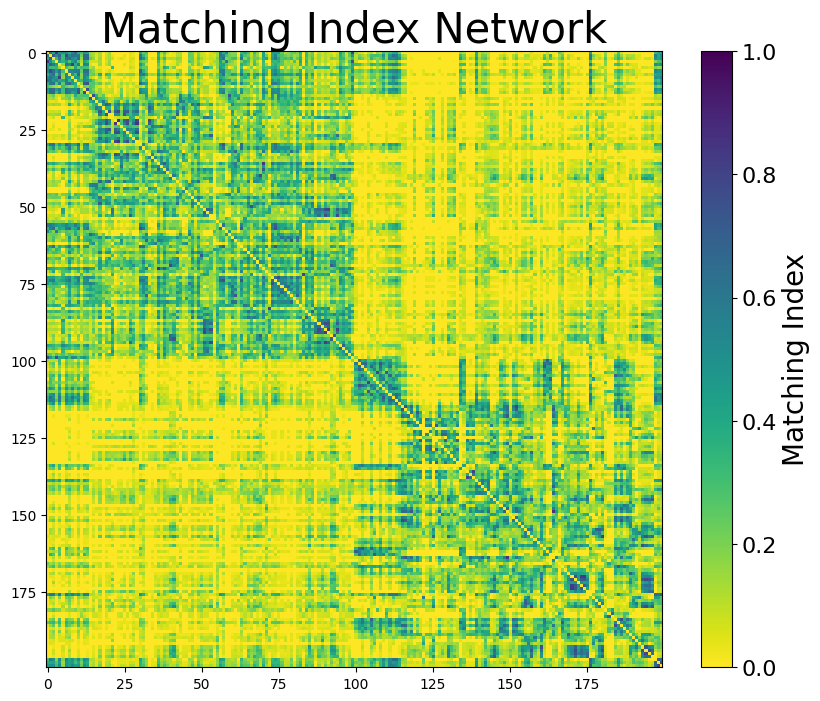

In [ ]:
#Display Matching Index graphs
plt.figure(figsize=(10, 8))
plt.imshow(matching_index, cmap='viridis_r', interpolation='nearest', vmin=0,vmax=1)
# Create colorbar and set label font size
cbar = plt.colorbar()
cbar.set_label('Matching Index', fontsize=20)
cbar.ax.tick_params(labelsize=16)  # optional: make tick labels bigger too
plt.title('Matching Index Network', fontsize=30)
#Add ymax = 1
plt.show()

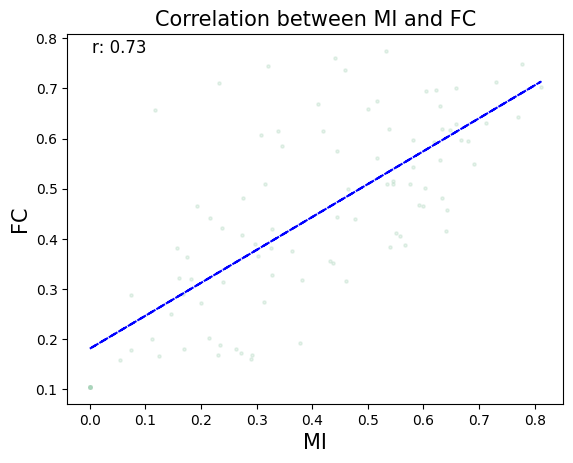

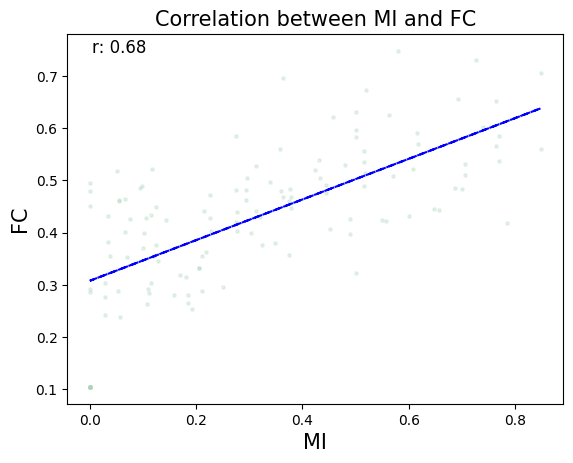

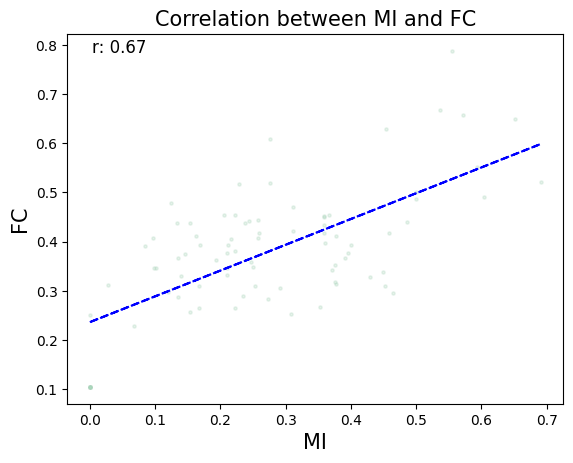

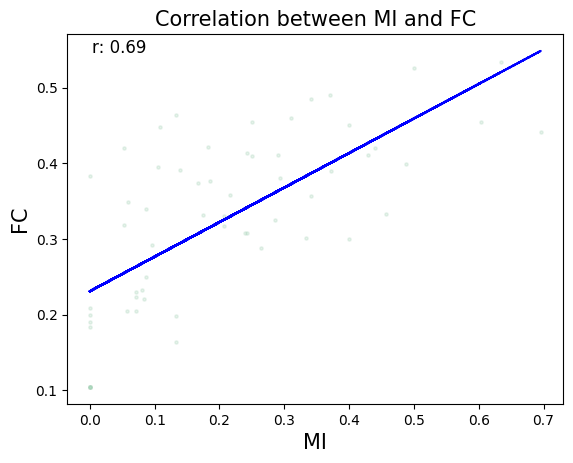

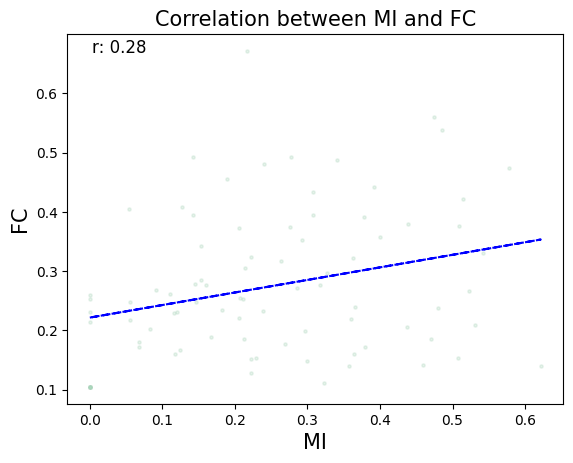

...

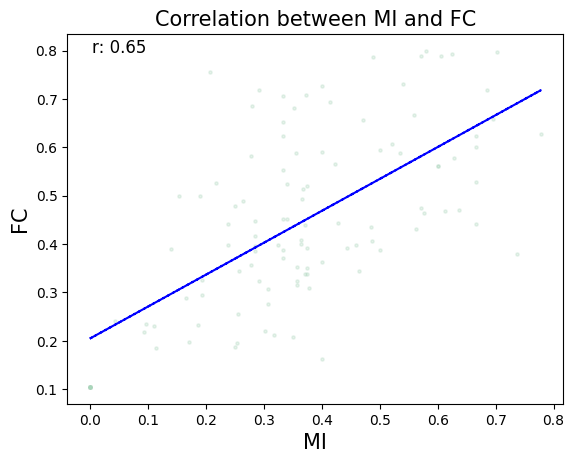

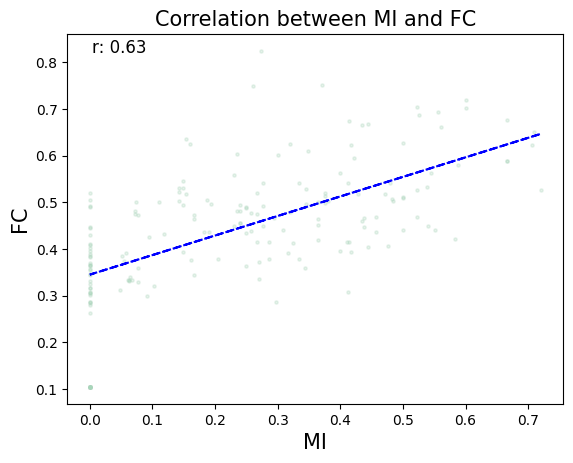

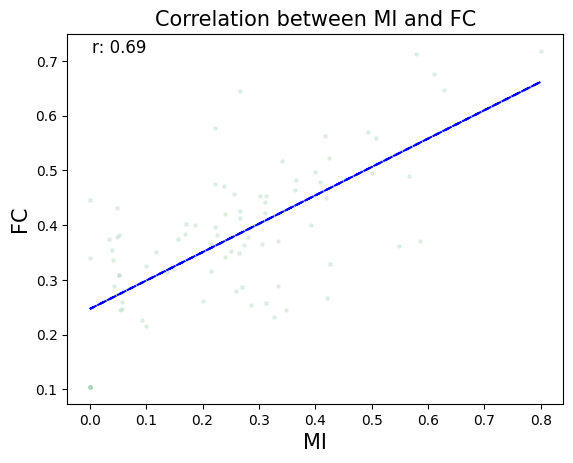

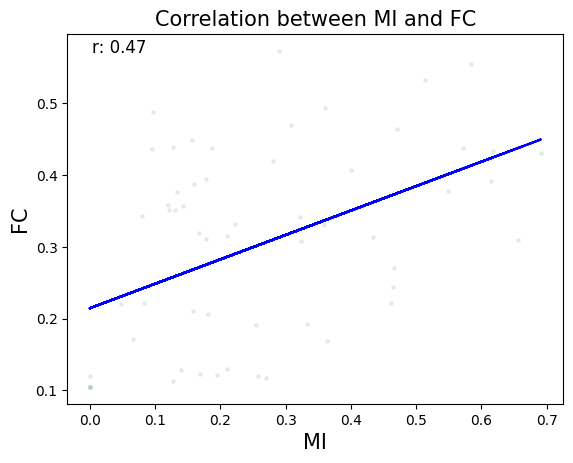

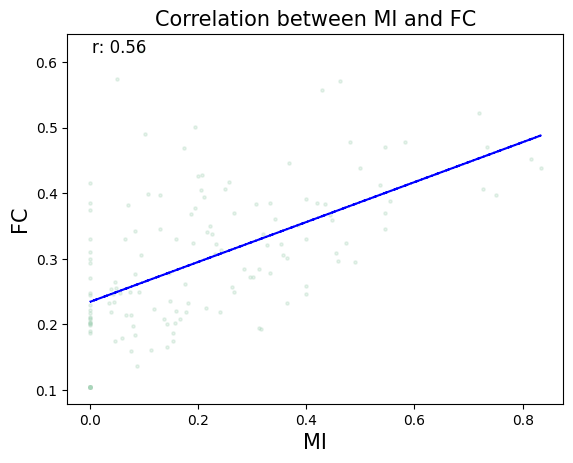

IndexError: index 200 is out of bounds for axis 0 with size 200

In [ ]:
#MI network level correlations
correlations_per_network(LH_FC_map, matching_index, "MI", FC_arr, "FC")
correlations_per_network(RH_FC_map, matching_index, "MI", FC_arr, "FC")

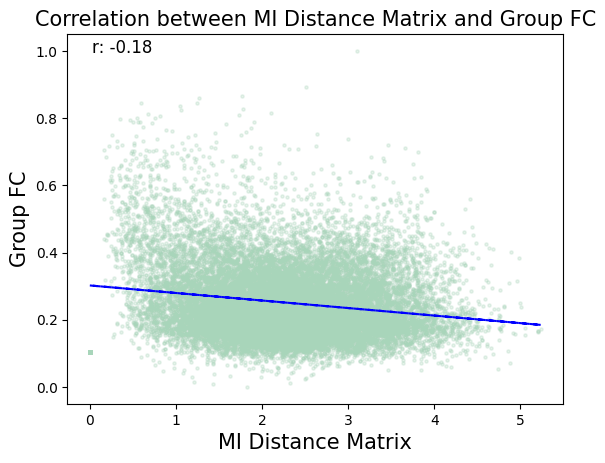

<ipython-input-51-30702eaeb6ec>:15: RuntimeWarning: divide by zero encountered in log
  weighted_SC = np.log(weighted_SC)


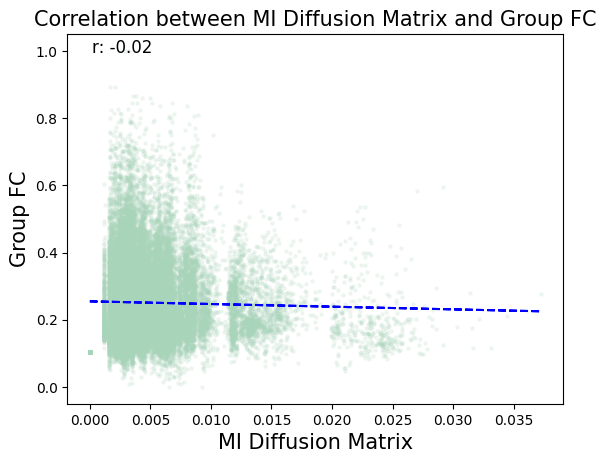

np.float64(-0.024005802961440396)

In [ ]:
#BASIC COMMUNICATION MODELS ON MI DATA

#Build SC matrix weighted by MI
weighted_SC = SC_data.to_numpy()
weighted_SC = weighted_SC * matching_index

#Shortest paths ----------------------------------------------------------------
distance_matrix = bct.distance_wei_floyd(weighted_SC, 'log')
distance_matrix = distance_matrix[0]
upper_triangular_corr(distance_matrix.flatten(), FC_arr.flatten(), 'MI Distance Matrix', 'Group FC')

#Diffusion ---------------------------------------------------------------------

#first log transform data so that weights are inverted
weighted_SC = np.log(weighted_SC)
weighted_SC[np.isinf(weighted_SC) | np.isnan(weighted_SC)] = 0 #catch -infs

distance_matrix = bct.diffusion_efficiency(weighted_SC)
distance_matrix = distance_matrix[1] #diffusion efficiency matrix is the second return
upper_triangular_corr(distance_matrix.flatten(), FC_arr.flatten(), 'MI Diffusion Matrix', 'Group FC')

**Combining predictors in linear models**

In [5]:
def normalize(data): #Function to normalize data st. everything is between 0 and 1 for comparisons
    min_val = np.min(data)
    max_val = np.max(data)
    return (data - min_val) / (max_val - min_val)

In [6]:
def regression_hemispheric(FC_arr, *args):
  #Left Hemisphere
  print("Left Hemisphere")
  indices = slice(0,100)
  selected_args = [arg[indices] for arg in args]
  multilinear_regression(FC_arr[indices].flatten(), *(arg.flatten() for arg in selected_args))

  #Right Hemisphere
  print("Right Hemisphere")
  indices = slice(100,200)
  selected_args = [arg[indices] for arg in args]
  multilinear_regression(FC_arr[indices].flatten(), *(arg.flatten() for arg in selected_args))


In [26]:
def regression_network_level(FC_arr, *args):
  #Concatenate functional network map
  FC_map = {}

  # Merge LH and RH maps
  for network in set(LH_FC_map.keys()).union(RH_FC_map.keys()):
      FC_map[network] = LH_FC_map.get(network, []) + RH_FC_map.get(network, [])
  print(FC_map)

  results = [] #to store adj_r2 and r

  # Run regression for each subnetwork using FC_map
  for network, indices in FC_map.items():
      indices = np.array(indices) - 1
      print(network)
      # Run regression only on selected subnetwork indices
      selected_args = [arg[indices] for arg in args]
      adj_r, r = multilinear_regression(FC_arr[indices].flatten(), *(arg.flatten() for arg in selected_args))

      results.append({
          'Network': network,
          'Adj_R2': adj_r,
          'Pearson-r': r
      })

  #Create a dataframe to store the results
  results_df = pd.DataFrame(results)
  display(results_df)
  return results_df

In [8]:
#Use commit
COMMIT = pd.read_csv('/content/drive/MyDrive/commit.csv', header=None).to_numpy()
COMMIT_arr = normalize(COMMIT)

In [16]:
#Multilinear model: Preprocessing
EuclDist_arr = EuclDist_data.to_numpy()
EuclDist_arr = normalize(EuclDist_arr)
unweighted_SC = SC_data.to_numpy()
unweighted_SC = normalize(unweighted_SC)
FC_arr = functional_data.to_numpy()
FC_arr = normalize(FC_arr)

NoS_arr = normalize(weighted_NoS.to_numpy())
print(type(NoS_arr))
MI_arr = normalize(matching_index)
MSN_arr = normalize(MSN_matrix)


<class 'numpy.ndarray'>


Coefficients: [-0.00170775  0.06278704  0.10602249]
R-squared: 0.15429652098484703
P-values: ['0.000e+00', '0.000e+00', '0.000e+00']
Adjusted R-squared: 0.15423308688051052


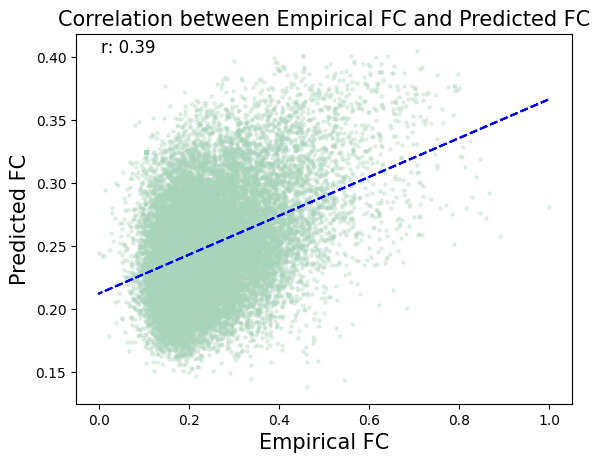

Coefficients: [0.2626705  0.06976218 0.18573494]
R-squared: 0.11879828504951018
P-values: ['5.047e-05', '0.000e+00', '0.000e+00']
Adjusted R-squared: 0.11873218831121501


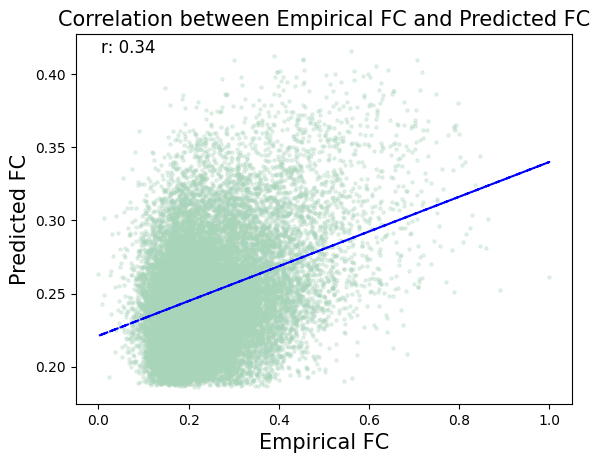

(0.11873218831121501, np.float64(0.34467127099529227))

In [19]:
#Multilinear model with SPL on COMMIT
COMMIT_arrSPL = bct.distance_wei_floyd(COMMIT_arr, 'inv')[0]
NoS_arr = bct.distance_wei_floyd(NoS_arr, 'inv')
NoS_arr = NoS_arr[0]
multilinear_regression(FC_arr.flatten(), COMMIT_arrSPL.flatten(), MSN_matrix.flatten(), matching_index.flatten())
multilinear_regression(FC_arr.flatten(), NoS_arr.flatten(), MSN_matrix.flatten(), matching_index.flatten())

Coefficients: [ 0.58661657 -0.16868153]
R-squared: 0.18314376097006346
P-values: ['0.000e+00', '0.000e+00']
Adjusted R-squared: 0.18310291509467125


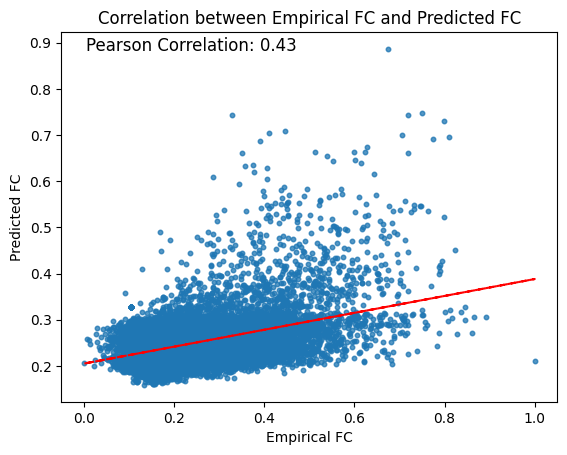

In [ ]:
#Multlinear model just NoS and EuclDist
multilinear_regression(FC_arr.flatten(), NoS_arr.flatten(), EuclDist_arr.flatten())

**Re-implementing the Goni et al. 2014 multilinear model**

Streaming output truncated to the last 5000 lines.
 [173]]
4
[[159]
 [169]
 [171]
 [174]]
4
[[159]
 [169]
 [171]
 [172]
 [175]]
5
[[159]
 [158]
 [190]
 [192]
 [178]
 [177]
 [197]
 [176]]
8
[[159]
 [158]
 [190]
 [192]
 [178]
 [177]]
6
[[159]
 [158]
 [190]
 [192]
 [178]]
5
[[159]
 [169]
 [160]
 [193]
 [179]]
5
[[159]
 [169]
 [160]
 [193]
 [180]]
5
[[159]
 [169]
 [151]
 [184]
 [185]
 [167]
 [135]
 [181]]
8
[[159]
 [169]
 [189]
 [164]
 [148]
 [147]
 [182]]
7
[[159]
 [169]
 [171]
 [172]
 [146]
 [165]
 [166]
 [183]]
8
[[159]
 [169]
 [151]
 [184]]
4
[[159]
 [169]
 [151]
 [184]
 [185]]
5
[[159]
 [169]
 [151]
 [184]
 [186]]
5
[[159]
 [169]
 [151]
 [184]
 [185]
 [187]]
6
[[159]
 [169]
 [189]
 [164]
 [148]
 [188]]
6
[[159]
 [169]
 [189]]
3
[[159]
 [158]
 [190]]
3
[[159]
 [158]
 [190]
 [191]]
4
[[159]
 [158]
 [190]
 [192]]
4
[[159]
 [169]
 [160]
 [193]]
4
[[159]
 [169]
 [171]
 [173]
 [194]]
5
[[159]
 [169]
 [171]
 [173]
 [195]]
5
[[159]
 [169]
 [171]
 [173]
 [195]
 [196]]
6
[[159]
 [158]
 [190]
 [

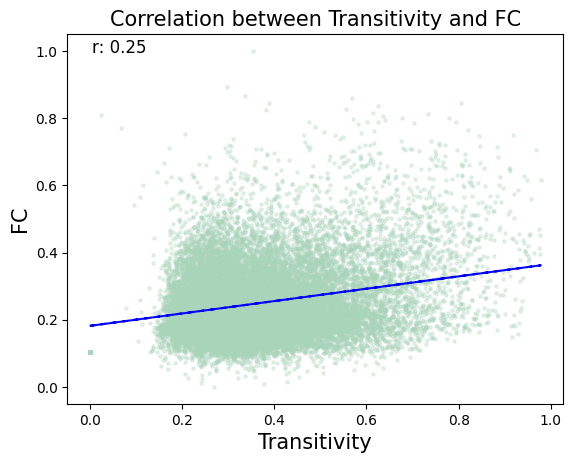

np.float64(0.24804829611127652)

In [20]:
#Goni et al. 2014 multilinear model

#Path transitivity -> Based on MI but weaker prediction
transitivity = bct.path_transitivity(COMMIT_arr, 'inv') #include a weight to distance transform
print(transitivity.shape)
upper_triangular_corr(transitivity.flatten(), FC_arr.flatten(), 'Transitivity', 'FC')

(200, 200)
[[0.         3.9068906  3.9068906  ... 8.86108691 8.86108691 8.86108691]
 [4.95419631 0.         4.95419631 ... 4.95419631 4.95419631 4.95419631]
 [5.45943162 5.45943162 0.         ... 5.45943162 5.45943162 5.45943162]
 ...
 [9.90839262 4.95419631 4.95419631 ... 0.         4.95419631 4.95419631]
 [9.99859043 5.04439412 5.04439412 ... 5.04439412 0.         5.04439412]
 [9.76155123 4.80735492 4.80735492 ... 4.80735492 4.80735492 0.        ]]


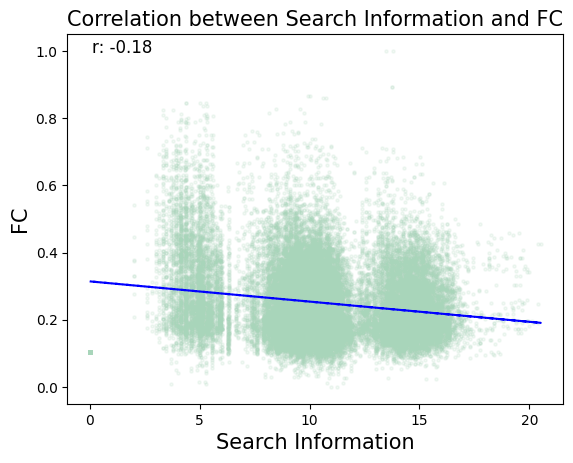

np.float64(-0.17748884556942351)

In [21]:
#Search information
unweighted_SC = SC_data.to_numpy()
search_info = bct.search_information(unweighted_SC, 'inv')
np.fill_diagonal(search_info, 0)
print(search_info.shape)
print(search_info)
upper_triangular_corr(search_info.flatten(), FC_arr.flatten(), 'Search Information', 'FC')

(200, 200)


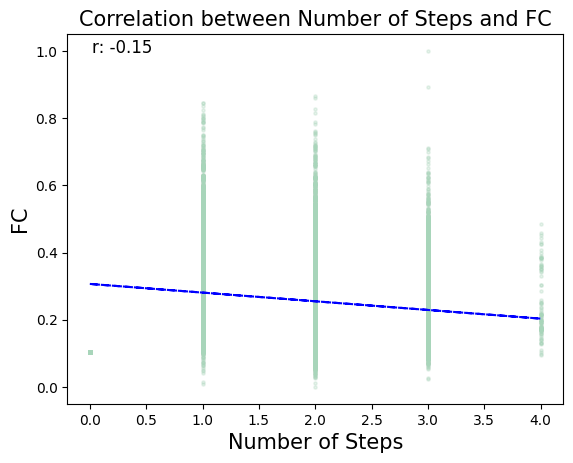

np.float64(-0.15215401401536024)

In [22]:
#Number of steps
num_steps = bct.distance_wei(unweighted_SC)
print(num_steps[0].shape)
num_steps = num_steps[0]
upper_triangular_corr(num_steps.flatten(), FC_arr.flatten(), 'Number of Steps', 'FC')

[[ 0.          2.76683521  8.93028834 ... 35.44954859 30.298779
  26.47303365]
 [ 2.76683521  0.          6.16345313 ... 34.38718264 29.23641305
  25.4106677 ]
 [ 8.93028834  6.16345313  0.         ... 36.66094871 31.51017912
  27.68443377]
 ...
 [35.44954859 34.38718264 36.66094871 ...  0.          5.15076959
   8.97651494]
 [30.298779   29.23641305 31.51017912 ...  5.15076959  0.
   3.82574535]
 [26.47303365 25.4106677  27.68443377 ...  8.97651494  3.82574535
   0.        ]]


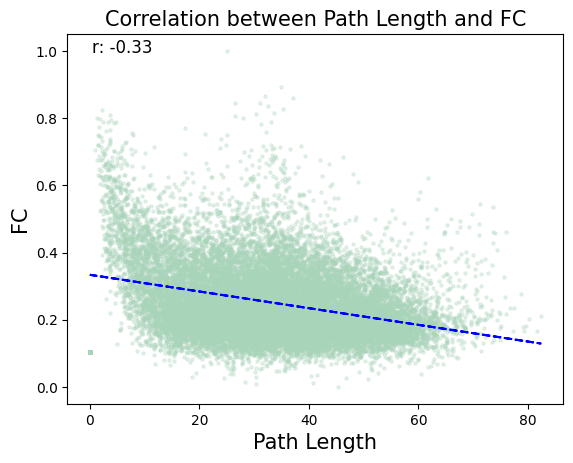

np.float64(-0.3296745031439163)

In [23]:
#Weighted path length -> Use COMMIT Here
path_length = bct.distance_wei_floyd(COMMIT_arr, 'inv')
path_length = path_length[0]
print(path_length)
upper_triangular_corr(path_length.flatten(), FC_arr.flatten(), 'Path Length', 'FC')

Coefficients: [-0.17182335 -0.07650155  0.07732612  0.02282444]
R-squared: 0.11680974637662223
P-values: ['0.000e+00', '2.952e-12', '0.000e+00', '0.000e+00']
Adjusted R-squared: 0.11672141631000155


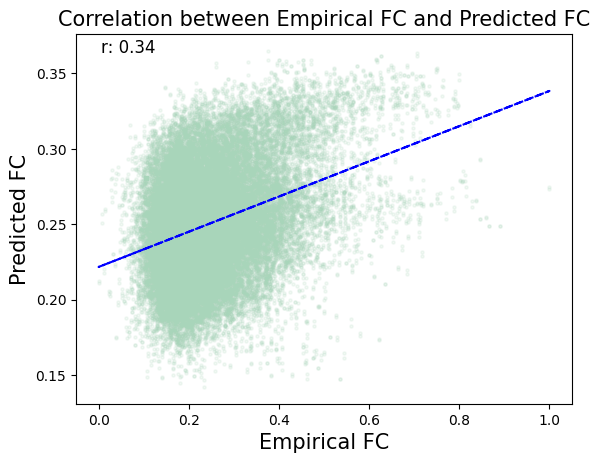

(0.11672141631000155, np.float64(0.34177440860401204))

In [24]:
#Goni 2014 analytic model
path_length = normalize(path_length)
search_info = normalize(search_info)
transitivity = normalize(transitivity)
FC_arr = normalize(FC_arr)
multilinear_regression(FC_arr.flatten(), path_length.flatten(), search_info.flatten(), transitivity.flatten(), num_steps.flatten())

Left Hemisphere
Coefficients: [-0.155476   -0.0373661   0.0772521   0.01439656]
R-squared: 0.10442747819094489
P-values: ['0.000e+00', '1.670e-02', '0.000e+00', '8.240e-05']
Adjusted R-squared: 0.10424831889675945


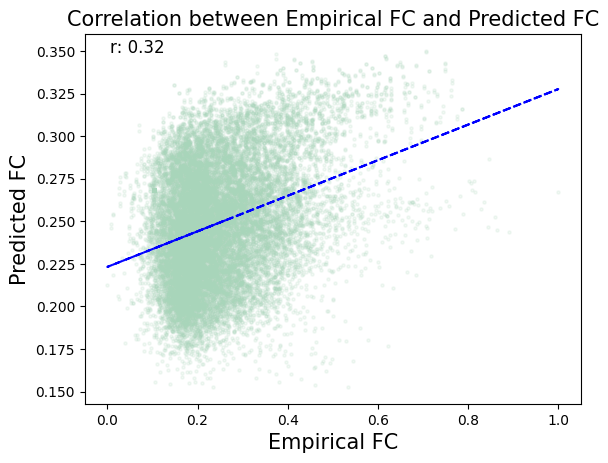

Right Hemisphere
Coefficients: [-0.19043012 -0.09379745  0.08854273  0.02682341]
R-squared: 0.13409778411932993
P-values: ['0.000e+00', '1.709e-09', '0.000e+00', '1.138e-12']
Adjusted R-squared: 0.13392456037021638


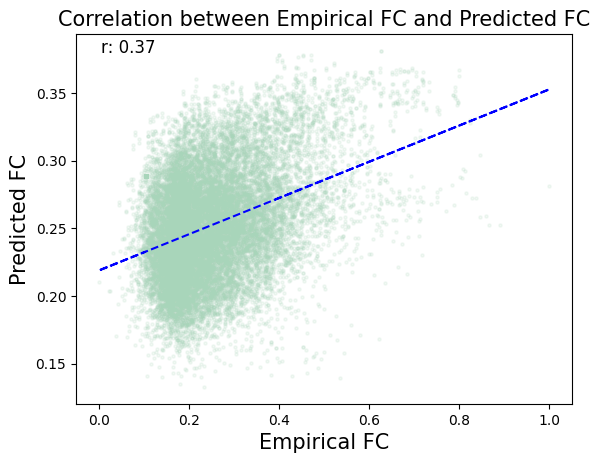

{'Default': [74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200], 'DorsAttn': [31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147], 'SomMot': [15, 12, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134], 'Cont': [61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181], 'SalVentAttn': [44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158], 'Vis': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115]}
Default
Coefficients: [-0.02825091  0.04385607  0.21571414 -0.02488329]
R-squared: 0.1

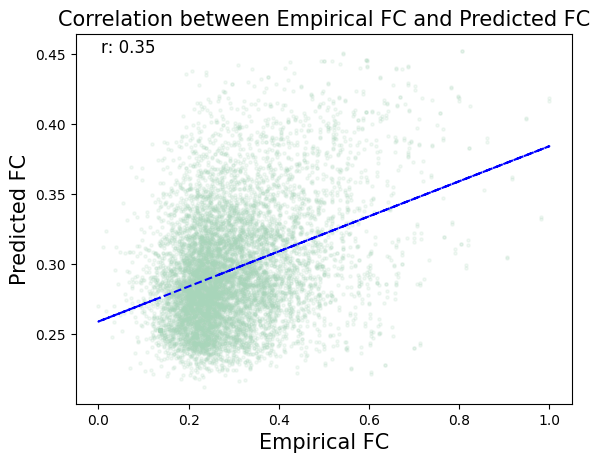

DorsAttn
Coefficients: [-0.26174273 -0.23601941  0.07809552  0.05602307]
R-squared: 0.14067488859376798
P-values: ['0.000e+00', '1.114e-07', '1.832e-06', '1.007e-07']
Adjusted R-squared: 0.1400132330700674


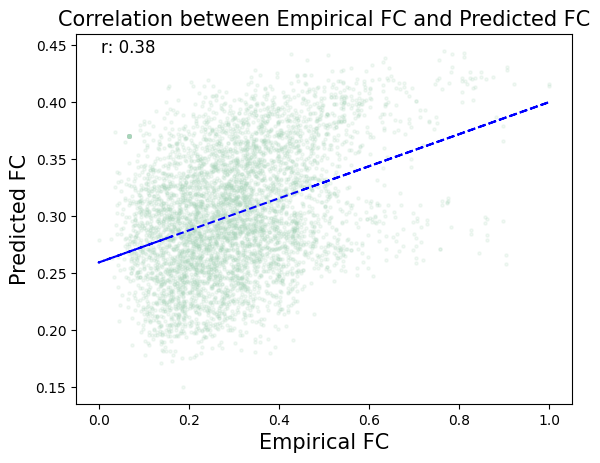

SomMot
Coefficients: [-0.28783842 -0.15407968  0.01994656  0.05458281]
R-squared: 0.11784068087097244
P-values: ['0.000e+00', '4.788e-06', '1.462e-01', '5.121e-12']
Adjusted R-squared: 0.11733622950906886


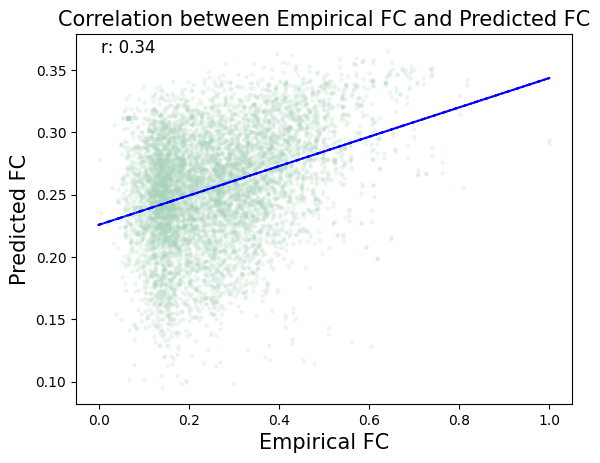

Cont
Coefficients: [-0.13334713 -0.05590543  0.14062033 -0.00395115]
R-squared: 0.14854383373599633
P-values: ['0.000e+00', '5.242e-02', '0.000e+00', '5.742e-01']
Adjusted R-squared: 0.1479757228660954


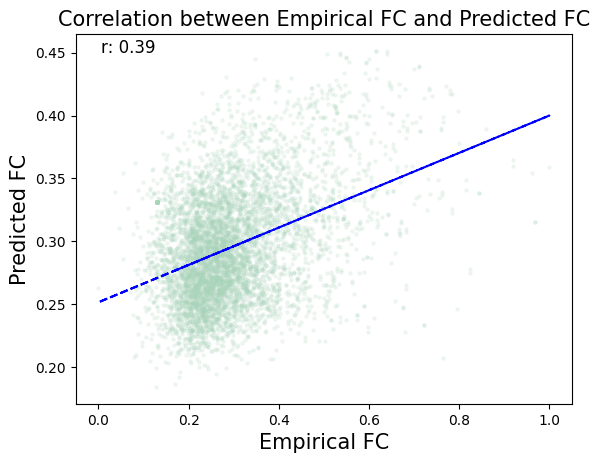

SalVentAttn
Coefficients: [-0.23184169  0.00756633 -0.01705824  0.00527186]
R-squared: 0.06629989867068709
P-values: ['0.000e+00', '8.871e-01', '3.986e-01', '6.826e-01']
Adjusted R-squared: 0.06545011473318607


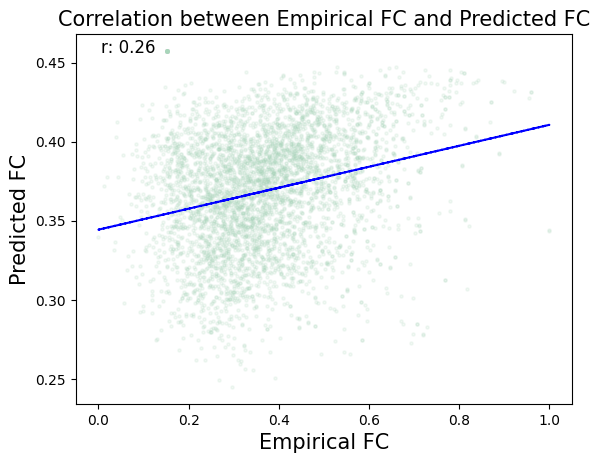

Vis
Coefficients: [-0.27994289 -0.04964561  0.23411553  0.02778292]
R-squared: 0.2050346832348241
P-values: ['0.000e+00', '2.502e-01', '0.000e+00', '7.876e-03']
Adjusted R-squared: 0.2044859582534504


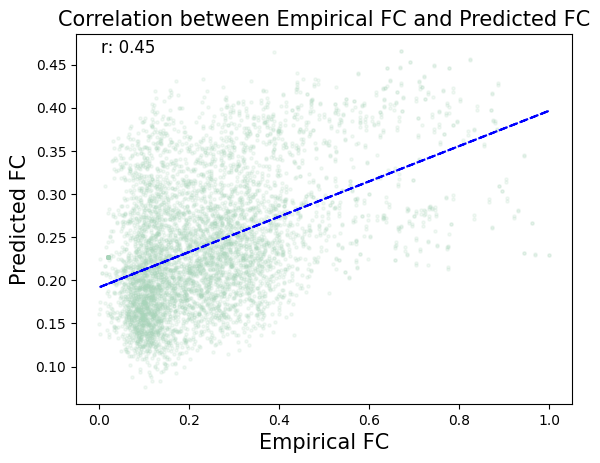

,Network,Adj_R2,Pearson-r
0,Default,0.124737,0.353719
1,DorsAttn,0.140013,0.375067
2,SomMot,0.117336,0.343279
3,Cont,0.147976,0.385414
4,SalVentAttn,0.065450,0.257488
5,Vis,0.204486,0.452808


In [29]:
#Goni 2014 analytic model @ Hemispheric level
regression_hemispheric(FC_arr, path_length, search_info, transitivity, num_steps)
goni_model = regression_network_level(FC_arr, path_length, search_info, transitivity, num_steps)

Coefficients: [ 0.06277705  0.13830707 -0.04927943  0.03299264 -0.14651173]
R-squared: 0.16349743210551204
P-values: ['0.000e+00', '0.000e+00', '3.946e-06', '0.000e+00', '0.000e+00']
Adjusted R-squared: 0.16339285359774902


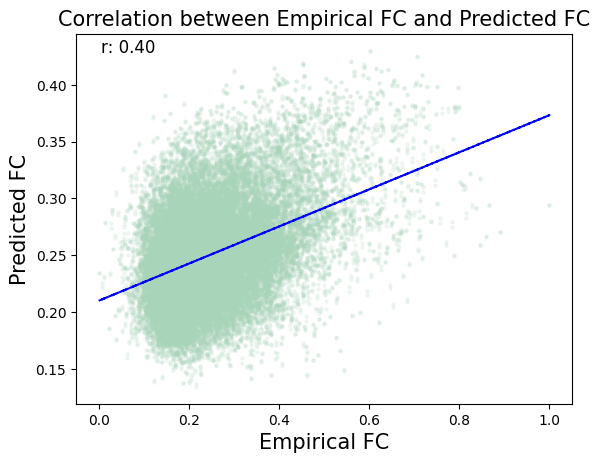

(0.16339285359774902, np.float64(0.4043481570447824))

In [30]:
#Goni 2014 analytic model + matching index + morphometric similarity, took out path transitivity
#Adding in MSN matrix, MI,
multilinear_regression(FC_arr.flatten(), MSN_arr.flatten(), MI_arr.flatten(), search_info.flatten(), num_steps.flatten(), path_length.flatten())

Coefficients: [-0.11345291  0.0518989   0.13071879 -0.00238371  0.02295454 -0.07155851]
R-squared: 0.18040722599151326
P-values: ['0.000e+00', '0.000e+00', '0.000e+00', '8.236e-01', '0.000e+00', '0.000e+00']
Adjusted R-squared: 0.180284265557336


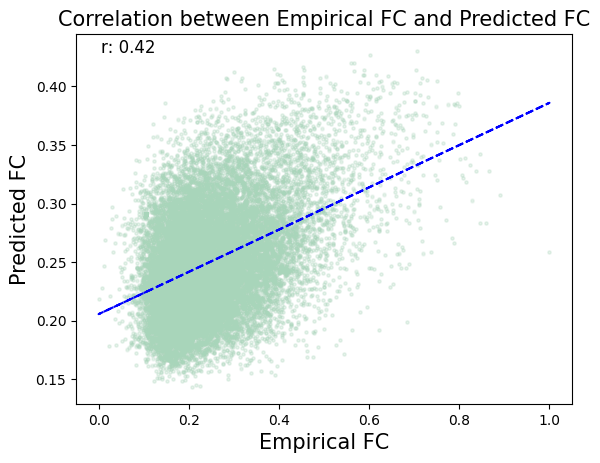

(0.180284265557336, np.float64(0.4247437180130077))

In [31]:
#Best combined model -> Includes Euclidean distance
multilinear_regression(FC_arr.flatten(), EuclDist_arr.flatten(), MSN_arr.flatten(), MI_arr.flatten(), search_info.flatten(), num_steps.flatten(), path_length.flatten())

Coefficients: [-0.11358727  0.05190005  0.13075655  0.02243122 -0.00086986]
R-squared: 0.18040620806948604
P-values: ['0.000e+00', '0.000e+00', '0.000e+00', '0.000e+00', '0.000e+00']
Adjusted R-squared: 0.18030374347580558


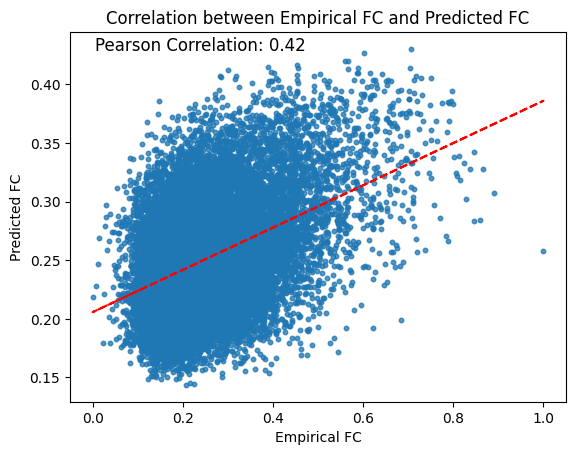

(0.18030374347580558, np.float64(0.42474251973340993))

In [ ]:
#Best combined model - search information (no longer significant)
multilinear_regression(FC_arr.flatten(), EuclDist_arr.flatten(), MSN_arr.flatten(), MI_arr.flatten(), num_steps.flatten(), path_length.flatten())

Left Hemisphere
Coefficients: [-0.11098455  0.04840793  0.12373558  0.02211617 -0.06517493]
R-squared: 0.1641996816840614
P-values: ['0.000e+00', '0.000e+00', '0.000e+00', '0.000e+00', '0.000e+00']
Adjusted R-squared: 0.1639906689006474


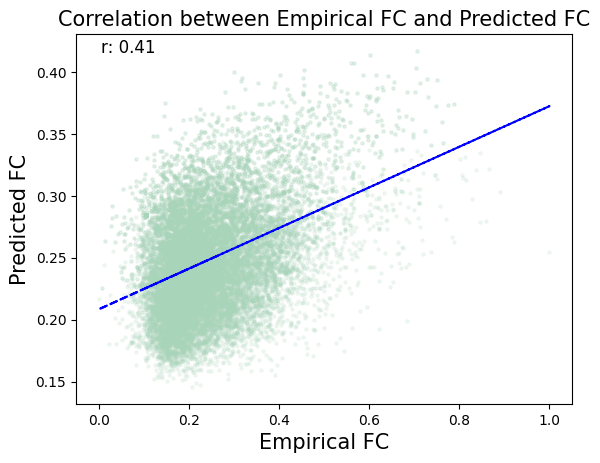

Right Hemisphere
Coefficients: [-0.11171665  0.05515908  0.14053269  0.02263777 -0.08261987]
R-squared: 0.19851487761883502
P-values: ['0.000e+00', '0.000e+00', '0.000e+00', '0.000e+00', '0.000e+00']
Adjusted R-squared: 0.19831444620881677


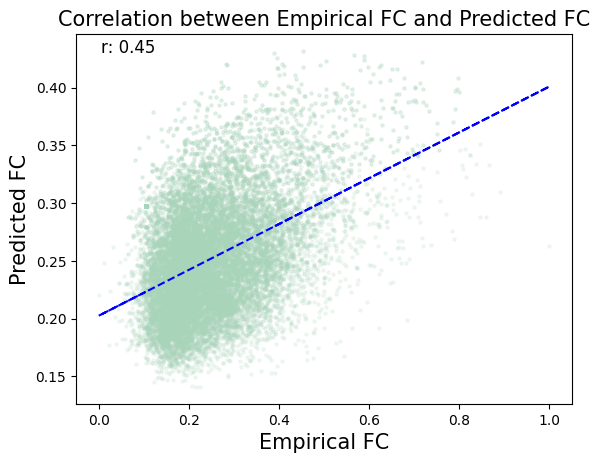

{'Default': [74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200], 'DorsAttn': [31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147], 'SomMot': [15, 12, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134], 'Cont': [61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181], 'SalVentAttn': [44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158], 'Vis': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115]}
Default
Coefficients: [-0.09364916  0.04317016  0.19440427  0.00176797  0.02328304]
R-

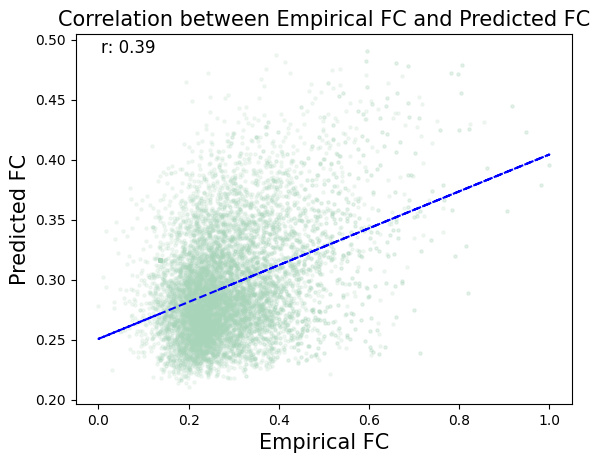

DorsAttn
Coefficients: [-0.2249756   0.06726695  0.14325561  0.02162792 -0.05002739]
R-squared: 0.21561593496340703
P-values: ['0.000e+00', '0.000e+00', '0.000e+00', '3.537e-08', '6.779e-03']
Adjusted R-squared: 0.21486084826237073


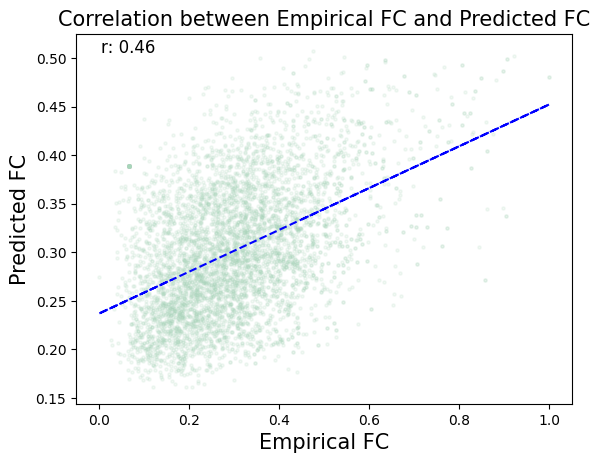

SomMot
Coefficients: [-0.08580789  0.10510601  0.18516888  0.04528383 -0.15030825]
R-squared: 0.2165141930839306
P-values: ['7.441e-13', '0.000e+00', '0.000e+00', '0.000e+00', '0.000e+00']
Adjusted R-squared: 0.21595408026800544


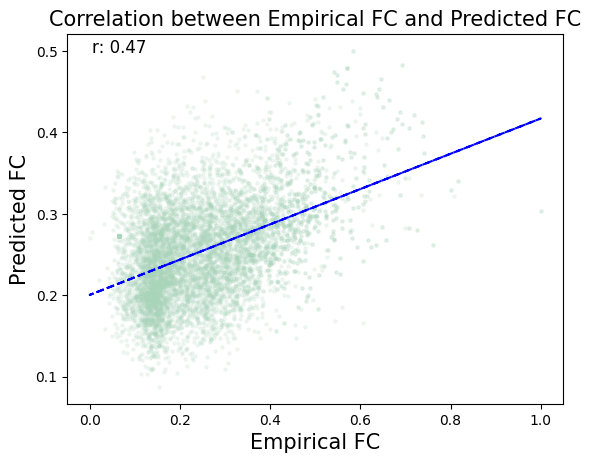

Cont
Coefficients: [-2.80814460e-03  3.31441893e-02  1.79788979e-01 -5.84413832e-05
 -1.23685283e-01]
R-squared: 0.17392068093886748
P-values: ['7.905e-01', '2.282e-12', '0.000e+00', '9.841e-01', '0.000e+00']
Adjusted R-squared: 0.1732315924177955


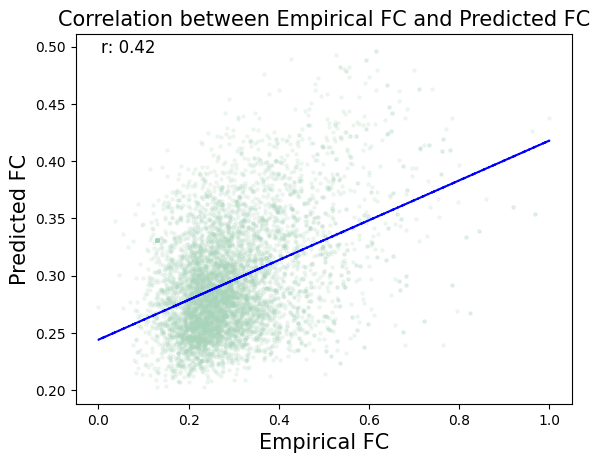

SalVentAttn
Coefficients: [-0.19228726  0.00798457  0.11433671  0.02939779 -0.05221223]
R-squared: 0.10175971757217839
P-values: ['0.000e+00', '2.786e-01', '5.959e-11', '5.872e-10', '7.183e-03']
Adjusted R-squared: 0.10073759617660749


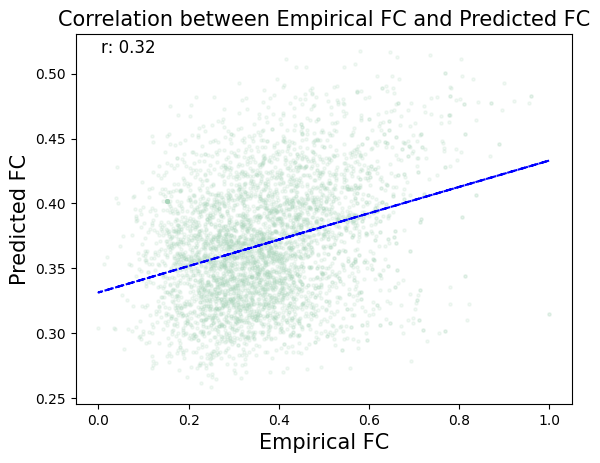

Vis
Coefficients: [-0.37800689  0.10276197  0.19597713  0.03393896  0.00400418]
R-squared: 0.34968126021483525
P-values: ['0.000e+00', '0.000e+00', '0.000e+00', '0.000e+00', '7.841e-01']
Adjusted R-squared: 0.34912006005968754


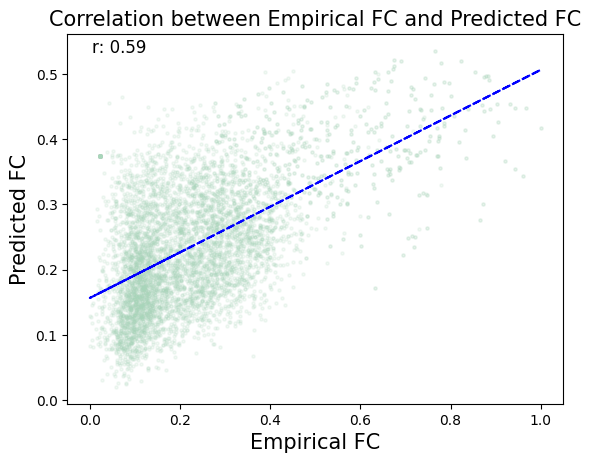

,Network,Adj_R2,Pearson-r
0,Default,0.153211,0.392009
1,DorsAttn,0.214861,0.464345
2,SomMot,0.215954,0.465311
3,Cont,0.173232,0.417038
4,SalVentAttn,0.100738,0.318998
5,Vis,0.349120,0.591339


In [32]:
#Look at the performance of the best combined model (Goni et al. 2014) at the hemispheric level
regression_hemispheric(FC_arr, EuclDist_arr, MSN_arr, MI_arr, num_steps, path_length)

#Look at performance on the RSN level
best_model = regression_network_level(FC_arr, EuclDist_arr, MSN_arr, MI_arr, num_steps, path_length)

<ipython-input-35-c13c8a385620>:18: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=df_melted, x='Network', y='Value', hue='Model', ci=None,


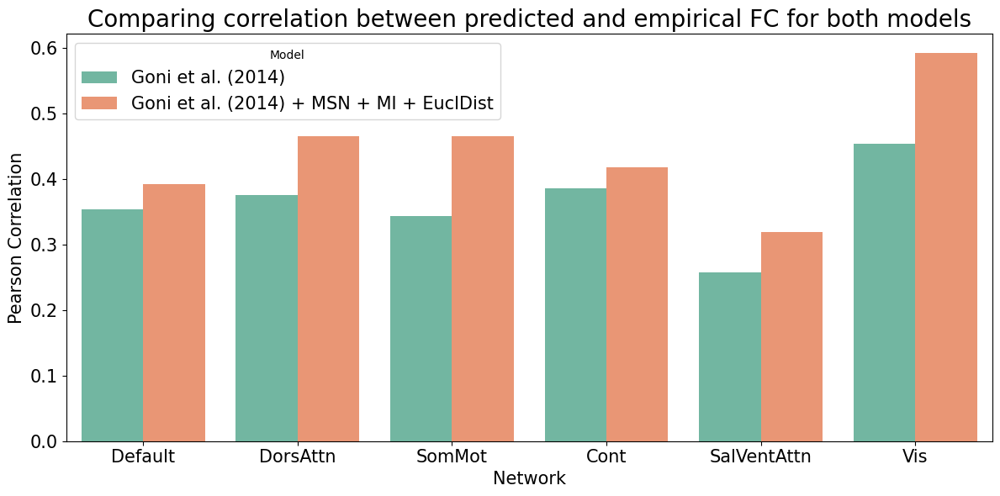

<ipython-input-35-c13c8a385620>:37: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=df_melted, x='Network', y='Value', hue='Model', ci=None,


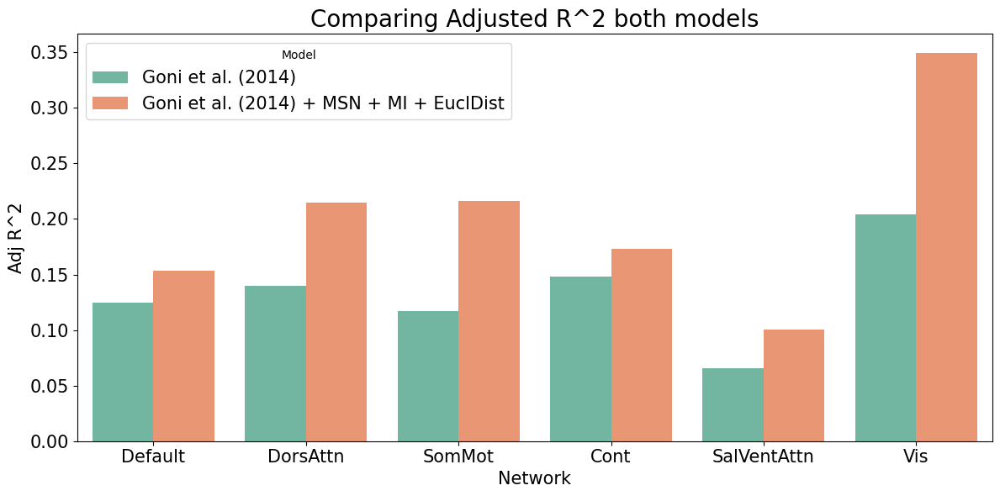

In [35]:
#Make a plot of how the values compare between the dataframes

#Plot both dataframes in a bar chart grouping Networks on the X-axis
# Add a model label to each DataFrame
goni_model['Model'] = 'Goni et al. (2014)'
best_model['Model'] = 'Goni et al. (2014) + MSN + MI + EuclDist'

# Combine them into a single DataFrame
df_combined = pd.concat([goni_model, best_model], ignore_index=True)

# Melt the DataFrame to long format for seaborn plotting
df_melted = df_combined.melt(id_vars=['Network', 'Model'],
                             value_vars=['Pearson-r'],
                             var_name='Metric',
                             value_name='Value')

plt.figure(figsize=(12, 6))
sns.barplot(data=df_melted, x='Network', y='Value', hue='Model', ci=None,
            palette='Set2', dodge=True)

# Add labels and title
plt.title('Comparing correlation between predicted and empirical FC for both models',fontsize=20)
plt.ylabel('Pearson Correlation', fontsize=15)
plt.yticks(fontsize=15)
plt.xticks(fontsize=15)
plt.xlabel('Network', fontsize=15)
plt.legend(title='Model',fontsize=15)
plt.tight_layout()
plt.show()

# Melt the DataFrame to long format for seaborn plotting
df_melted = df_combined.melt(id_vars=['Network', 'Model'],
                             value_vars=['Adj_R2'],
                             var_name='Metric',
                             value_name='Value')
plt.figure(figsize=(12, 6))
sns.barplot(data=df_melted, x='Network', y='Value', hue='Model', ci=None,
            palette='Set2', dodge=True)

plt.title('Comparing Adjusted R^2 both models',fontsize=20)
plt.ylabel('Adj R^2', fontsize=15)
plt.yticks(fontsize=15)
plt.xticks(fontsize=15)
plt.xlabel('Network', fontsize=15)
plt.legend(title='Model',fontsize=15)
plt.tight_layout()
plt.show()


**Re-implementing the Vazquez-Rodriguez et al. (2019) model**

In [ ]:
#Vazquez-Rodriguez (2019) model
#Uses path length, euclidean distance and communicability
from scipy.linalg import expm

communicability = expm(unweighted_SC)
communicability = normalize(communicability)
path_length = normalize(path_length)
EuclDist_arr = normalize(EuclDist_arr)
FC_arr = normalize(FC_arr)

Coefficients: [-0.14727911 -0.09374838 -0.0120897 ]
R-squared: 0.14039284066864166
P-values: ['0.000e+00', '0.000e+00', '1.175e-02']
Adjusted R-squared: 0.14032836368399337


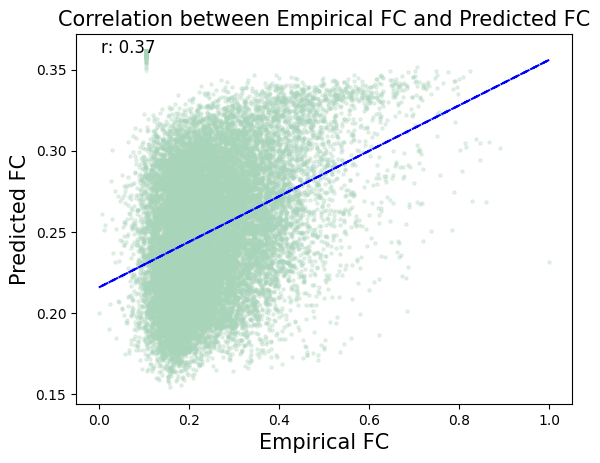

(0.14032836368399337, np.float64(0.37469032636117217))

In [ ]:
multilinear_regression(FC_arr.flatten(), EuclDist_arr.flatten(), path_length.flatten(), communicability.flatten())

Left Hemisphere
Coefficients: [-0.13943402 -0.08765713 -0.02444033]
R-squared: 0.1274545663407376
P-values: ['0.000e+00', '0.000e+00', '3.140e-05']
Adjusted R-squared: 0.12732365834408943


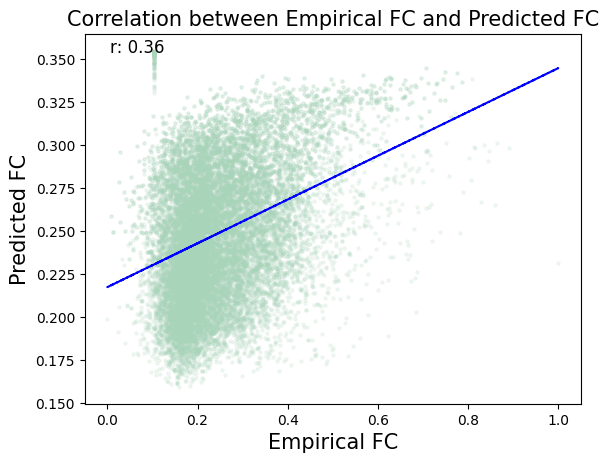

Right Hemisphere
Coefficients: [-0.15540919 -0.10839625  0.05762463]
R-squared: 0.15672876722962026
P-values: ['0.000e+00', '0.000e+00', '2.963e-09']
Adjusted R-squared: 0.15660225124150717


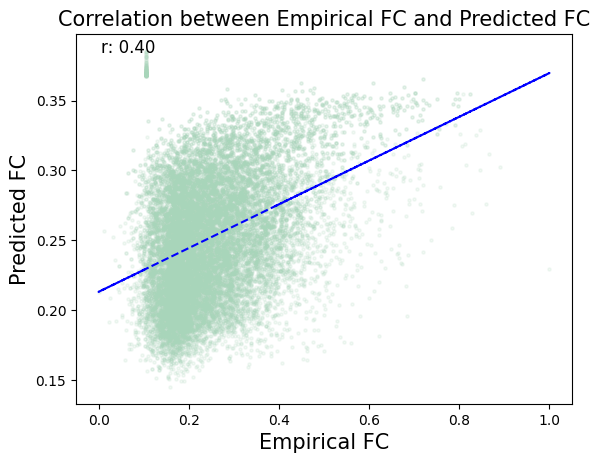

{'SalVentAttn': [44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158], 'Vis': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115], 'SomMot': [15, 12, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134], 'DorsAttn': [31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147], 'Cont': [61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181], 'Default': [74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200]}
SalVentAttn
Coefficients: [-0.18096974 -0.07478819 -0.29731387]
R-squared: 0.113187738

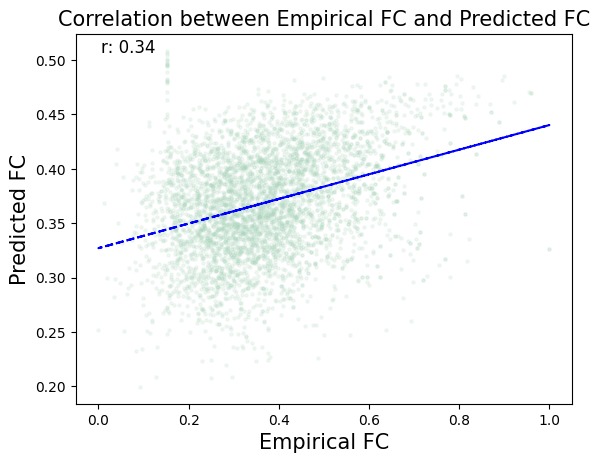

Vis
Coefficients: [-0.42581801 -0.05573867  0.00359325]
R-squared: 0.29635283592818407
P-values: ['0.000e+00', '1.525e-04', '8.224e-01']
Adjusted R-squared: 0.2959886293215216


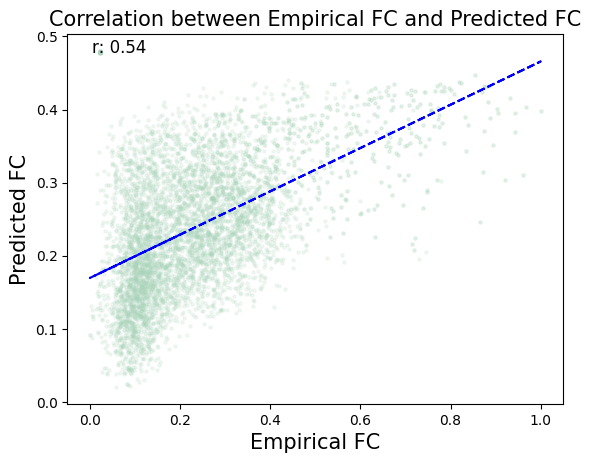

SomMot
Coefficients: [-0.13281782 -0.16932307 -0.38927184]
R-squared: 0.15530277559294936
P-values: ['0.000e+00', '0.000e+00', '0.000e+00']
Adjusted R-squared: 0.15494055551387265


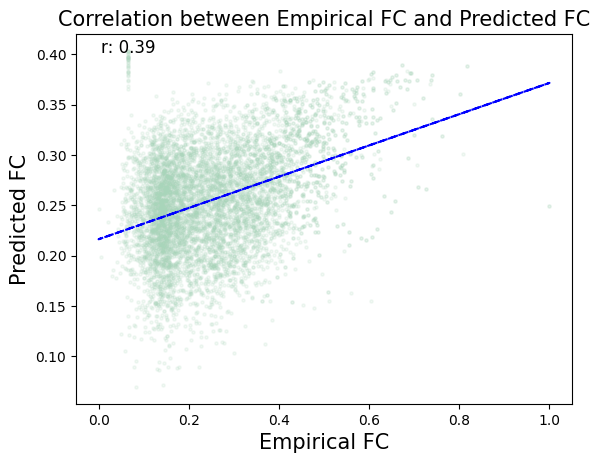

DorsAttn
Coefficients: [-0.27734592 -0.07981239 -0.04652808]
R-squared: 0.18557104077551445
P-values: ['0.000e+00', '5.247e-06', '4.115e-03']
Adjusted R-squared: 0.18510081620321395


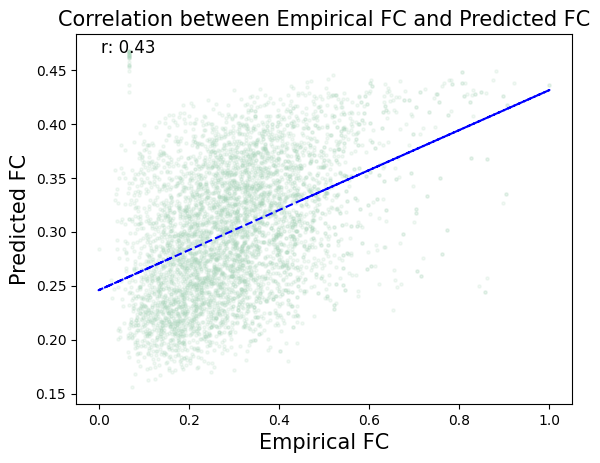

Cont
Coefficients: [-0.03857207 -0.19932713  0.04713985]
R-squared: 0.11839125057216815
P-values: ['3.325e-04', '0.000e+00', '7.857e-05']
Adjusted R-squared: 0.11795015213182725


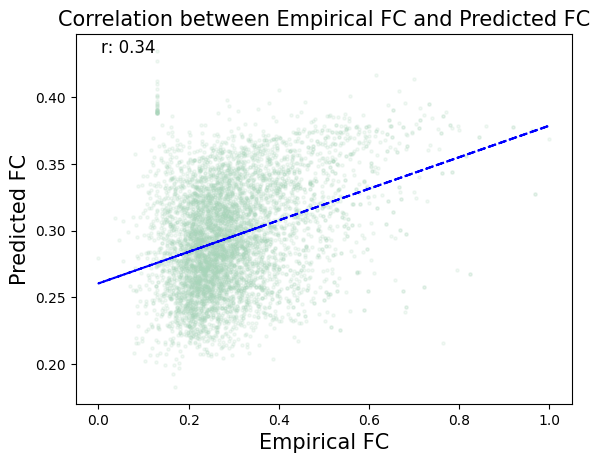

Default
Coefficients: [-0.14273729 -0.03672911  0.14966918]
R-squared: 0.09859376068091263
P-values: ['0.000e+00', '9.127e-05', '0.000e+00']
Adjusted R-squared: 0.09829969600953847


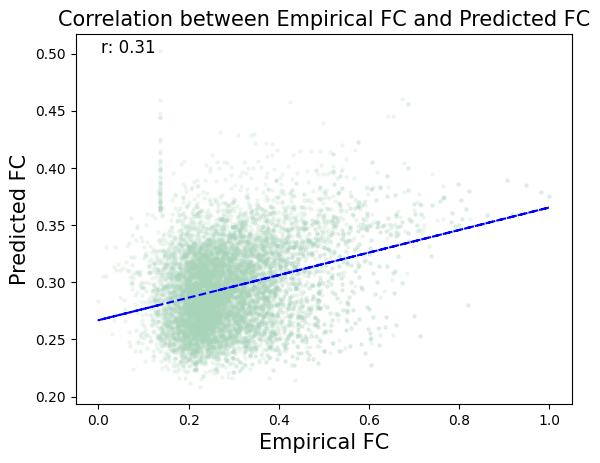

,Network,Adj_R2,Pearson-r
0,SalVentAttn,0.112583,0.336434
1,Vis,0.295989,0.544383
2,SomMot,0.154941,0.394085
3,DorsAttn,0.185101,0.430780
4,Cont,0.117950,0.344080
5,Default,0.098300,0.313996


In [ ]:
#Hemispheric and network level examination of Vazquez-Rodriguez model
regression_hemispheric(FC_arr, EuclDist_arr, path_length, communicability)
vr_model = regression_network_level(FC_arr, EuclDist_arr, path_length, communicability)

Coefficients: [-0.10157203  0.05236734  0.10399399 -0.06216581 -0.07843916]
R-squared: 0.17615262281071498
P-values: ['0.000e+00', '0.000e+00', '0.000e+00', '0.000e+00', '0.000e+00']
Adjusted R-squared: 0.17604962643911048


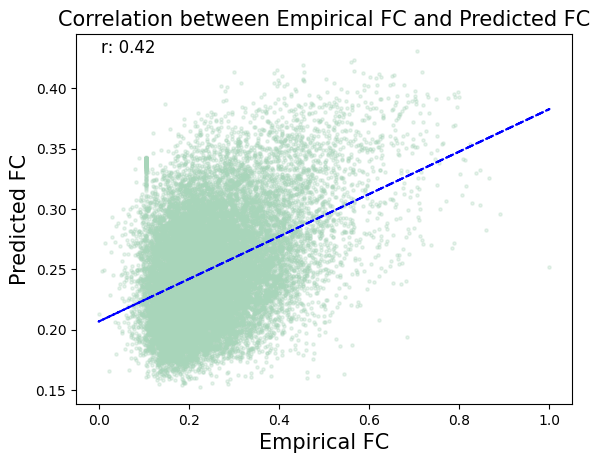

(0.17604962643911048, np.float64(0.4197054000256786))

In [ ]:
#Vazquez-Rodriguez model with my featuers
multilinear_regression(FC_arr.flatten(), EuclDist_arr.flatten(), MSN_arr.flatten(), MI_arr.flatten(), path_length.flatten(), communicability.flatten())

Left Hemisphere
Coefficients: [-0.09484074  0.04866244  0.11322064 -0.05912344 -0.09484276]
R-squared: 0.16406249155183084
P-values: ['0.000e+00', '0.000e+00', '0.000e+00', '0.000e+00', '0.000e+00']
Adjusted R-squared: 0.16385344446059147


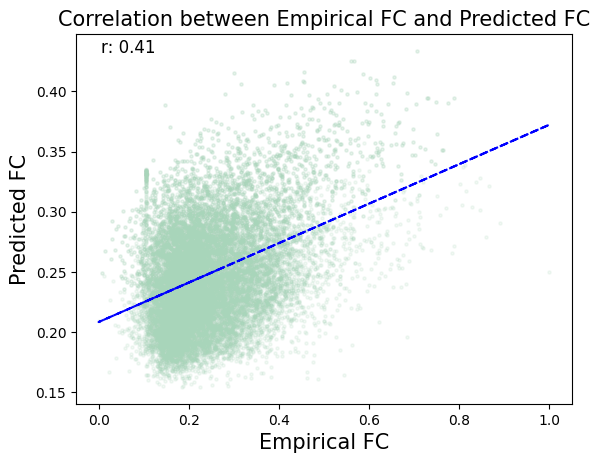

Right Hemisphere
Coefficients: [-0.10980695  0.0552143   0.0908289  -0.07347791 -0.02020055]
R-squared: 0.189775264457279
P-values: ['0.000e+00', '0.000e+00', '0.000e+00', '0.000e+00', '4.913e-02']
Adjusted R-squared: 0.1895726474883026


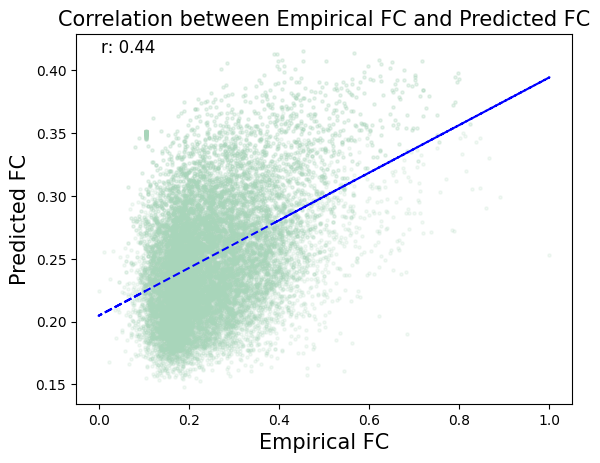

{'Vis': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115], 'Cont': [61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181], 'DorsAttn': [31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147], 'Default': [74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200], 'SalVentAttn': [44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158], 'SomMot': [15, 12, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134]}
Vis
Coefficients: [-0.36186204  0.10284545  0.14995119  0.00288423 -0.11078689]
R-squa

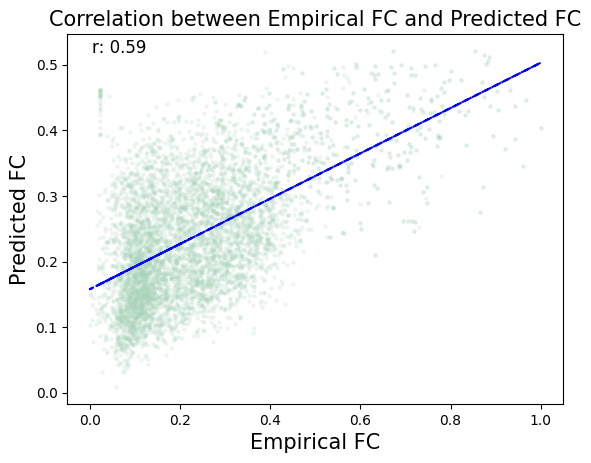

Cont
Coefficients: [ 0.00376674  0.03295397  0.19655883 -0.12332466 -0.05141941]
R-squared: 0.1761963267737806
P-values: ['7.243e-01', '2.843e-12', '0.000e+00', '0.000e+00', '4.772e-05']
Adjusted R-squared: 0.17550913652250755


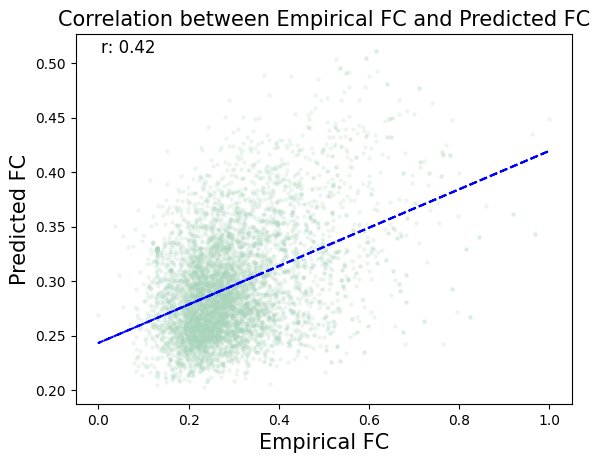

DorsAttn
Coefficients: [-0.20515248  0.06731873  0.13671547 -0.03885488 -0.12021388]
R-squared: 0.21793212111631177
P-values: ['0.000e+00', '0.000e+00', '0.000e+00', '3.525e-02', '1.344e-11']
Adjusted R-squared: 0.21717926409004717


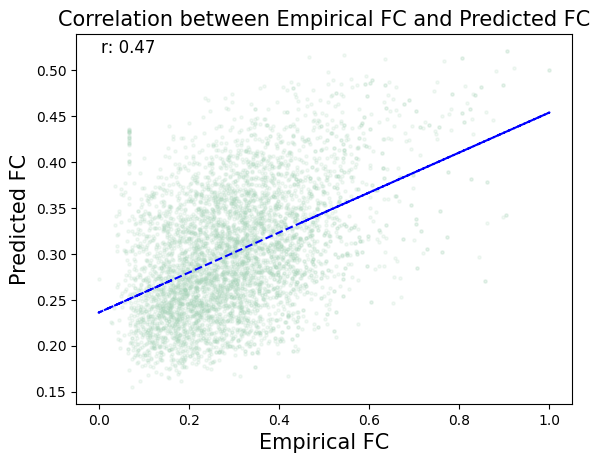

Default
Coefficients: [-0.09836012  0.0421023   0.18110118  0.02442352  0.02904312]
R-squared: 0.1542644623358832
P-values: ['0.000e+00', '0.000e+00', '0.000e+00', '1.224e-02', '8.408e-03']
Adjusted R-squared: 0.15380452349660545


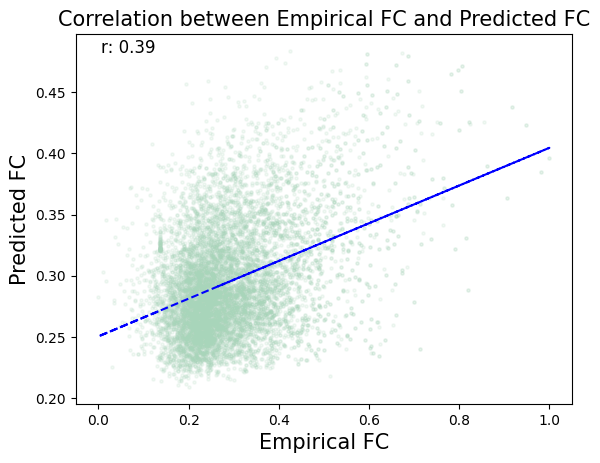

SalVentAttn
Coefficients: [-0.15647511  0.00483898  0.11359127 -0.0254147  -0.36557862]
R-squared: 0.1245122756318483
P-values: ['2.220e-16', '5.064e-01', '7.416e-14', '1.836e-01', '0.000e+00']
Adjusted R-squared: 0.12351604472109723


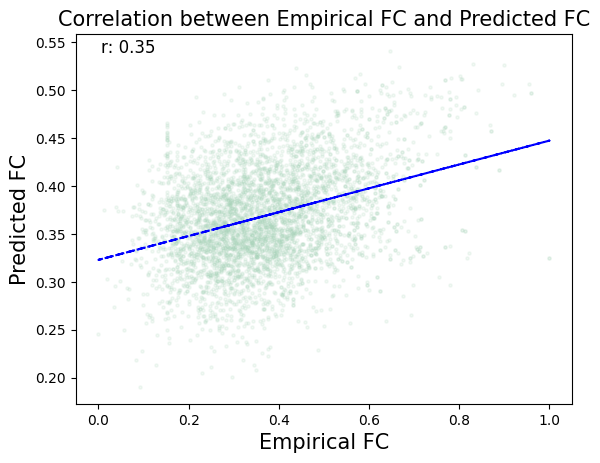

SomMot
Coefficients: [-0.04866518  0.10387947  0.11829428 -0.12709693 -0.40733028]
R-squared: 0.21870017208058556
P-values: ['5.212e-05', '0.000e+00', '0.000e+00', '0.000e+00', '0.000e+00']
Adjusted R-squared: 0.21814162201773213


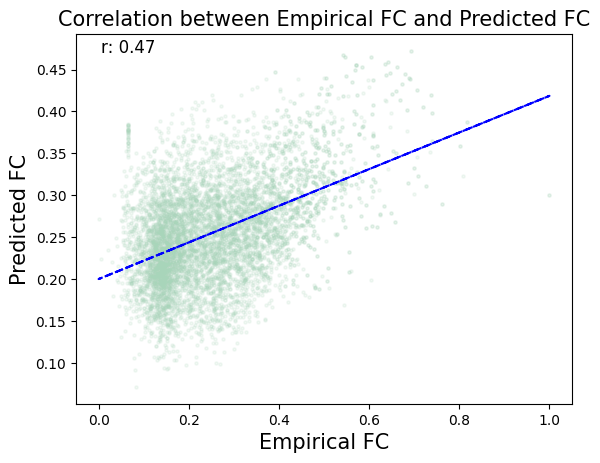

,Network,Adj_R2,Pearson-r
0,Vis,0.344711,0.587602
1,Cont,0.175509,0.419757
2,DorsAttn,0.217179,0.466832
3,Default,0.153805,0.392765
4,SalVentAttn,0.123516,0.352863
5,SomMot,0.218142,0.467654


In [ ]:
#Vazquez-Rodriguez model my features at the hemispheric and RSN network level
regression_hemispheric(FC_arr, EuclDist_arr, MSN_arr, MI_arr, path_length, communicability)
best_model = regression_network_level(FC_arr, EuclDist_arr, MSN_arr, MI_arr, path_length, communicability)

<ipython-input-73-4e1e8778cc67>:17: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=df_melted, x='Network', y='Value', hue='Model', ci=None,


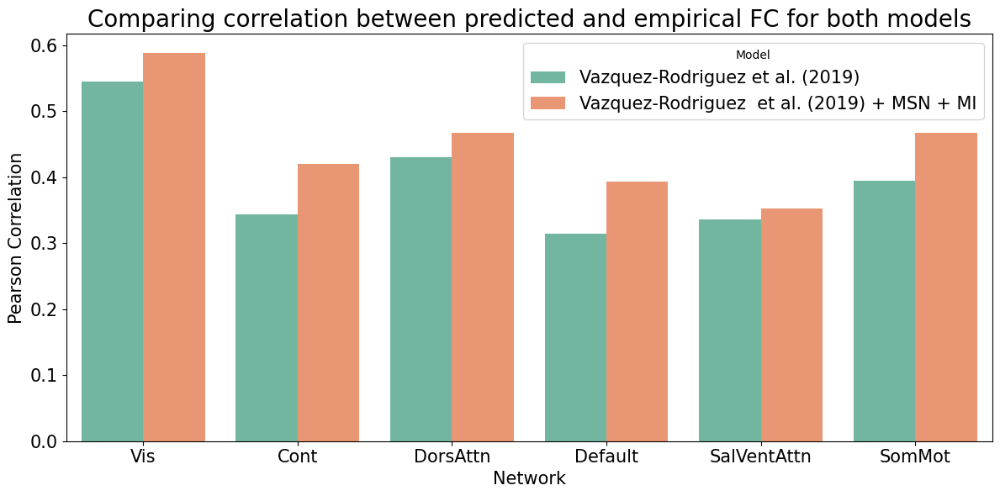

<ipython-input-73-4e1e8778cc67>:36: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=df_melted, x='Network', y='Value', hue='Model', ci=None,


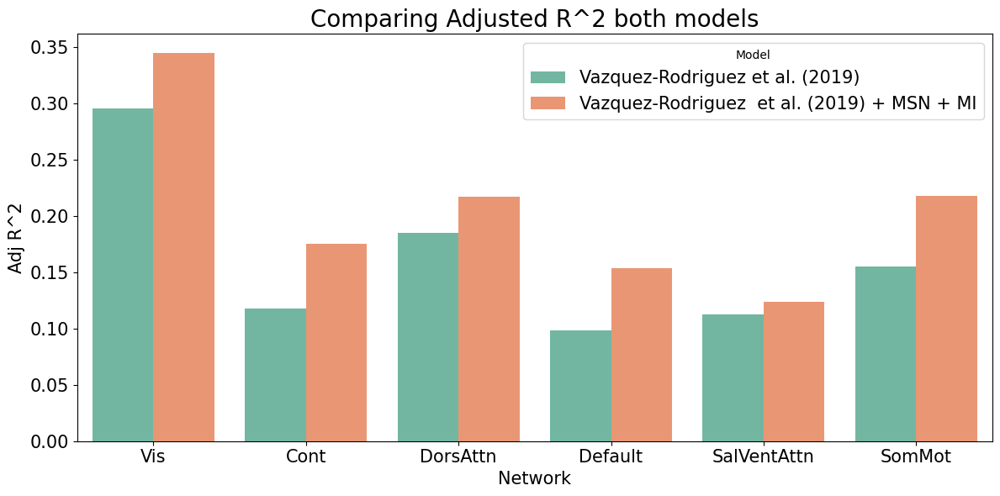

In [ ]:
#Plotting differences in Resting State Networks
#Plot both dataframes in a bar chart grouping Networks on the X-axis
# Add a model label to each DataFrame
vr_model['Model'] = 'Vazquez-Rodriguez et al. (2019)'
best_model['Model'] = 'Vazquez-Rodriguez  et al. (2019) + MSN + MI'

# Combine them into a single DataFrame
df_combined = pd.concat([vr_model, best_model], ignore_index=True)

# Melt the DataFrame to long format for seaborn plotting
df_melted = df_combined.melt(id_vars=['Network', 'Model'],
                             value_vars=['Pearson-r'],
                             var_name='Metric',
                             value_name='Value')

plt.figure(figsize=(12, 6))
sns.barplot(data=df_melted, x='Network', y='Value', hue='Model', ci=None,
            palette='Set2', dodge=True)

# Add labels and title
plt.title('Comparing correlation between predicted and empirical FC for both models',fontsize=20)
plt.ylabel('Pearson Correlation', fontsize=15)
plt.yticks(fontsize=15)
plt.xticks(fontsize=15)
plt.xlabel('Network', fontsize=15)
plt.legend(title='Model',fontsize=15)
plt.tight_layout()
plt.show()

# Melt the DataFrame to long format for seaborn plotting
df_melted = df_combined.melt(id_vars=['Network', 'Model'],
                             value_vars=['Adj_R2'],
                             var_name='Metric',
                             value_name='Value')
plt.figure(figsize=(12, 6))
sns.barplot(data=df_melted, x='Network', y='Value', hue='Model', ci=None,
            palette='Set2', dodge=True)

plt.title('Comparing Adjusted R^2 both models',fontsize=20)
plt.ylabel('Adj R^2', fontsize=15)
plt.yticks(fontsize=15)
plt.xticks(fontsize=15)
plt.xlabel('Network', fontsize=15)
plt.legend(title='Model',fontsize=15)
plt.tight_layout()
plt.show()


**Best Vazquez-Rodriguez et al. (2019) model + Heterogeneous Linear Threshold Model**

See the linear_threshold_model.ipynb to derive a linear threshold model, you can save one to your drive and load it in the path below.

array([[  0,   1,   2, ..., 197, 198, 199],
       [  0,  62,  32, ...,   3,   3,   8],
       [ 62,   0,  48, ...,   1,   3,  11],
       ...,
       [  3,   1,   5, ...,   0,  55,  35],
       [  3,   3,   8, ...,  55,   0,  65],
       [  8,  11,  19, ...,  35,  65,   0]])

(200, 200)
(200, 200)
Coefficients: [ 0.30100238  0.04748334 -0.00320439 -0.08370753 -0.03350974 -0.0339333 ]
R-squared: 0.21944013176967758
P-values: ['0.000e+00', '0.000e+00', '4.437e-01', '0.000e+00', '3.109e-15', '3.988e-11']
Adjusted R-squared: 0.21932302729616016


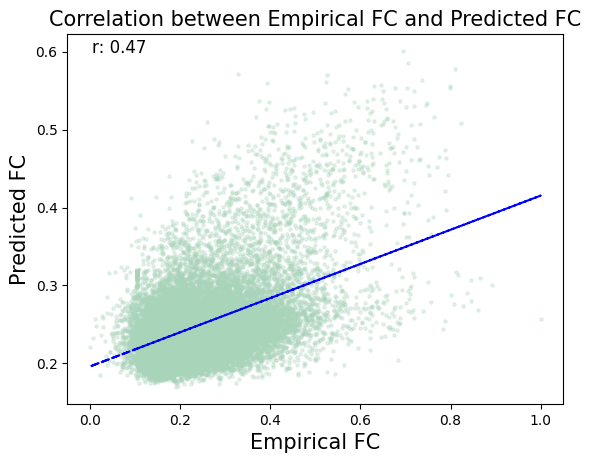

(0.21932302729616016, np.float64(0.46844437425341934))

In [ ]:
#Multilinear model with additional predictor -> T1 weighted predictor
association_weight = pd.read_csv('/content/drive/MyDrive/association_matrix_output.csv', header=None).to_numpy()
display(association_weight)

#remove the first row of association_weight matrix
association_weight = np.delete(association_weight, 0, axis=0)
print(association_weight.shape)

#multilinear_regression(FC_arr, NoS_arr, EuclDist_arr, MSN_arr, MI_arr, association_weight)
association_weight = normalize(association_weight)
FC_arr = normalize(FC_arr)
print(association_weight.shape)
multilinear_regression(FC_arr.flatten(), association_weight.flatten(), MSN_arr.flatten(), MI_arr.flatten(), EuclDist_arr.flatten(), path_length.flatten(), communicability.flatten())
